# Imports

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

# This example imports functions from the DemoReadSGLXData module to read
# digital data. The metadata file must be present in the same directory as the binary file.
# Works with both imec and nidq digital channels.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from scipy.interpolate import interp1d
from scipy.signal import savgol_filter
from scipy import stats
from scipy.stats import linregress, spearmanr, kendalltau, pearsonr, circstd
from statsmodels.stats.multitest import multipletests
from pathlib import Path
from tkinter import Tk
from tkinter import filedialog
from DemoReadSGLXData.readSGLX import readMeta, SampRate, makeMemMapRaw, ExtractDigital
from datetime import datetime
from scipy.io import savemat, loadmat
from sklearn.manifold import Isomap
import mat73, time, itertools
from ripser import ripser as tda
import matplotlib.gridspec as gridspec
from matplotlib_venn import venn2, venn3
import dill as pickle
mpl.rcParams['pdf.fonttype'] = 42 
mpl.rcParams['font.sans-serif']=['Arial', 'Helvetica','Bitstream Vera Sans', 'DejaVu Sans', 'Lucida Grande', 
                                 'Verdana', 'Geneva', 'Lucid', 'Avant Garde', 'sans-serif']  

# for publication quality plots
def set_pub_plots(pal=sns.blend_palette(["gray","crimson", 'cyan', 'magenta', 'purple'  ],5)):
    sns.set_style("white")
    sns.set_palette('pastel')
    sns.set_context("poster", font_scale=1.5, rc={"lines.linewidth": 2.5, "axes.linewidth":2.5, 'figure.facecolor': 'white'}) 
    sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})
    # optional, makes markers bigger, too, axes.linewidth doesn't seem to work
    plt.rcParams['axes.linewidth'] = 2.5

rc_pub={'font.size': 25, 'axes.labelsize': 25, 'legend.fontsize': 25.0, 
    'axes.titlesize': 25, 'xtick.labelsize': 25, 'ytick.labelsize': 25, 
    #'axes.color_cycle':pal, # image.cmap - rewritesd the default colormap
    'axes.linewidth':2.5, 'lines.linewidth': 2.5,
    'xtick.color': 'black', 'ytick.color': 'black', 'axes.edgecolor': 'black','axes.labelcolor':'black','text.color':'black'}
# to restore the defaults, call plt.rcdefaults() 

#set_pub_bargraphs()
set_pub_plots()
sns.set_context('poster')
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False


# % 1 = position
# % 2 = linear velocity
# % 3 = Angular velocity
# % 4 = HD
# % 5 = theta phase
# % 8 = HD + postion
# % 11 = HD + linear velocity
# % 13 = HD + angular velocity
# % 15 = HD + theta phase
# % 17 = HD + position + linear velocity
# % 19 = HD + position + angular velocity
# % 21 = HD + position + theta phase
# % 22 = HD + Linear velocity + angular velocty
# % 24 = HD + Linear velocity + theta phase
# % 25 = HD + Angular velocity + theta phase
# % 26 = HD + Position + Linear velocity + Angular velocity
# % 28 = HD + Position + Linear velocity + Theta Phase
# % 29 = HD + Position + Angular velocity + Theta Phase
# % 30 = HD + Linear Velocity + Angular velocity + Theta Phase
# % 31 = HD + Position + Linear Velocity +Angular velocity + Theta Phase

### Functions

In [2]:
def bin_smooth_spk(df, binSize):
    binSize = 0.02
    trace_length = round(df.spk.max())
    boxcar = np.ones(int(1/binSize))
    edges = np.arange(0, trace_length, binSize)
    ls_df = [] 
    for unit in df.cid.unique():
        spkt = df[df.cid == unit].spk
        hist, bins = np.histogram(spkt, bins = edges)
        spkd = np.convolve(hist, boxcar, mode = 'same')
        df_tmp = pd.DataFrame({'cid': unit, 'hz': spkd, 'times': bins[:-1]})
        ls_df.append(df_tmp)
    #     print(spkt)
    df_out = pd.concat(ls_df)
    return df_out

In [3]:
def adjust_offset_emb(y, dec):
    yerr = ((y[:] - dec[:]) + 180)%360 - 180
    offset = np.mean((yerr))
    # adjust offset
    dec = (dec + offset) % 360 
    return dec

def decode_az_isomap(x, y, yaw):
    dec_err = 0
    yaw_dec = 0
    yaw_dec_xy = np.arctan2(x, y)*180/np.pi
    yaw_dec_yx = np.arctan2(y, x)*180/np.pi
        
    yaw_dec_xy1 = yaw_dec_xy + 180
    yaw_dec_yx1 = yaw_dec_yx + 180
    
    yaw_dec_xy2 = yaw_dec_xy
    yaw_dec_xy2[yaw_dec_xy2 < 0] = yaw_dec_xy2[yaw_dec_xy2 < 0] + 360
    
    yaw_dec_yx2 = yaw_dec_yx
    yaw_dec_yx2[yaw_dec_yx2 < 0] = yaw_dec_yx2[yaw_dec_yx2 < 0] + 360
    
    yaw_dec_xy1 = adjust_offset_emb(yaw, yaw_dec_xy1)
    yaw_dec_xy2 = adjust_offset_emb(yaw, yaw_dec_xy2)
    yaw_dec_yx1 = adjust_offset_emb(yaw, yaw_dec_yx1)
    yaw_dec_yx2 = adjust_offset_emb(yaw, yaw_dec_yx2)
    
    dec_err1 = np.mean(abs(((yaw[:] - yaw_dec_xy1[:]) + 180)%360 - 180))
    dec_err2 = np.mean(abs(((yaw[:] - yaw_dec_xy2[:]) + 180)%360 - 180))
    dec_err3 = np.mean(abs(((yaw[:] - yaw_dec_yx1[:]) + 180)%360 - 180))
    dec_err4 = np.mean(abs(((yaw[:] - yaw_dec_yx2[:]) + 180)%360 - 180))
    
    dec_arr = np.array((dec_err1, dec_err2, dec_err3, dec_err4))
    idx = dec_arr.argmin()
    if idx == 0:
        yaw_dec = yaw_dec_xy1
    elif idx == 1:
        yaw_dec = yaw_dec_xy2
    elif idx == 2:
        yaw_dec = yaw_dec_yx1
    elif idx == 3:
        yaw_dec = yaw_dec_yx2
        
    return yaw_dec, dec_arr[idx], idx

In [4]:
def get_stat_run_epochs(speed, window_size = 25, speed_thr = 4):
    speed = abs(speed)
    speed = speed[:speed.size//window_size*window_size]
    speed_bin_mean = np.nanmean(speed.reshape(-1, window_size), 1)  
    speed_idx = np.concatenate([np.arange(pair[0]*window_size, pair[0]*window_size + window_size) for 
                            pair in enumerate(speed_bin_mean) if pair[1] > speed_thr])[:]
    stat_idx = np.concatenate([np.arange(pair[0]*window_size, pair[0]*window_size + window_size) for 
                            pair in enumerate(speed_bin_mean) if pair[1] <= speed_thr])[:]
    return stat_idx, speed_idx




In [5]:
def get_shank_from_ch(ch, probe_conf):
    sh = -1
    if ch in d_probe_conf[probe_conf]['shank0']:
        sh = 0
    elif ch in d_probe_conf[probe_conf]['shank1']:
        sh = 1
    elif ch in d_probe_conf[probe_conf]['shank2']:
        sh = 2
    elif ch in d_probe_conf[probe_conf]['shank3']:
        sh = 3
    return sh

In [6]:
def consecutive(data, stepsize=1):
    return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)

a = np.array([0, 47, 48, 49, 50, 97, 98, 99])
b = consecutive(a)

def ang_diff(a1, a2):
    a1 = np.array(a1)
    a2 = np.array(a2)
    return 180 - abs(abs(a1 - a2) - 180)

ang_diff(300, 45)


np.int64(105)

In [7]:
# def get_long_bettibars(h0, h1, h2):
#     h0[~np.isfinite(h0)] = 60
#     plot_prcnt = [95, 50, 50] # order is h0, h1, h2
#     to_plot = []
#     for curr_h, cutoff in zip([h0, h1, h2], plot_prcnt):
# #         print(curr_h.shape)
#         if curr_h.shape[0] < 100:
#             plot_h = curr_h
#         else:
#             bar_lens = curr_h[:,1] - curr_h[:,0]
#             plot_h = curr_h[bar_lens > np.percentile(bar_lens, cutoff)]
#         if cutoff == plot_prcnt[1]: 
#             long_bar = sorted(plot_h[:, 1] - plot_h[:, 0])[-1]
#         #         print(long_bar)
#         to_plot.append(plot_h)
        
#     return to_plot, long_bar

def compute_dYaw(yaw):

    dYaw = np.gradient(yaw)            
    idx_pos = np.where((dYaw > 180))[0]
    idx_neg = np.where((dYaw < -180))[0]

    dYaw[idx_pos] = dYaw[idx_pos] - 360
    dYaw[idx_neg] = dYaw[idx_neg] + 360
    
#     deltaYaw_filt = savgol_filter(dYaw, window_length=11, polyorder=2)
    # max 250 deg/s
    dYaw[abs(dYaw) > 5] = 0

    return dYaw

def compute_ringness(inp):
 
    dist_tmp = []
    vis_dist = []
    x = inp[:,0]
    y = inp[:,1]
    n_samples10 = x.size//4
    centroid = np.mean(inp, axis = 0)
    
    xmin, xmax = x.min(), x.max()
    ymin, ymax = y.min(), y.max()
    viscenter = (xmin + xmax)/2, (ymin + ymax)/2
    
    for idx in range(inp.shape[0]):
#         dist_tmp.append(math.dist(centroid[:],data[idx,:]))
        dist_tmp.append(np.linalg.norm(centroid-inp[idx, :])) 
        vis_dist.append(np.linalg.norm(viscenter-inp[idx, :]))
        
#     dist_tmp.sort(reverse = True)
    vis_dist_out = vis_dist.copy()
    vis_dist.sort()
    bot10 = vis_dist[:n_samples10]
    vis_dist.sort(reverse = True)
    top10 = vis_dist[:n_samples10]
    
    radius = np.mean(dist_tmp[:])
#     vis_radius = np.mean(vis_dist[:])
    ringness = np.mean(bot10)/np.mean(top10)*radius
#     for idx in range(data.shape[0]):
#         ringness.append(np.abs(np.sqrt((data[idx,0]-centroid[0])**2+(data[idx,1]-centroid[1])**2)-radius))
    
    return radius, centroid, ringness, vis_dist_out

def compute_radius(x, y):
    xmin, xmax = x.min(), x.max()
    ymin, ymax = y.min(), y.max()
    viscenter = (xmin + xmax)/2, (ymin + ymax)/2
    
    vis_r = np.sqrt((x - viscenter[0])**2 + (y - viscenter[1])**2)
    r = np.sqrt(x**2 + y**2)
    return r, vis_r

In [8]:
def compute_betti(isomap_emb):
    H1_rates = isomap_emb
    barcodes = tda(H1_rates, maxdim=1, coeff=2)['dgms']
    h0 = barcodes[0]
    h1 = barcodes[1]

    # H2. Need to subsample points for computational tractability if 
    # number of points is large (can go higher but very slow)
    if len(H1_rates) > 1500:
        idx = np.random.choice(np.arange(len(H1_rates)), 1500, replace=False)
        H2_rates = H1_rates[idx]
    else:
        H2_rates = H1_rates
    barcodes = tda(H2_rates, maxdim=2, coeff=2)['dgms']
    h2 = barcodes[2]
    return h0, h1, h2

def get_long_bettibars(h0, h1, h2):
    h0[~np.isfinite(h0)] = 60
    plot_prcnt = [95, 90, 50] # order is h0, h1, h2
    to_plot = []
    for curr_h, cutoff in zip([h0, h1, h2], plot_prcnt):
#         print(curr_h.shape)
        top_indices  = np.argsort(curr_h[:, 1] - curr_h[:, 0])[-20:]
#         if curr_h.shape[0] < 100:
        plot_h = curr_h
#         else:
#             bar_lens = curr_h[:,1] - curr_h[:,0]
#             plot_h = curr_h[bar_lens > np.percentile(bar_lens, cutoff)]
        if cutoff == plot_prcnt[1]: 
            long_bar = sorted(curr_h[:, 1] - curr_h[:, 0])[-1]
        to_plot.append(curr_h[top_indices])
        
    return to_plot, long_bar

In [8]:
d_probe_conf = {}
# h1
d_probe_conf['h1'] = {
    'shank0': np.concatenate((np.arange(48), np.arange(96, 144))),
    'shank1': np.concatenate((np.arange(48, 96), np.arange(144, 192))),
    'shank2': np.concatenate((np.arange(192, 240), np.arange(288, 336))),
    'shank3': np.concatenate((np.arange(240, 288), np.arange(336, 384)))
}
# h2
d_probe_conf['h2'] = {
    'shank0': np.concatenate((np.arange(192, 240), np.arange(288, 336))),
    'shank1': np.concatenate((np.arange(240, 288), np.arange(336, 384))),
    'shank2': np.concatenate((np.arange(48), np.arange(96, 144))),
    'shank3': np.concatenate((np.arange(48, 96), np.arange(144, 192))),

}

In [ ]:
path = r'z:\Users\Alex\Data Analysis\Matlab\Kilosort\configFiles\hStripe_bottom_second_kilosortChanMap.mat'
# path = r'z:\Users\Alex\Data Analysis\Matlab\Kilosort\configFiles\hStripe_bottom_row_kilosortChanMap.mat'
# path = r"z:\Users\Alex\Data Analysis\Matlab\Kilosort\configFiles\hStripe_96_bottom_3_kilosortChanMap.mat"
# path = r"z:\Users\Alex\Data Analysis\Matlab\Kilosort\configFiles\hStripe_142_bottom_4_kilosortChanMap.mat"
mat = loadmat(path)
mat.keys()

In [ ]:
ch_coord = np.array(list(zip(mat['xcoords'].flatten(), mat['ycoords'].flatten())))
probe_bank = 'h2'
for idx, ch in enumerate(ch_coord[:]):
#     print(ch)
    if idx in d_probe_conf[probe_bank]['shank0']:
        plt.plot(ch[0], ch[1], '.', c = 'g')
    if idx in d_probe_conf[probe_bank]['shank1']:
        plt.plot(ch[0], ch[1], '.', c = 'y')
    if idx in d_probe_conf[probe_bank]['shank2']:
        plt.plot(ch[0], ch[1], '.', c = 'r')
    if idx in d_probe_conf[probe_bank]['shank3']:
        plt.plot(ch[0], ch[1], '.', c = 'b')

In [9]:
# both arena and hr present
good_sess = ['JA0144_20211212',  'JA0153_20220209', 'JA0162_20220302', 'JA0164_20220419',
             'JA0178_20220819', 'JA0181_20220812', 'JA0181_20220815', 'JA0181_20220818',
             'MC022_20220712', 'JA0153_20220126' ]

### Load processed data

In [13]:
# path = r'y:\Users\Alex\Data Analysis\df_hrtun_run.pkl'
# df_hrtun_run = pd.read_pickle(path)
# df_hrtun_run.head()

In [10]:
path = '/Volumes/SSD1/Postdoc/Data Analysis/VR1 ATN data/HR_processed_data/df_hr_taucorr5.pkl'
df_hr_taucorr = pd.read_pickle(path)
df_hr_taucorr.head()

,pair,tau,pval,rec_id,dts,cond,hdc_pair,run,animal_name,n_hdc,rec_sess,abstau
0,"(25.0, 51.0)",-0.200876,8.440973e-277,20211207_JA0144_dark1,20211207,dark1,1_1,all,JA0144,8,JA0144_20211207,0.200876
0,"(25.0, 51.0)",-0.239519,1.527409e-141,20211207_JA0144_dark1,20211207,dark1,1_1,stat,JA0144,8,JA0144_20211207,0.239519
0,"(25.0, 51.0)",-0.183297,6.661943e-149,20211207_JA0144_dark1,20211207,dark1,1_1,run,JA0144,8,JA0144_20211207,0.183297
0,"(25.0, 62.0)",-0.014558,6.474542e-03,20211207_JA0144_dark1,20211207,dark1,1_1,all,JA0144,8,JA0144_20211207,0.014558
0,"(25.0, 62.0)",-0.042756,1.093612e-06,20211207_JA0144_dark1,20211207,dark1,1_1,stat,JA0144,8,JA0144_20211207,0.042756


In [11]:
# path = '/Volumes/SSD1/Postdoc/Data Analysis/VR1 ATN data/HR_processed_data/d_hr_data.p'
# d_hr_data = pd.read_pickle(path)
# d_hr_data.keys()

In [12]:
path = '/Volumes/SSD1/Postdoc/Data Analysis/VR1 ATN data/HR_processed_data/d_hr_emb5.p'
# with open(path, 'rb') as handle:
#     d_hr_emb = pickle.load(handle)
d_hr_emb = pd.read_pickle(path)
d_hr_emb.keys()

dict_keys(['20211207_JA0144_light1', '20220126_JA0153_light1', '20220126_JA0153_lightHR1', '20220302_JA0162_light1', '20220302_JA0162_lightHR1', '20220419_JA0164_light1', '20220419_JA0164_lightHR1', '20220819_JA0178_light1', '20220819_JA0178_lightHR1', '20220822_JA0178_light1', '20220822_JA0178_lightHR1', '20220906_JA0178_light1', '20220812_JA0181_light1', '20220812_JA0181_lightHR1', '20220815_JA0181_light1', '20220815_JA0181_lightHR1', '20220818_JA0181_light1', '20220818_JA0181_lightHR1', '20220712_MC022_light1', '20220712_MC022_lightHR1', '20220126_JA0153_dark1', '20220126_JA0153_darkHR1', '20220302_JA0162_dark1', '20220302_JA0162_darkHR1', '20220419_JA0164_dark1', '20220419_JA0164_darkHR1', '20220819_JA0178_dark1', '20220819_JA0178_darkHR1', '20220822_JA0178_dark1', '20220822_JA0178_darkHR1', '20220906_JA0178_dark1', '20220906_JA0178_darkHR1', '20220812_JA0181_dark1', '20220812_JA0181_darkHR1', '20220815_JA0181_dark1', '20220815_JA0181_darkHR1', '20220818_JA0181_dark1', '20220818_JA

In [13]:
path = '/Volumes/SSD1/Postdoc/Data Analysis/VR1 ATN data/HR_processed_data/df_hr_betti5.pkl'
df_hr_betti = pd.read_pickle(path)
df_hr_betti.head()

,rec_id,cond,dts,animal_name,az_occ,run,h1_bar,dec_err,rec_session,stat_off_manifold,run_ratio
0,20211207_JA0144_light1,light1,20211207,JA0144,0.916667,stat,5.956747,27.552,JA0144_20211207,0.155352,0.659375
0,20211207_JA0144_light1,light1,20211207,JA0144,1.000000,locom,6.397861,24.376,JA0144_20211207,0.155352,0.659375
0,20220126_JA0153_light1,light1,20220126,JA0153,0.916667,stat,14.210236,22.769,JA0153_20220126,0.179570,0.612500
0,20220126_JA0153_light1,light1,20220126,JA0153,1.000000,locom,15.542182,27.529,JA0153_20220126,0.179570,0.612500
0,20220126_JA0153_lightHR1,lightHR1,20220126,JA0153,0.944444,stat,5.941467,28.507,JA0153_20220126,0.625000,0.433333


In [14]:
path = '/Volumes/SSD1/Postdoc/Data Analysis/VR1 ATN data/HR_processed_data/df_hrtun_run5.pkl'
df_hrtun_run = pd.read_pickle(path)
df_hrtun_run.head()

,hz,dir,cids,animal_name,r,p_val,rec_id,date_name,run,cond,rec_session,cuid
0,0.302632,0.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1
1,0.896024,20.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1
2,1.610294,40.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1
3,0.875433,60.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1
4,0.877301,80.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1


### Load cluster info files

In [20]:
path = Path(r'z:\Data\Mice\VR\Alex\Head_restrainer\HR') 
cluster_files = list(path.glob('**/*info.tsv'))
print(len(cluster_files[:]))

14


In [21]:
cluster_files

[WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/HR/bad JA0179/08_08_bad/conc/cluster_info.tsv'),
 WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/HR/bad_JA0180/08_09/conc/cluster_info.tsv'),
 WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/HR/JA0153/20220126/conc/cluster_info.tsv'),
 WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/HR/JA0178/20220819/conc/cluster_info.tsv'),
 WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/HR/JA0178/20220822/conc/cluster_info.tsv'),
 WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/HR/JA0178/20220824/conc/cluster_info.tsv'),
 WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/HR/JA0178/20220829/conc/cluster_info.tsv'),
 WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/HR/JA0178/20220906/conc/cluster_info.tsv'),
 WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/HR/JA0181/20220812/conc/cluster_info.tsv'),
 WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/HR/JA0181/20220815/conc/cluster_info.tsv'),
 WindowsPath('z:/Data/Mice/VR/Alex/Head_rest

### Load dvt files

In [22]:
cond_d = {'light1': 'light1', 'dark': 'dark1', 'dark_hr': 'darkHR1', 'light_hr': 'lightHR1' } 
dvt_files = [r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0100\20210420\001\LIGHT1\20210420_JA0100_LIGHT1.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0100\20210420\001\DARK\20210420_JA0100_DARK.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0100\20210421\001\LIGHT1\20210421_JA0100_LIGHT1.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0100\20210421\001\DARK\20210421_JA0100_DARK.DVT",
             
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0144\20211212\001\DARK_HR\20211207_JA0144_DARKHR.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0144\20211212\001\LIGHT_HR\20211207_JA0144_LIGHTHR.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0144\20211212\001\LIGHT1\20211207_JA0144_LIGHT1.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0144\20211212\001\DARK\20211207_JA0144_DARK.DVT",
             
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0153\20220209\001\LIGHT1\20220126_JA0153_LIGHT1.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0153\20220209\001\DARK\20220126_JA0153_DARK.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0153\20220209\001\LIGHT_HR\20220126_JA0153_LIGHTHR_hstripe1.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0153\20220209\001\DARK_HR\20220126_JA0153_DARKHR_hstripe1.DVT",
             
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0162\20220302\001\DARK\20220302_JA0162_DARK_hstripe1.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0162\20220302\001\DARK_HR\20220302_JA0162_DARK_HR_hstripe1.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0162\20220302\001\LIGHT_HR\20220302_JA0162_LIGHT1_HR_hstripe1.DVT",
             r"y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0162\20220302\001\LIGHT1\20220302_JA0162_LIGHT1_hstripe1.DVT",
             
             r'y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0164\20220419\001\DARK_HR\20220419_JA0164_lADN_hstripe2_DARK_HR.DVT',
             r'y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0164\20220419\001\LIGHT_HR\20220419_JA0164_lADN_hstripe2_LIGHT_HR.DVT',
             r'y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0164\20220419\001\DARK\20220419_JA0164_lADN_hstripe2_DARK.DVT',
             r'y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0164\20220419\001\LIGHT1\20220419_JA0164_lADN_hstripe2_LIGHT1.DVT',
             
             r'y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0164\20220426\001\DARK_HR\20220426_JA0164_hstripe2_DARK_HR.DVT',
             r'y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0164\20220426\001\LIGHT_HR\20220426_JA0164_hstripe2_LIGHT_HR.DVT',
             r'y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0164\20220426\001\DARK\20220426_JA0164_hstripe2_DARK.DVT',
             r'y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0164\20220426\001\LIGHT1\20220426_JA0164_hstripe2_LIGHT1.DVT'
             
]

path = Path(r'z:\Data\Mice\VR\Alex\Head_restrainer\HR')
dvt_files_2 = list(path.glob('**/*.dvt'))
dvt_files_2 = [str(fn) for fn in dvt_files_2]
dvt_files_3 = dvt_files + dvt_files_2



In [23]:
dvt_files

['y:\\Data\\Mice\\VR\\Janna\\DATA_CHRONIC\\JA0100\\20210420\\001\\LIGHT1\\20210420_JA0100_LIGHT1.DVT',
 'y:\\Data\\Mice\\VR\\Janna\\DATA_CHRONIC\\JA0100\\20210420\\001\\DARK\\20210420_JA0100_DARK.DVT',
 'y:\\Data\\Mice\\VR\\Janna\\DATA_CHRONIC\\JA0100\\20210421\\001\\LIGHT1\\20210421_JA0100_LIGHT1.DVT',
 'y:\\Data\\Mice\\VR\\Janna\\DATA_CHRONIC\\JA0100\\20210421\\001\\DARK\\20210421_JA0100_DARK.DVT',
 'y:\\Data\\Mice\\VR\\Janna\\DATA_CHRONIC\\JA0144\\20211212\\001\\DARK_HR\\20211207_JA0144_DARKHR.DVT',
 'y:\\Data\\Mice\\VR\\Janna\\DATA_CHRONIC\\JA0144\\20211212\\001\\LIGHT_HR\\20211207_JA0144_LIGHTHR.DVT',
 'y:\\Data\\Mice\\VR\\Janna\\DATA_CHRONIC\\JA0144\\20211212\\001\\LIGHT1\\20211207_JA0144_LIGHT1.DVT',
 'y:\\Data\\Mice\\VR\\Janna\\DATA_CHRONIC\\JA0144\\20211212\\001\\DARK\\20211207_JA0144_DARK.DVT',
 'y:\\Data\\Mice\\VR\\Janna\\DATA_CHRONIC\\JA0153\\20220209\\001\\LIGHT1\\20220126_JA0153_LIGHT1.DVT',
 'y:\\Data\\Mice\\VR\\Janna\\DATA_CHRONIC\\JA0153\\20220209\\001\\DARK\\20220126_

In [24]:
def interpolate_nan(array):
    array_cp = array.copy()
    nan_indices = np.isnan(array_cp)
    non_nan_indices = ~nan_indices
    array_cp[nan_indices] = np.interp(np.flatnonzero(nan_indices), np.flatnonzero(non_nan_indices), array_cp[non_nan_indices])
    return array_cp

In [840]:
ls_dvt = []
dt = 0.0333333

for fn in dvt_files_3:
    print(fn)
    mouse_name = fn.split("\\")[-1].split('_')[1]
    date_name = fn.split("\\")[-1].split('_')[0]
    cond = fn.split("\\")[9].lower()
    
    tmp_dvt = pd.read_csv(fn, header = None)
    tmp_dvt.columns = ['sample', 'times', 'left_x', 'left_y', 'right_x', 'right_y']
    tmp_dvt.loc[:, 'mouse_name'] = mouse_name
    tmp_dvt.loc[:, 'date_name'] = date_name
    tmp_dvt.loc[:, 'cond'] = cond
    
    nd_idx = tmp_dvt[(tmp_dvt.left_x == 0) | (tmp_dvt.right_x == 0)].index
    tmp_dvt.loc[nd_idx, ['left_x', 'left_y', 'right_x', 'right_y']] = np.nan
    tmp_dvt.loc[:, 'posX'] = (tmp_dvt.left_x + tmp_dvt.right_x)/2
    tmp_dvt.loc[:, 'posY'] = (tmp_dvt.left_y + tmp_dvt.right_y)/2
    dx = np.diff(tmp_dvt.posX)/dt
    dy = np.diff(tmp_dvt.posY)/dt
    tmp_dvt.loc[1:, 'lin_vel'] = np.sqrt(dx**2 + dy**2)/9.4 # pix to cm
    tmp_dvt.loc[:, 'lin_vel_interp'] = interpolate_nan(tmp_dvt['lin_vel'].values)
#     tmp_dvt.loc[1:, 'lin_vel'] = tmp_dvt['lin_vel'].fillna(method='ffill').fillna(method='bfill')
    
#     tmp_dvt.loc[:,'med_vel'] = tmp_dvt['lin_vel_interp'].rolling(10).median().values
    # savgol filter with 0.5s window
    tmp_dvt.loc[:,'lin_vel_savgol'] = savgol_filter(tmp_dvt['lin_vel_interp'].values, window_length=15, polyorder=2)

    ls_dvt.append(tmp_dvt)
#     break
#     print(mouse_name, date_name, cond)
df_dvt = pd.concat(ls_dvt)
df_dvt = df_dvt.reset_index(drop = True)
df_dvt['condition'] = df_dvt.cond.map(cond_d)
df_dvt['rec_id'] = df_dvt['date_name'] + '_' + df_dvt['mouse_name'] + '_' + df_dvt['condition']
df_dvt.head()

y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0100\20210420\001\LIGHT1\20210420_JA0100_LIGHT1.DVT
y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0100\20210420\001\DARK\20210420_JA0100_DARK.DVT
y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0100\20210421\001\LIGHT1\20210421_JA0100_LIGHT1.DVT
y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0100\20210421\001\DARK\20210421_JA0100_DARK.DVT
y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0144\20211212\001\DARK_HR\20211207_JA0144_DARKHR.DVT
y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0144\20211212\001\LIGHT_HR\20211207_JA0144_LIGHTHR.DVT
y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0144\20211212\001\LIGHT1\20211207_JA0144_LIGHT1.DVT
y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0144\20211212\001\DARK\20211207_JA0144_DARK.DVT
y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0153\20220209\001\LIGHT1\20220126_JA0153_LIGHT1.DVT
y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0153\20220209\001\DARK\20220126_JA0153_DARK.DVT
y:\Data\Mice\VR\Janna\DATA_CHRONIC\JA0153\20220209\001\LIGHT_HR\20220126_JA0153_LIGHTHR_hstripe1.DVT
y:\Data\Mice\VR\Janna

,sample,times,left_x,left_y,right_x,right_y,mouse_name,date_name,cond,posX,posY,lin_vel,lin_vel_interp,lin_vel_savgol,condition,rec_id
0,1,0.033333,461.0,200.0,455.0,186.0,JA0100,20210420,light1,458.0,193.0,NaN,3.568197,3.529654,light1,20210420_JA0100_light1
1,2,0.066666,460.0,200.0,454.0,185.0,JA0100,20210420,light1,457.0,192.5,3.568197,3.568197,4.121903,light1,20210420_JA0100_light1
2,3,0.099999,NaN,NaN,NaN,NaN,JA0100,20210420,light1,NaN,NaN,NaN,4.170444,4.576947,light1,20210420_JA0100_light1
3,4,0.133332,NaN,NaN,NaN,NaN,JA0100,20210420,light1,NaN,NaN,NaN,4.772690,4.894784,light1,20210420_JA0100_light1
4,5,0.166665,NaN,NaN,NaN,NaN,JA0100,20210420,light1,NaN,NaN,NaN,5.374937,5.075415,light1,20210420_JA0100_light1


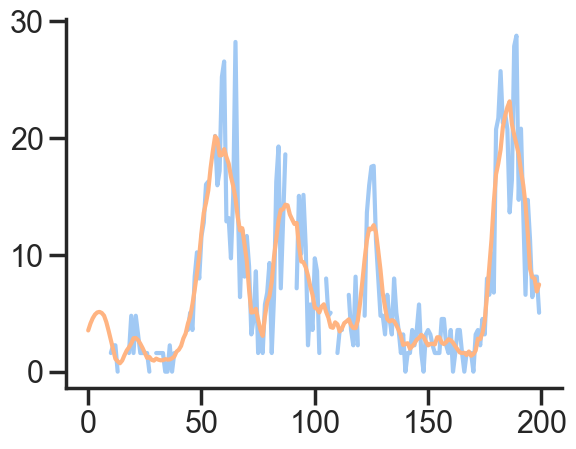

In [839]:
plt.plot(tmp_dvt.loc[:,'lin_vel'][:200])
plt.plot(tmp_dvt.loc[:,'lin_vel_savgol'][:200])
# plt.plot(tmp_dvt.loc[:,'med_vel'][:100])

In [393]:
lin_vel_interp.size, tmp_dvt['lin_vel'].values.size

(14387, 14387)

## Process raw data

In [398]:
path = Path(r"z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP")
file_ls = list(path.glob('**/*.mat'))
print(file_ls[:2])

[WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/Results/SESSIONS_NOMODEL_GOODLFP/JA0144_20211207_lADN_h1_all_neurons.mat'), WindowsPath('z:/Data/Mice/VR/Alex/Head_restrainer/Results/SESSIONS_NOMODEL_GOODLFP/JA0153_20220126_lADN_h1_all_neurons.mat')]


In [399]:
data_dict = {}
for i in range(len(file_ls)):
    print (i, file_ls[i])
    data_dict[i] = mat73.loadmat(file_ls[i])

0 z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0144_20211207_lADN_h1_all_neurons.mat
1 z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0153_20220126_lADN_h1_all_neurons.mat
2 z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0162_20220302_lADN_h1_all_neurons.mat
3 z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0164_20220419_lADN_h2_all_neurons.mat
4 z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0178_20220819_lADN_h2_all_neurons.mat
5 z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0178_20220822_lADN_h2_all_neurons.mat
6 z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0178_20220824_lADN_h1_all_neurons.mat
7 z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0178_20220906_rADN_h2_all_neurons.mat
8 z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0181_20220812_lADN_h2_all_neur

In [400]:
for i in range(10):
    print(file_ls[i].name.split('_')[1])

20211207
20220126
20220302
20220419
20220819
20220822
20220824
20220906
20220812
20220815


In [28]:
data_dict[i]['neurons']['dark1'][0]['LFP']

array([-1.49898136, -8.49846979, 11.74888519, ..., 19.90949317,
       15.34811066, 27.85502811])

### Load one file

In [27]:
path = r'z:\Data\Mice\VR\Alex\Head_restrainer\Results\JA0178_20220824__all_neurons.mat'
data_rec = mat73.loadmat(path)

AssertionError: z:\Data\Mice\VR\Alex\Head_restrainer\Results\JA0178_20220824__all_neurons.mat does not exist

In [128]:
data_rec['neurons'].keys(), data_rec['neurons']['light1'][0].keys(), len(data_rec['neurons']['dark1'])

(dict_keys(['QMatrix', 'acronym', 'animal_name', 'cids', 'dark1', 'darkHR1', 'date_name', 'depth', 'is_sua', 'label', 'light1', 'lightHR1', 'session_name', 'site']),
 dict_keys(['Az', 'LFP', 'Omega', 'cluster_spikes', 'p_val', 'r', 'sites', 'tunning', 'velocity', 'x_tunning']),
 2)

In [129]:
print(data_rec['neurons']['light1'][0]['LFP'])
print(data_rec['neurons']['lightHR1'][0]['LFP'])
print(data_rec['neurons']['dark1'][0]['LFP'])
print(data_rec['neurons']['darkHR1'][0]['LFP'])

[-15. -34. -36. ... -38. -33. -41.]
[-282. -164. -309. ...  -25.   58.   38.]
[-94. -81. -79. ...  52.  -2.  -1.]
[ 38.  64.  17. ... 149. 116.  69.]


In [183]:
d_hr_data.keys()

dict_keys(['20211212_JA0144_dark1', '20211212_JA0144_darkHR1', '20211212_JA0144_light1', '20211212_JA0144_lightHR1', '20220126_JA0153_dark1', '20220126_JA0153_darkHR1', '20220126_JA0153_light1', '20220126_JA0153_lightHR1', '20220209_JA0153_dark1', '20220209_JA0153_darkHR1', '20220209_JA0153_light1', '20220209_JA0153_lightHR1', '20220302_JA0162_dark1', '20220302_JA0162_darkHR1', '20220302_JA0162_light1', '20220302_JA0162_lightHR1', '20220419_JA0164_dark1', '20220419_JA0164_darkHR1', '20220419_JA0164_light1', '20220419_JA0164_lightHR1', '20220819_JA0178_dark1', '20220819_JA0178_darkHR1', '20220819_JA0178_light1', '20220819_JA0178_lightHR1', '20220822_JA0178_dark1', '20220822_JA0178_darkHR1', '20220822_JA0178_light1', '20220822_JA0178_lightHR1', '20220824_JA0178_dark1', '20220824_JA0178_darkHR1', '20220824_JA0178_light1', '20220824_JA0178_lightHR1', '20220906_JA0178_dark1', '20220906_JA0178_darkHR1', '20220906_JA0178_light1', '20220906_JA0178_lightHR1', '20220812_JA0181_dark1', '20220812_

In [182]:
df_dvt.rec_id.unique()

array(['20210420_JA0100_light1', '20210420_JA0100_dark1',
       '20210421_JA0100_light1', '20210421_JA0100_dark1',
       '20211207_JA0144_darkHR1', '20211207_JA0144_lightHR1',
       '20211207_JA0144_light1', '20211207_JA0144_dark1',
       '20220126_JA0153_light1', '20220126_JA0153_dark1',
       '20220126_JA0153_lightHR1', '20220126_JA0153_darkHR1',
       '20220302_JA0162_dark1', '20220302_JA0162_darkHR1',
       '20220302_JA0162_lightHR1', '20220302_JA0162_light1',
       '20220419_JA0164_darkHR1', '20220419_JA0164_lightHR1',
       '20220419_JA0164_dark1', '20220419_JA0164_light1',
       '20220426_JA0164_darkHR1', '20220426_JA0164_lightHR1',
       '20220426_JA0164_dark1', '20220426_JA0164_light1',
       '20220808_JA0179_darkHR1', '20220808_JA0179_light1',
       '20220808_JA0179_lightHR1', '20220815_JA0179_dark1',
       '20220815_JA0179_darkHR1', '20220815_JA0179_light1',
       '20220815_JA0179_lightHR1', '20220816_JA0179_dark1',
       '20220816_JA0179_darkHR1', '20220816_

In [510]:
d_hr_data = {}

In [418]:
d_hr_data.keys()

dict_keys([])

In [841]:
# data_tmp = data_rec['neurons']

binSize = 0.02
boxcar = np.ones(int(1/binSize))
trace_length = 480
edges = np.arange(0, trace_length + binSize, binSize)
cond_ls = ['dark1', 'darkHR1', 'light1', 'lightHR1']

for i in range(len(file_ls[:])):
    print(file_ls[i])
    data_tmp = data_dict[i]['neurons']
    if 'lightHR1' not in data_tmp.keys():
        continue
    #exp info
    cids = data_tmp['cids']
    animal_name = data_tmp['animal_name'][0]
        
    date_name = file_ls[i].name.split('_')[1]
    hem = file_ls[i].name.split('_')[2]
    ch_map = file_ls[i].name.split('_')[3]
    depth = data_tmp['depth']
    is_sua = (data_tmp['is_sua'])
    session_name = data_tmp['session_name'][0]
    site = data_tmp['site']
    label = data_tmp['label']
    rec_session = animal_name + '_' + date_name
 
    for cond in cond_ls:
        ls_arena, ls_tuning = [], []
        rec_id = date_name + '_' + animal_name + '_' + cond
#         if rec_id in d_hr_data.keys():
#             continue
#         d_hr_data[rec_id] = {}
#         d_hr_data[rec_id]['ephys'] = {}
#         d_hr_data[rec_id]['beh'] = {}
        
        print(rec_id)
        for idx, unit in enumerate(cids):

            tmp = data_tmp[cond][idx]
            this_depth = depth[idx]
            if this_depth.size > 1:
                this_depth = False
            hdc_flag, hd_model = False, False
            try:
                _ =  tmp['Az'].size
            except:
                print(f"None in {unit}")
                continue
                
            if tmp['cluster_spikes'].size < 100:
                print(f'<100 spks in {cond} {unit}')
                continue

            # arena tuning
#             try:
#                 bm = tmp['models']['bestmodel']
#             except:
#                 bm = -1
                
            r = tmp['r']
            p_val = tmp['p_val']
            if r > 0.3 and p_val < 0.05:
                hdc_flag = True
#             if bm == 4:
#                 hd_model = True
            cuid = str(cids[idx]) + '_' + rec_id
            tuning = tmp['tunning']
            x_tuning = tmp['x_tunning']
            block_tun = pd.DataFrame({'animal_name': animal_name, 'cids':cids[idx], 'date_name':date_name, 'cuid':cuid,
                          'is_sua':is_sua[idx],   'depth':this_depth, 'session_name':session_name, 'site':site[idx], 
                          'r':r, 'p_val':p_val, 'cids':cids[idx], 'tuning':tuning, 'x_tuning':x_tuning, 
                                  'condition': cond, 'rec_id': rec_id, 'hdc_flag':hdc_flag, 'rec_session':rec_session,
                                      'hem':hem, 'ch_map':ch_map,
                            })
            ls_tuning.append(block_tun)
        
            arena_vel = df_dvt[(df_dvt.rec_id == rec_id)]['lin_vel_savgol']
            arena_vel_res = samplerate.resample(arena_vel, 50 * 1.0 / 30, 'sinc_best')
        
            hist = 0
            # from 100 to 50hz
            yaw = tmp['Az']
            if yaw.size > 30000:
                yaw = yaw[::2]
            # 250 hz for 2nd batch, 50hz for 1st batch
            lfp = tmp['LFP']
            if lfp.size > yaw.size*2:
                lfp_dwn = lfp[::5][:yaw.size]
            else:
                lfp_dwn = lfp[:][:yaw.size]
            
            omega = tmp['Omega']
            hist, bins = np.histogram(tmp['cluster_spikes'], bins = edges)
            spd_arena = np.convolve(hist, boxcar, mode = 'same')
            n_samples =  yaw.size
            spd_arena, bins = spd_arena[:n_samples], bins[:n_samples]
            arena_vel_res = arena_vel_res[:n_samples]
            arena_vel_res = np.pad(arena_vel_res, (0, spd_arena.size - arena_vel_res.size), 'constant')
            
            # lin vel is over smooth from fit_glm, so I use recompute from dvt files 
#             matlab_lin_speed = tmp['velocity']/100
            
            tmp_df = pd.DataFrame({'animal_name': animal_name, 'cids':cids[idx], 'date_name':date_name, 
                                  'is_sua':is_sua[idx], 'depth':this_depth, 'cuid':cuid, 'hem':hem, 'ch_map':ch_map,
                                'session_name':session_name, 'site':site[idx], 'rec_id':rec_id,
                                 'condition': cond, 'hz': spd_arena, 'times': bins[:], 'lfp':lfp_dwn,
                                 'hdc_flag':hdc_flag, 'rec_session':rec_session
                                    })
            ls_arena.append(tmp_df)
            break
        ephys_df = pd.concat(ls_arena)
        tuning_df = pd.concat(ls_tuning)
        beh_df = pd.DataFrame({'animal_name': animal_name,  'date_name':date_name, 'hem':hem, 'ch_map':ch_map,
                  'rec_id':rec_id, 'condition': cond, 'times': bins[:], 'yaw':yaw, 
                  'omega':omega, 'lin_vel': arena_vel_res, 'rec_session':rec_session
                    })
                
#         d_hr_data[rec_id]['ephys'] = ephys_df
        d_hr_data[rec_id]['beh'] = beh_df
#         d_hr_data[rec_id]['tuning'] = tuning_df
    
# df_tmp_tun = pd.concat(ls_tuning)
# df_tmp_ephys = pd.concat(ls_arena)

# df_hr_master_2 = pd.concat(ls_arena)
# df_hr_tuning_2 = pd.concat(ls_tuning)
# df_hr_master_2.head()

# df_hr_master = pd.concat(ls_arena)
# df_hr_tuning = pd.concat(ls_tuning)
# df_hr_master.head()

z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0144_20211207_lADN_h1_all_neurons.mat
20211207_JA0144_dark1
20211207_JA0144_darkHR1
20211207_JA0144_light1
20211207_JA0144_lightHR1
z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0153_20220126_lADN_h1_all_neurons.mat
20220126_JA0153_dark1
20220126_JA0153_darkHR1
<100 spks in darkHR1 2.0
<100 spks in darkHR1 3.0
20220126_JA0153_light1
20220126_JA0153_lightHR1
<100 spks in lightHR1 2.0
<100 spks in lightHR1 3.0
<100 spks in lightHR1 9.0
z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0162_20220302_lADN_h1_all_neurons.mat
20220302_JA0162_dark1
20220302_JA0162_darkHR1
20220302_JA0162_light1
20220302_JA0162_lightHR1
z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NOMODEL_GOODLFP\JA0164_20220419_lADN_h2_all_neurons.mat
20220419_JA0164_dark1
20220419_JA0164_darkHR1
20220419_JA0164_light1
20220419_JA0164_lightHR1
z:\Data\Mice\VR\Alex\Head_restrainer\Results\SESSIONS_NO

,animal_name,cids,date_name,is_sua,depth,cuid,hem,ch_map,session_name,site,rec_id,condition,hz,times,lfp,hdc_flag,rec_session
0,JA0144,0.0,20211207,1.0,False,0.0_20211207_JA0144_dark1,lADN,h1,001,88,20211207_JA0144_dark1,dark1,20.0,0.00,-43.510810,False,JA0144_20211207
1,JA0144,0.0,20211207,1.0,False,0.0_20211207_JA0144_dark1,lADN,h1,001,88,20211207_JA0144_dark1,dark1,21.0,0.02,-191.480190,False,JA0144_20211207
2,JA0144,0.0,20211207,1.0,False,0.0_20211207_JA0144_dark1,lADN,h1,001,88,20211207_JA0144_dark1,dark1,21.0,0.04,-69.425906,False,JA0144_20211207
3,JA0144,0.0,20211207,1.0,False,0.0_20211207_JA0144_dark1,lADN,h1,001,88,20211207_JA0144_dark1,dark1,22.0,0.06,223.288240,False,JA0144_20211207
4,JA0144,0.0,20211207,1.0,False,0.0_20211207_JA0144_dark1,lADN,h1,001,88,20211207_JA0144_dark1,dark1,25.0,0.08,289.989786,False,JA0144_20211207
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23995,JA0144,103.0,20211207,0.0,False,103.0_20211207_JA0144_dark1,lADN,h1,001,44,20211207_JA0144_dark1,dark1,1.0,479.90,-41.158844,False,JA0144_20211207
23996,JA0144,103.0,20211207,0.0,False,103.0_20211207_JA0144_dark1,lADN,h1,001,44,20211207_JA0144_dark1,dark1,1.0,479.92,-25.612050,False,JA0144_20211207
23997,JA0144,103.0,20211207,0.0,False,103.0_20211207_JA0144_dark1,lADN,h1,001,44,20211207_JA0144_dark1,dark1,1.0,479.94,20.131250,False,JA0144_20211207
23998,JA0144,103.0,20211207,0.0,False,103.0_20211207_JA0144_dark1,lADN,h1,001,44,20211207_JA0144_dark1,dark1,1.0,479.96,51.963446,False,JA0144_20211207


In [313]:
spd_arena.size, lfp.size, lfp_dwn.size, arena_vel_res.size

(24000, 24000, 24000, 24000)

In [1031]:
with open('d_hr_data.p', 'wb') as handle:
    pickle.dump(d_hr_data, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [23]:
# df_hr_master_2.to_pickle('df_hr_master_b2.pkl')
# df_hr_tuning_2.to_pickle('df_hr_tuning_b2.pkl')

In [440]:
df_hr_master = pd.concat([df_hr_master_1, df_hr_master_2])
df_hr_master.head()

,animal_name,cids,date_name,is_sua,acronym,bm,session_name,site,rec_id,condition,...,times,yaw,lfp,omega,vel,hd_model,hdc_flag,depth,cuid,rec_session
0,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,...,0.00,-132.0,-43.510810,-100.000000,26.020397,False,False,NaN,NaN,NaN
1,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,...,0.02,-132.0,-191.480190,-100.000000,29.655931,False,False,NaN,NaN,NaN
2,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,...,0.04,-127.0,-69.425906,-114.583333,25.184610,False,False,NaN,NaN,NaN
3,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,...,0.06,-127.0,223.288240,-117.307692,25.026758,False,False,NaN,NaN,NaN
4,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,...,0.08,-132.0,289.989786,-119.642857,27.647388,False,False,NaN,NaN,NaN


### Load data into df

In [414]:
# ls_arena, ls_tuning = [], []
# binSize = 0.02
# boxcar = np.ones(int(1/binSize))
# trace_length = 480
# edges = np.arange(0, trace_length + binSize, binSize)
# cond_ls = ['dark1', 'darkHR1', 'light1', 'lightHR1']

# for i in range(len(file_ls[:])):
#     if 'lightHR1' not in data_dict[i]['neurons'].keys():
#         continue
#     print(file_ls[i])
#     data_tmp = data_dict[i]['neurons']
#     #exp info
#     cids = data_tmp['cids']
#     animal_name = data_tmp['animal_name'][i]
#     cids = data_tmp['cids']
#     date_name = data_tmp['date_name'][i]
#     depth = data_tmp['depth']
#     is_sua = (data_tmp['is_sua'])
#     session_name = data_tmp['session_name'][i]
#     site = data_tmp['site']
#     label = data_tmp['label']
    

#     for cond in cond_ls:
#         rec_id = date_name + '_' + animal_name + '_' + cond
#         for idx, unit in enumerate(cids):
#             hdc_flag, hd_model = False, False
#             if type(label[idx]) != str:
#                 acronym = np.nan
#             else:
#                 acronym = label[idx]
#             try:
#                 bm = data_dict[i]['neurons'][cond][idx]['models']['bestmodel']
#             except:
#                 bm = -1
            
#             tmp = data_tmp[cond][idx]
#             try:
#                 _ =  tmp['Az'].size
#             except:
#                 print(f"None in {unit}")
#                 continue
                
#             if tmp['cluster_spikes'].size < 100:
#                 print(f'<100 spks in {cond} {unit}')
#                 continue

#             # arena tuning
#             r = tmp['r']
#             p_val = tmp['p_val']
#             if r > 0.3 and p_val < 0.05:
#                 hdc_flag = True
#             if bm == 4:
#                 hd_model = True
#             tuning = tmp['tunning']
#             x_tuning = tmp['x_tunning']
#             block_tun = pd.DataFrame({'animal_name': animal_name, 'cids':cids[idx], 'date_name':date_name, 
#                            'is_sua':is_sua[idx], 'acronym': acronym, 'bm': bm, 'acronym':acronym, 'hdc_flag':hdc_flag,
#                             'session_name':session_name, 'site':site[idx], 'r':r, 'p_val':p_val, 'cids':cids[idx],
#                           'tuning':tuning, 'x_tuning':x_tuning, 'condition': cond, 'rec_id': rec_id, 'hd_model': hd_model                 
#                             })
#             ls_tuning.append(block_tun)


#             tmp_speed = df_dvt[(df_dvt.date_name == date_name) & (df_dvt.condition == cond)]
#             arena_vel = tmp_speed.med_vel.fillna(method='ffill').fillna(method='bfill')
#             arena_vel_res = samplerate.resample(arena_vel, 50 * 1.0 / 30, 'sinc_best')/9.4 # pix to cm
        
#             hist = 0
#             yaw = tmp['Az']
#             lfp = tmp['LFP']
#             omega = tmp['Omega']
#             hist, bins = np.histogram(tmp['cluster_spikes'], bins = edges)
#             spd_arena = np.convolve(hist, boxcar, mode = 'same')
#             n_samples =  yaw.size
#             spd_arena, bins = spd_arena[:n_samples], bins[:n_samples]
#             arena_vel_res = arena_vel_res[:n_samples]
#             arena_vel_res = np.pad(arena_vel_res, (0, spd_arena.size - arena_vel_res.size), 'constant')
# #             lin_speed = tmp['velocity']/100
#             block_l1 = pd.DataFrame({'animal_name': animal_name, 'cids':cids[idx], 'date_name':date_name, 
#                           'is_sua':is_sua[idx], 'acronym': acronym, 'cids':cids[idx], 'bm': bm,
#                         'session_name':session_name, 'site':site[idx], 'rec_id':rec_id,
#                          'condition': cond, 'hz': spd_arena, 'times': bins[:], 'yaw':yaw, 
#                          'lfp':lfp, 'omega':omega, 'vel': arena_vel_res, 'hd_model': hd_model, 'hdc_flag':hdc_flag
#                                     })
#             ls_arena.append(block_l1)
    
# df_hr_master = pd.concat(ls_arena)
# df_hr_tuning = pd.concat(ls_tuning)
# df_hr_master.head()

y:\Data\Mice\VR\Janna\RESULTS_ADN_HD_CELLS\SESSIONS\004\JA0144_20211212_001_all_neurons.mat
<100 spks in dark1 18.0
<100 spks in dark1 59.0
<100 spks in dark1 65.0
None in 69.0
<100 spks in dark1 75.0
<100 spks in dark1 84.0
<100 spks in dark1 89.0
<100 spks in dark1 99.0
<100 spks in darkHR1 18.0
<100 spks in darkHR1 60.0
<100 spks in darkHR1 65.0
None in 69.0
<100 spks in darkHR1 71.0
<100 spks in darkHR1 73.0
<100 spks in darkHR1 75.0
None in 84.0
<100 spks in darkHR1 89.0
<100 spks in darkHR1 99.0
<100 spks in light1 60.0
<100 spks in light1 65.0
<100 spks in light1 69.0
<100 spks in light1 84.0
<100 spks in light1 99.0
<100 spks in lightHR1 65.0
<100 spks in lightHR1 69.0
<100 spks in lightHR1 75.0
<100 spks in lightHR1 84.0
<100 spks in lightHR1 89.0
<100 spks in lightHR1 99.0
y:\Data\Mice\VR\Janna\RESULTS_ADN_HD_CELLS\SESSIONS\005\JA0153_20220209_001_all_neurons.mat
<100 spks in dark1 80.0
<100 spks in dark1 86.0
None in 207.0
<100 spks in dark1 269.0
<100 spks in dark1 290.0
<1

<100 spks in lightHR1 196.0


,animal_name,cids,date_name,is_sua,acronym,bm,session_name,site,rec_id,condition,hz,times,yaw,lfp,omega,vel,hd_model,hdc_flag
0,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,20.0,0.00,-132.0,-43.510810,-100.000000,26.020397,False,False
1,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,21.0,0.02,-132.0,-191.480190,-100.000000,29.655931,False,False
2,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,21.0,0.04,-127.0,-69.425906,-114.583333,25.184610,False,False
3,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,22.0,0.06,-127.0,223.288240,-117.307692,25.026758,False,False
4,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,25.0,0.08,-132.0,289.989786,-119.642857,27.647388,False,False


In [482]:
df_hr_tuning.condition.unique()

array(['dark1', 'darkHR1', 'light1', 'lightHR1'], dtype=object)

In [769]:
df_hr_master.head()

,animal_name,cids,date_name,is_sua,acronym,bm,session_name,site,rec_id,condition,hz,times,yaw,lfp,omega,vel,hd_model,hdc_flag
0,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,20.0,0.00,-132.0,-43.510810,-100.000000,26.020397,False,False
1,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,21.0,0.02,-132.0,-191.480190,-100.000000,29.655931,False,False
2,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,21.0,0.04,-127.0,-69.425906,-114.583333,25.184610,False,False
3,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,22.0,0.06,-127.0,223.288240,-117.307692,25.026758,False,False
4,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,20211212_JA0144_dark1,dark1,25.0,0.08,-132.0,289.989786,-119.642857,27.647388,False,False


y:\Data\Mice\VR\Janna\RESULTS_ADN_HD_CELLS\SESSIONS\001\JA0100_20210420_001_all_neurons.mat
y:\Data\Mice\VR\Janna\RESULTS_ADN_HD_CELLS\SESSIONS\002\JA0100_20210421_001_all_neurons.mat
y:\Data\Mice\VR\Janna\RESULTS_ADN_HD_CELLS\SESSIONS\003\JA0104_20210427_001_all_neurons.mat
y:\Data\Mice\VR\Janna\RESULTS_ADN_HD_CELLS\SESSIONS\004\JA0144_20211212_001_all_neurons.mat


In [28]:
d_hr_data.keys()

dict_keys(['20211212_JA0144_dark1', '20211212_JA0144_darkHR1', '20211212_JA0144_light1', '20211212_JA0144_lightHR1', '20220126_JA0153_dark1', '20220126_JA0153_darkHR1', '20220126_JA0153_light1', '20220126_JA0153_lightHR1', '20220209_JA0153_dark1', '20220209_JA0153_darkHR1', '20220209_JA0153_light1', '20220209_JA0153_lightHR1', '20220302_JA0162_dark1', '20220302_JA0162_darkHR1', '20220302_JA0162_light1', '20220302_JA0162_lightHR1', '20220419_JA0164_dark1', '20220419_JA0164_darkHR1', '20220419_JA0164_light1', '20220419_JA0164_lightHR1', '20220819_JA0178_dark1', '20220819_JA0178_darkHR1', '20220819_JA0178_light1', '20220819_JA0178_lightHR1', '20220822_JA0178_dark1', '20220822_JA0178_darkHR1', '20220822_JA0178_light1', '20220822_JA0178_lightHR1', '20220824_JA0178_dark1', '20220824_JA0178_darkHR1', '20220824_JA0178_light1', '20220824_JA0178_lightHR1', '20220906_JA0178_dark1', '20220906_JA0178_darkHR1', '20220906_JA0178_light1', '20220906_JA0178_lightHR1', '20220812_JA0181_dark1', '20220812_

In [26]:
d_hr_data['20211212_JA0144_light1']['ephys']

,animal_name,cids,date_name,is_sua,depth,cuid,session_name,site,rec_id,condition,hz,times,lfp,hdc_flag,rec_session
0,JA0144,0.0,20211212,1.0,False,0.0_20211212_JA0144_light1,001,88,20211212_JA0144_light1,light1,2.0,0.00,-13.635219,False,JA0144_20211212
1,JA0144,0.0,20211212,1.0,False,0.0_20211212_JA0144_light1,001,88,20211212_JA0144_light1,light1,2.0,0.02,-58.236623,False,JA0144_20211212
2,JA0144,0.0,20211212,1.0,False,0.0_20211212_JA0144_light1,001,88,20211212_JA0144_light1,light1,2.0,0.04,-48.965603,False,JA0144_20211212
3,JA0144,0.0,20211212,1.0,False,0.0_20211212_JA0144_light1,001,88,20211212_JA0144_light1,light1,2.0,0.06,26.225148,False,JA0144_20211212
4,JA0144,0.0,20211212,1.0,False,0.0_20211212_JA0144_light1,001,88,20211212_JA0144_light1,light1,2.0,0.08,132.100921,False,JA0144_20211212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23995,JA0144,103.0,20211212,0.0,False,103.0_20211212_JA0144_light1,001,44,20211212_JA0144_light1,light1,1.0,479.90,-13.235274,False,JA0144_20211212
23996,JA0144,103.0,20211212,0.0,False,103.0_20211212_JA0144_light1,001,44,20211212_JA0144_light1,light1,1.0,479.92,6.912814,False,JA0144_20211212
23997,JA0144,103.0,20211212,0.0,False,103.0_20211212_JA0144_light1,001,44,20211212_JA0144_light1,light1,1.0,479.94,34.895030,False,JA0144_20211212
23998,JA0144,103.0,20211212,0.0,False,103.0_20211212_JA0144_light1,001,44,20211212_JA0144_light1,light1,1.0,479.96,58.631039,False,JA0144_20211212


In [130]:
df_tuning.loc[0].groupby(['date_name', 'condition', 'hd']).cids.count().reset_index()

,date_name,condition,hd,cids
0,20210420,dark,False,87
1,20210420,dark,True,28
2,20210420,light1,False,85
3,20210420,light1,True,30
4,20210421,dark,False,2
5,20210421,dark,True,10
6,20210421,light1,False,2
7,20210421,light1,True,10
8,20210427,dark,False,95
9,20210427,dark,True,26


### Load HR data

In [28]:
# ls_tuning = []
# ls_arena = []
# ls_frun = []

# binSize = 0.02
# boxcar = np.ones(int(1/binSize))
# trace_length = 480
# edges = np.arange(0, trace_length + binSize, binSize)

# for i in range(len(file_ls[:])):
#     if 'lightHR1' in data_dict[i]['neurons'].keys() or 'darkHR1' in data_dict[i]['neurons'].keys():
        
#         print(file_ls[i])
#         # meta info
#         animal_name = data_dict[i]['neurons']['animal_name'][0]
#         cids = (data_dict[i]['neurons']['cids'])
#         date_name = data_dict[i]['neurons']['date_name'][0]
#         depth = data_dict[i]['neurons']['depth']
#         is_sua = (data_dict[i]['neurons']['is_sua'])
#         session_name = data_dict[i]['neurons']['session_name'][0]
#         site = (data_dict[i]['neurons']['site'])
#         label = data_dict[i]['neurons']['label']
        
#         if 'is_critical' in data_dict[i]['neurons'].keys():
#             is_critical = data_dict[i]['neurons']['is_critical']
#         else:
#             is_critical = data_dict[i]['neurons']['is_model']

#         for idx, unit in enumerate(cids):
#     #         print(idx, unit, is_sua[idx])
# #             if is_sua[idx] == 0:
# #                 continue
#             if type(label[idx]) != str:
#                 acronym = np.nan
#             else:
#                 acronym = label[idx]
#             bm_light = data_dict[i]['neurons']['light1'][idx]['models']['bestmodel']
#             try:
#                 bm_dark = data_dict[i]['neurons']['dark1'][idx]['models']['bestmodel']
#             except:
#                 bm_dark = np.nan
            
#             # exp conditions
#             tmp = data_dict[i]['neurons']['lightHR1'][idx]
#             tmp_dark = data_dict[i]['neurons']['darkHR1'][idx]
            
#             try:
#                 _, _ =  tmp['Az'].size, tmp_dark['Az'].size
#             except:
#                 print(f"None in {unit}")
#                 continue
    

#             if tmp['cluster_spikes'].size < 100 or tmp_dark['cluster_spikes'].size < 100:
#                 print(f'<100 spks in {unit}')
#                 continue

#             # arena tuning
#             r = tmp['r']
#             p_val = tmp['p_val']
#             tuning = tmp['tunning']
#             x_tuning = tmp['x_tunning']
#             block_tun = pd.DataFrame({'animal_name': animal_name, 'cids':cids[idx], 'date_name':date_name, 
#                                        'is_sua':is_sua[idx], 'acronym': acronym, 'bm': bm_light,
#                                     'session_name':session_name, 'site':site[idx], 'r':r, 'p_val':p_val, 'cids':cids[idx],
#                                   'tuning':tuning, 'x_tuning':x_tuning, 'condition': 'lightHR1', 'is_critical': is_critical[idx]                  
#                             })
#             ls_tuning.append(block_tun)

#             # arena dark tuning
#             r_dark = tmp_dark['r']
#             p_val_dark = tmp_dark['p_val']
#             tuning = tmp_dark['tunning']
#             x_tuning = tmp_dark['x_tunning']
#             block_tun_dark = pd.DataFrame({'animal_name': animal_name, 'cids':cids[idx], 'date_name':date_name, 
#                                             'is_sua':is_sua[idx], 'acronym': acronym, 'bm': bm_dark,
#                 'session_name':session_name, 'site':site[idx], 'r':r_dark, 'p_val':p_val_dark, 'tuning':tuning, 'cids':cids[idx],
#                                            'x_tuning':x_tuning, 'condition': 'darkHR1',  'is_critical': is_critical[idx] 
#                             })
#             ls_tuning.append(block_tun_dark)

#             # arena light spikes
#             tmp_speed = df_dvt[(df_dvt.date_name == date_name) & (df_dvt.condition == 'light_hr')]
#             arena_vel = tmp_speed.med_vel.fillna(method='ffill').fillna(method='bfill')
#             arena_vel_res = samplerate.resample(arena_vel, 50 * 1.0 / 30, 'sinc_best')/9.4 # pix to cm


#             hist = 0
#             yaw = tmp['Az']
#             lfp = tmp['LFP']
#             omega = tmp['Omega']
#             hist, bins = np.histogram(tmp['cluster_spikes'], bins = edges)
#             n_samples =  yaw.size
#             hist, bins = hist[:n_samples], bins[:n_samples]
#             arena_vel_res = arena_vel_res[:n_samples]
#             spd_arena = np.convolve(hist, boxcar, mode = 'same')
#             arena_vel_res = np.pad(arena_vel_res, (0, spd_arena.size - arena_vel_res.size), 'constant')
#             block_l1 = pd.DataFrame({'animal_name': animal_name, 'cids':cids[idx], 'date_name':date_name, 
#                                       'is_sua':is_sua[idx], 'acronym': acronym, 'cids':cids[idx], 'bm': bm_light,
#                                     'session_name':session_name, 'site':site[idx], 'r':r, 'p_val':p_val, 
#                                      'condition': 'lightHR1', 'hz': spd_arena, 'times': bins[:], 'yaw':yaw, 
#                                      'lfp':lfp, 'omega':omega, 'vel': arena_vel_res, 'is_critical': is_critical[idx] 
#                                     })
#             ls_arena.append(block_l1)

#             # arena dark spikes
#             tmp_speed_dark = df_dvt[(df_dvt.date_name == date_name) & (df_dvt.condition == 'dark_hr')]
#             arena_vel = tmp_speed_dark.med_vel.fillna(method='ffill').fillna(method='bfill')
#             arena_vel_res = samplerate.resample(arena_vel, 50 * 1.0 / 30, 'sinc_best')/9.4 # pix to cm

#             hist = 0
#             yaw = tmp_dark['Az']
#             lfp = tmp_dark['LFP']
#             omega = tmp_dark['Omega']
#             hist, bins = np.histogram(tmp_dark['cluster_spikes'], bins = edges)
#             n_samples =  yaw.size
#             hist, bins = hist[:n_samples], bins[:n_samples]
#             arena_vel_res = arena_vel_res[:n_samples]
#             spd_arena = np.convolve(hist, boxcar, mode = 'same')
#             arena_vel_res = np.pad(arena_vel_res, (0, spd_arena.size - arena_vel_res.size), 'constant')
#             block_d1 = pd.DataFrame({'animal_name': animal_name, 'cids':cids[idx], 'date_name':date_name, 
#                                     'is_sua':is_sua[idx], 'acronym': acronym, 'bm': bm_dark,
#                                     'session_name':session_name, 'site':site[idx], 'r':r_dark, 'p_val':p_val_dark, 
#                                      'condition': 'darkHR1',
#                                     'hz': spd_arena, 'times': bins[:], 'yaw':yaw, 'lfp':lfp, 'cids':cids[idx],
#                                      'omega':omega, 'vel': arena_vel_res, 'is_critical': is_critical[idx] 
#                                     })
#             ls_arena.append(block_d1)



# df_hr_tuning = pd.concat(ls_tuning)
# df_hr_arena = pd.concat(ls_arena)
# df_hr_arena.head()

y:\Data\Mice\VR\Janna\RESULTS_ADN_HD_CELLS\SESSIONS\004\JA0144_20211212_001_all_neurons.mat
<100 spks in 18.0
<100 spks in 60.0
<100 spks in 65.0
None in 69.0
<100 spks in 71.0
<100 spks in 73.0
<100 spks in 75.0
None in 84.0
<100 spks in 89.0
<100 spks in 99.0
y:\Data\Mice\VR\Janna\RESULTS_ADN_HD_CELLS\SESSIONS\005\JA0153_20220209_001_all_neurons.mat
<100 spks in 64.0
<100 spks in 143.0
None in 259.0
<100 spks in 269.0
<100 spks in 281.0
<100 spks in 282.0
<100 spks in 293.0
y:\Data\Mice\VR\Janna\RESULTS_ADN_HD_CELLS\SESSIONS\006\JA0162_20220302_001_all_neurons.mat
<100 spks in 28.0
None in 37.0
<100 spks in 44.0
<100 spks in 55.0
<100 spks in 56.0
<100 spks in 59.0
<100 spks in 74.0
<100 spks in 78.0
<100 spks in 80.0
<100 spks in 98.0
<100 spks in 108.0
<100 spks in 119.0
<100 spks in 124.0
None in 125.0
<100 spks in 147.0
<100 spks in 213.0
<100 spks in 215.0
<100 spks in 216.0
<100 spks in 218.0
<100 spks in 252.0
<100 spks in 264.0
<100 spks in 271.0
<100 spks in 275.0
<100 spks 

,animal_name,cids,date_name,is_sua,acronym,bm,session_name,site,r,p_val,condition,hz,times,yaw,lfp,omega,vel,is_critical
0,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,0.300874,0.08,lightHR1,0.0,0.00,-129.0,-13.635219,-15.000000,-0.186153,0.0
1,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,0.300874,0.08,lightHR1,0.0,0.02,-129.0,-58.236623,-15.000000,-0.451826,0.0
2,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,0.300874,0.08,lightHR1,0.0,0.04,-127.0,-48.965603,-13.636364,0.555326,0.0
3,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,0.300874,0.08,lightHR1,0.0,0.06,-127.0,26.225148,-13.636364,0.382275,0.0
4,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,0.300874,0.08,lightHR1,0.0,0.08,-127.0,132.100921,-13.636364,-1.336164,0.0


In [ ]:
plt.plot(arena_vel)

In [121]:
spd_arena.size, yaw.size, lfp.size, arena_vel_res.size

(23700, 23700, 23700, 23978, 14387)

In [59]:
bins.size

24001

In [79]:
df_hr_arena.head()

,animal_name,cids,date_name,is_sua,acronym,bm,session_name,site,r,p_val,condition,hz,times,yaw,lfp,omega,vel,is_critical
0,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,0.215167,0.842,light_hr,0.0,0.00,-129.0,-13.635219,-15.000000,-0.186153,0.0
1,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,0.215167,0.842,light_hr,0.0,0.02,-129.0,-58.236623,-15.000000,-0.451826,0.0
2,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,0.215167,0.842,light_hr,0.0,0.04,-127.0,-48.965603,-13.636364,0.555326,0.0
3,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,0.215167,0.842,light_hr,0.0,0.06,-127.0,26.225148,-13.636364,0.382275,0.0
4,JA0144,0.0,20211212,1.0,NaN,0.0,001,88,0.215167,0.842,light_hr,0.0,0.08,-127.0,132.100921,-13.636364,-1.336164,0.0


KeyError: 'data'

In [21]:
df_hr_tuning.head()

NameError: name 'df_hr_tuning' is not defined

In [21]:
tmp_df = df_hr_tuning_master[(df_hr_tuning_master.hdc_flag == True) 
         & (df_hr_tuning_master.x_tuning > 339)].groupby(['animal_name', 'date_name', 'condition']).cids.count()
with pd.option_context('display.max_rows', None,):
    print(tmp_df)


animal_name  date_name  condition
JA0144       20211212   dark1         8
                        darkHR1       6
                        light1        8
                        lightHR1      6
JA0153       20220209   dark1         8
                        darkHR1      16
                        light1       15
                        lightHR1     18
JA0162       20220302   dark1         4
                        darkHR1       1
                        light1        8
                        lightHR1      9
JA0164       20220419   dark1         7
                        darkHR1       6
                        light1        8
                        lightHR1     10
             20220426   dark1        18
                        darkHR1       3
                        light1       16
                        lightHR1      2
JA0178       08_29      darkHR1       5
                        light1        5
                        lightHR1      5
             20220819   dark1        29
      

In [661]:
# df_tuning.to_pickle("df_tuning.pkl")  
# df_arena.to_pickle("df_arena.pkl")  
# df_frun.to_pickle("df_frun.pkl")  

## Plot behavior

In [18]:
d_hr_data.keys()

dict_keys(['20211207_JA0144_dark1', '20211207_JA0144_darkHR1', '20211207_JA0144_light1', '20211207_JA0144_lightHR1', '20220126_JA0153_dark1', '20220126_JA0153_darkHR1', '20220126_JA0153_light1', '20220126_JA0153_lightHR1', '20220302_JA0162_dark1', '20220302_JA0162_darkHR1', '20220302_JA0162_light1', '20220302_JA0162_lightHR1', '20220419_JA0164_dark1', '20220419_JA0164_darkHR1', '20220419_JA0164_light1', '20220419_JA0164_lightHR1', '20220819_JA0178_dark1', '20220819_JA0178_darkHR1', '20220819_JA0178_light1', '20220819_JA0178_lightHR1', '20220822_JA0178_dark1', '20220822_JA0178_darkHR1', '20220822_JA0178_light1', '20220822_JA0178_lightHR1', '20220824_JA0178_dark1', '20220824_JA0178_darkHR1', '20220824_JA0178_light1', '20220824_JA0178_lightHR1', '20220906_JA0178_dark1', '20220906_JA0178_darkHR1', '20220906_JA0178_light1', '20220906_JA0178_lightHR1', '20220812_JA0181_dark1', '20220812_JA0181_darkHR1', '20220812_JA0181_light1', '20220812_JA0181_lightHR1', '20220815_JA0181_dark1', '20220815_

In [25]:
angles = np.arange(0, 380, 20)

ls = []
for k in d_hr_data.keys():
    dts, animal_name, cond = k.split('_')[-3:]
    rec_session = animal_name + '_' + dts
    tmp = d_hr_data[k]['beh']
    print (k)
 
    # to 0, 360 range
    yaw_sm = tmp['yaw'].values
    if np.min(yaw_sm) < 0:
        yaw_sm = yaw_sm + 180
    omega = tmp['omega'].values 
    dYaw = compute_dYaw(yaw_sm)
    # convert to deg/s, 50 HZ sampling rate
    ang_vel = dYaw*50
    lin_speed = tmp['lin_vel'].values
    
    stat_idx, run_idx = get_stat_run_epochs(lin_speed, window_size=25, speed_thr = 4)
    _, rot_idx = get_stat_run_epochs(ang_vel, window_size=25, speed_thr = 20)

    stat_rot_ratio = (np.intersect1d(stat_idx, rot_idx).size/stat_idx.size) 
    run_rot_ratio = (np.intersect1d(run_idx, rot_idx).size/run_idx.size) 

    occup, _ = np.histogram(yaw_sm, bins = angles)
    locom_ratio = run_idx.size/lin_speed.size
    # at least 5s
    az_occ = occup[occup > 100].size/occup.size
    if az_occ < 0.7:
        print ('not covered well')
#         sns.displot(yaw, bins = 18)
#         plt.show()
    tmp_df = pd.DataFrame({'az_occ': az_occ, 'locom_ratio':locom_ratio ,'rec_id': k, 'rec_session':rec_session,
                          'cond': cond, 'stat_rot_ratio': stat_rot_ratio, 'run_rot_ratio': run_rot_ratio}, index = [0])
    ls.append(tmp_df)
    
df_beh = pd.concat(ls)
df_beh.head()

20211207_JA0144_dark1
20211207_JA0144_darkHR1
not covered well
20211207_JA0144_light1
20211207_JA0144_lightHR1
20220126_JA0153_dark1
20220126_JA0153_darkHR1
20220126_JA0153_light1
20220126_JA0153_lightHR1
20220302_JA0162_dark1
20220302_JA0162_darkHR1
20220302_JA0162_light1
20220302_JA0162_lightHR1
20220419_JA0164_dark1
20220419_JA0164_darkHR1
20220419_JA0164_light1
20220419_JA0164_lightHR1
20220819_JA0178_dark1
20220819_JA0178_darkHR1
not covered well
20220819_JA0178_light1
20220819_JA0178_lightHR1
20220822_JA0178_dark1
20220822_JA0178_darkHR1
20220822_JA0178_light1
20220822_JA0178_lightHR1
20220824_JA0178_dark1
20220824_JA0178_darkHR1
20220824_JA0178_light1
20220824_JA0178_lightHR1
20220906_JA0178_dark1
20220906_JA0178_darkHR1
20220906_JA0178_light1
20220906_JA0178_lightHR1
20220812_JA0181_dark1
20220812_JA0181_darkHR1
20220812_JA0181_light1
20220812_JA0181_lightHR1
20220815_JA0181_dark1
20220815_JA0181_darkHR1
20220815_JA0181_light1
20220815_JA0181_lightHR1
20220818_JA0181_dark1
2022

,az_occ,locom_ratio,rec_id,rec_session,cond,stat_rot_ratio,run_rot_ratio
0,1.000000,0.782292,20211207_JA0144_dark1,JA0144_20211207,dark1,0.794258,0.992011
0,0.611111,0.086458,20211207_JA0144_darkHR1,JA0144_20211207,darkHR1,0.117446,0.963855
0,1.000000,0.908333,20211207_JA0144_light1,JA0144_20211207,light1,0.943182,0.963303
0,1.000000,0.222917,20211207_JA0144_lightHR1,JA0144_20211207,lightHR1,0.097855,0.901869
0,1.000000,0.703125,20220126_JA0153_dark1,JA0153_20220126,dark1,0.947368,0.989630


In [31]:
coi = [ 'light1', 'lightHR1']
good_beh_sess = df_beh[(df_beh.cond.isin(coi)) & (df_beh.az_occ > 0.8)].rec_session.unique()

(0.0, 1.1)

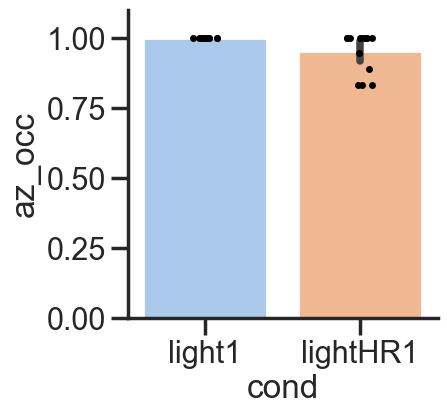

In [42]:
f, ax = plt.subplots(figsize = (4, 4))
coi = [ 'light1', 'lightHR1']
y = 'az_occ'
_inp_plot = df_beh[(df_beh.az_occ > 0.8) & (df_beh.cond.isin(coi))]

sns.stripplot(data = _inp_plot, x = 'cond', y = y, color = 'k')
sns.barplot(data = _inp_plot, x = 'cond', y = y, order = coi)

plt.ylim(0, 1.1)
# plt.savefig(f'bar_{y}_{coi}.pdf', transparent = True)


In [43]:
df_beh[(df_beh.cond == 'lightHR1') & (df_beh.az_occ > 0.8)]

,az_occ,locom_ratio,rec_id,rec_session,cond,stat_rot_ratio,run_rot_ratio
0,1.000000,0.222917,20211207_JA0144_lightHR1,JA0144_20211207,lightHR1,0.097855,0.901869
0,1.000000,0.490625,20220126_JA0153_lightHR1,JA0153_20220126,lightHR1,0.331288,0.985138
0,1.000000,0.307292,20220302_JA0162_lightHR1,JA0162_20220302,lightHR1,0.315789,0.983051
0,0.888889,0.362869,20220419_JA0164_lightHR1,JA0164_20220419,lightHR1,0.062914,0.305233
0,1.000000,0.145833,20220819_JA0178_lightHR1,JA0178_20220819,lightHR1,0.203659,1.000000
0,1.000000,0.445402,20220822_JA0178_lightHR1,JA0178_20220822,lightHR1,0.227979,0.580645
0,0.833333,0.104167,20220824_JA0178_lightHR1,JA0178_20220824,lightHR1,0.106977,1.000000
0,0.833333,0.077083,20220906_JA0178_lightHR1,JA0178_20220906,lightHR1,0.188488,1.000000
0,1.000000,0.191667,20220812_JA0181_lightHR1,JA0181_20220812,lightHR1,0.100515,0.994565
0,1.000000,0.172917,20220815_JA0181_lightHR1,JA0181_20220815,lightHR1,0.112091,1.000000


In [44]:
_inp_plot.groupby('cond')[y].describe()

,count,mean,std,min,25%,50%,75%,max
cond,,,,,,,,
light1,14.0,1.000000,0.000000,1.000000,1.000000,1.0,1.0,1.0
lightHR1,14.0,0.952381,0.071801,0.833333,0.902778,1.0,1.0,1.0


In [45]:
a1 = _inp_plot[_inp_plot.cond == coi[0]][y].values
b1 = _inp_plot[_inp_plot.cond == coi[1]][y].values
# c1 = _inp_plot[_inp_plot.cond == coi[2]][y].values

print(stats.mannwhitneyu(a1, b1))

14 14
MannwhitneyuResult(statistic=133.0, pvalue=0.017485833950010393)


In [199]:
df_hr_betti.head()

,rec_id,cond,dts,animal_name,az_occ,run,h1_bar,dec_err,stat_off_manifold,run_ratio
0,20211212_JA0144_dark1,dark1,20211212,JA0144,0.944444,stat,1.355,26.319,0.310460,0.751042
0,20211212_JA0144_dark1,dark1,20211212,JA0144,1.000000,locom,5.685,25.625,0.310460,0.751042
0,20211212_JA0144_darkHR1,darkHR1,20211212,JA0144,0.500000,stat,0.588,71.072,0.466364,0.083333
0,20211212_JA0144_darkHR1,darkHR1,20211212,JA0144,0.833333,locom,1.801,88.993,0.466364,0.083333
0,20211212_JA0144_light1,light1,20211212,JA0144,0.722222,stat,2.603,28.721,0.188764,0.907292


## Tuning curves

In [15]:
def bin_tuning_permute(yaw, fr):
    # yaw in deg, fr in hz
    n_sim = 500
    if np.min(yaw) < -1:
#         print('converto 10 0 360')
        yaw += 180
    ls_r = []
    hd_tuning = bin_tuning(yaw, fr)
    angles = hd_tuning[0]
    bin_fr = hd_tuning[1]
    r = circ_r(angles, bin_fr) 
    for i in range(n_sim):
        offset = int(np.floor(np.random.random()*yaw.size))
        yaw_fake = np.concatenate((yaw[offset:], yaw[:offset]))
        tun_fake = bin_tuning(yaw_fake, fr)
        angles = tun_fake[0]
        bin_fr_fake = tun_fake[1]
        r_fake = circ_r(angles, bin_fr_fake) 
#         print(r_fake)
        ls_r.append(r_fake)
#         print(i, r_fake)
    p_val = np.sum(r<ls_r)/n_sim
    return r, hd_tuning, p_val

def bin_tuning(yaw, sp_counts):
    out = np.zeros((2, 18))
    for i in range(18):
        bin_idx = [(yaw >= i*20) & (yaw < i*20 + 20)]
#         print(np.sum(bin_idx[0]))
        if len(bin_idx) > 0:
            total_count = np.nanmean(sp_counts[tuple(bin_idx)])
        else:
            total_count = 0
        out[1,i] = total_count
        out[0, i] = i*20
    return out

def circ_r(angle, fr):
    # angle [0 360]
    a = np.deg2rad(angle - 180)
    # compute weighted sum of cos and sin of angles
    r = np.nansum(fr*np.exp(1j*a))
    # obtain length 
    r = abs(r)/np.nansum(fr)
    return r

In [477]:
df_hrtun_master.shape

(93474, 18)

### dPref direction

In [475]:
ls = []
for k in d_hr_data.keys():
    ls.append(d_hr_data[k]['tuning'])
df_hrtun_master = pd.concat(ls)
df_hrtun_master.head()

,animal_name,cids,date_name,cuid,is_sua,depth,session_name,site,r,p_val,tuning,x_tuning,condition,rec_id,hdc_flag,rec_session,hem,ch_map
0,JA0144,0.0,20211207,0.0_20211207_JA0144_dark1,1.0,False,001,88,0.082941,0.656,31.002028,3.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
1,JA0144,0.0,20211207,0.0_20211207_JA0144_dark1,1.0,False,001,88,0.082941,0.656,26.494761,23.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
2,JA0144,0.0,20211207,0.0_20211207_JA0144_dark1,1.0,False,001,88,0.082941,0.656,29.836700,43.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
3,JA0144,0.0,20211207,0.0_20211207_JA0144_dark1,1.0,False,001,88,0.082941,0.656,25.480159,63.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
4,JA0144,0.0,20211207,0.0_20211207_JA0144_dark1,1.0,False,001,88,0.082941,0.656,31.546377,83.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1


In [479]:
cond1 = 'light1'
cond2 = 'dark1'
# vis_rec_sess = df_tun_proc[(df_tun_proc.head_fixation == 'VIS') & (df_tun_proc.dir == 0)].rec_session.unique()

data = df_hrtun_master
_inp = data[ (data.hdc_flag > 0)
#             &(df_tun_proc.rec_unit.isin(hdc_rec_units))
            & (data.x_tuning < 5)
            & ((data.condition == cond1) | (data.condition == cond2))
            ].groupby([ 'condition', 'rec_session']).cids.apply(list).reset_index()
# _inp = data[data.dir == 0].groupby([ 'cond', 'rec_session']).cids.apply(list).reset_index()

In [60]:
_inp

,condition,rec_session,cids
0,dark1,JA0144_20211212,"[25.0, 51.0, 62.0, 66.0, 67.0, 68.0, 91.0, 102.0]"
1,dark1,JA0153_20220209,"[216.0, 219.0, 220.0, 229.0, 230.0, 303.0, 304..."
2,dark1,JA0162_20220302,"[322.0, 332.0, 442.0, 452.0]"
3,dark1,JA0164_20220419,"[9.0, 15.0, 18.0, 19.0, 67.0, 70.0, 71.0]"
4,dark1,JA0164_20220426,"[42.0, 46.0, 48.0, 49.0, 50.0, 51.0, 54.0, 55...."
5,dark1,JA0178_20220819,"[2.0, 5.0, 7.0, 9.0, 10.0, 11.0, 12.0, 13.0, 1..."
6,dark1,JA0178_20220822,"[5.0, 7.0, 10.0, 11.0, 12.0, 13.0, 15.0, 16.0,..."
7,dark1,JA0178_20220824,"[50.0, 51.0, 54.0, 55.0, 81.0]"
8,dark1,JA0178_20220906,"[13.0, 17.0, 39.0, 44.0, 46.0, 55.0, 69.0, 75...."
9,dark1,JA0181_20220812,"[17.0, 21.0, 22.0, 23.0, 24.0, 34.0, 49.0, 51...."


In [480]:
ls_n1, ls_n2, ls_n3 = [], [], []

ls_df = []

for rec in _inp.rec_session.unique()[:]:

    comval = np.empty(0)
    tmp = _inp[_inp.rec_session == rec]
    try:
        ar1 = np.array(tmp[tmp.condition == cond1].cids.values[0])
        ar2 = np.array(tmp[tmp.condition == cond2].cids.values[0])
    except:
        
        ls_n1.append(0)
        ls_n2.append(0)
        ls_n3.append(0)
        print('no hdc', rec)
    
        continue
    # common units
    comval = np.intersect1d(ar1, ar2)
    
    pref_l1 = data[(data.rec_session == rec) 
            & (data.condition == cond1) 
            & (data.cids.isin(comval))
           ].groupby(['cids'])['tuning'].idxmax().values*20
    # arena az is ccw, so reverse
#     pref_l1 = pref_l1*(-1) + 340
    
    pref_ts6 = data[(data.rec_session == rec) 
            & (data.condition == cond2) 
            & (data.cids.isin(comval))
           ].groupby(['cids'])['tuning'].idxmax().values*20

#     print(np.diff(pref_l1*20), np.diff(pref_ts6*20))
    
    # compute dPrefdir from pairs of units found in both R and VR
    ls = []
    ls2 = []
    ls3 = []
    for each in itertools.combinations(pref_l1, 2):
        ls.append(ang_diff(each[0], each[1]))

    for each in itertools.combinations(pref_ts6, 2):
        ls2.append(ang_diff(each[0], each[1]))

    delta_pref = ang_diff(ls, ls2)
    ls3.append(np.mean(delta_pref))
    
    df_tmp = pd.DataFrame({ 'idx': np.arange(len(ls)), cond1: ls, cond2: ls2, 'rec': rec,
                          'cond1_hdc': ar1.size, 'cond2_hdc': ar2.size, 'comm_hdc': comval.size, 
                           'comm_perc': comval.size/ar1.size })
    ls_df.append(df_tmp)
    
    
    print(rec, ar1.size, ar2.size, comval.size)
    ls_n1.append(ar1.size)
    ls_n2.append(ar2.size)
    ls_n3.append(comval.size)
    
# venn2(subsets = (ar1.size, ar2.size, comval.size), set_labels = ('R', 'VR'))
# plt.show()
# df_dpref = pd.concat(ls_df)
# df_dpref.head()

JA0144_20211207 8 8 7
JA0153_20220126 13 10 10
JA0162_20220302 8 4 4
JA0164_20220419 8 7 7
JA0178_20220819 29 29 29
JA0178_20220822 24 24 23
JA0178_20220824 5 5 5
JA0178_20220906 10 11 10
JA0181_20220812 13 11 10
JA0181_20220815 15 15 15
JA0181_20220818 14 14 14
MC022_20220712 39 39 39
MC022_20220722 1 1 1


C:\Users\lab\anaconda3\envs\py38\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\lab\anaconda3\envs\py38\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


meta NOT subset; don't know how to subset; dropped


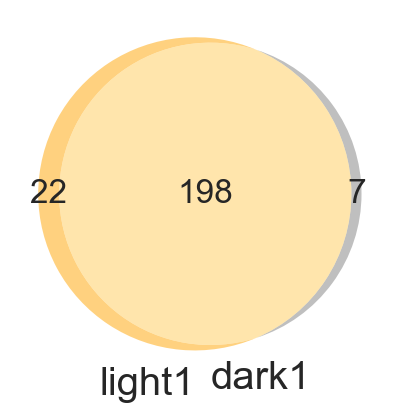

In [98]:
v = venn2(subsets = (np.sum(ls_n1) - np.sum(ls_n3) , np.sum(ls_n2) - np.sum(ls_n3), np.sum(ls_n3)), 
          set_labels = (cond1, cond2), 
          set_colors = ('orange', 'grey'), alpha = 0.5)

# plt.savefig(f'venn2_{cond1}_{cond2}.pdf', transparent=True)

### HD tuning stat vs run

In [459]:
d_hr_data.keys()

dict_keys(['20211207_JA0144_dark1', '20211207_JA0144_darkHR1', '20211207_JA0144_light1', '20211207_JA0144_lightHR1', '20220126_JA0153_dark1', '20220126_JA0153_darkHR1', '20220126_JA0153_light1', '20220126_JA0153_lightHR1', '20220302_JA0162_dark1', '20220302_JA0162_darkHR1', '20220302_JA0162_light1', '20220302_JA0162_lightHR1', '20220419_JA0164_dark1', '20220419_JA0164_darkHR1', '20220419_JA0164_light1', '20220419_JA0164_lightHR1', '20220819_JA0178_dark1', '20220819_JA0178_darkHR1', '20220819_JA0178_light1', '20220819_JA0178_lightHR1', '20220822_JA0178_dark1', '20220822_JA0178_darkHR1', '20220822_JA0178_light1', '20220822_JA0178_lightHR1', '20220824_JA0178_dark1', '20220824_JA0178_darkHR1', '20220824_JA0178_light1', '20220824_JA0178_lightHR1', '20220906_JA0178_dark1', '20220906_JA0178_darkHR1', '20220906_JA0178_light1', '20220906_JA0178_lightHR1', '20220812_JA0181_dark1', '20220812_JA0181_darkHR1', '20220812_JA0181_light1', '20220812_JA0181_lightHR1', '20220815_JA0181_dark1', '20220815_

array([ 23.,  27.,  34.,  56., 123.])

In [470]:
ls_tuning = []
speed_thr = 5
for k in d_hr_data.keys():
    dts, animal_name, cond = k.split('_')[-3:]
    rec_session = animal_name + '_' + dts
    tmp_ephys = d_hr_data[k]['ephys']
    tmp_beh = d_hr_data[k]['beh']
    units_in = tmp_ephys[tmp_ephys.hdc_flag == True].cids.unique()
    yaw = tmp_beh['yaw'].values
    lin_speed = tmp_beh['lin_vel'].values
    
    stat_idx, run_idx = get_stat_run_epochs(lin_speed, window_size=25, speed_thr = speed_thr)
    # at least 10 s data
    if stat_idx.size < 500 or run_idx.size < 500:
        continue
        
    print(f'{k}, stat {stat_idx.size}, run {run_idx.size}, # of HDC {units_in.size}')
    for unit in sorted(units_in):
#         print(unit)
        tmp_fr = tmp_ephys[tmp_ephys.cids == unit].iloc[stat_idx]
        r_fr, hd_tuning_fr, p_val_fr = bin_tuning_permute(yaw[stat_idx], tmp_fr.hz.values)
        cuid = str(unit) + '_' + rec
        angles = hd_tuning_fr[0]
        a = np.deg2rad(angles)
        fr_fr = hd_tuning_fr[1]
        if fr_fr.max() < 1:
            continue
    
        ls_tuning.append(pd.DataFrame({'hz': fr_fr, 'dir': angles, 'cids':unit, 'animal_name': animal_name,
                                       'r': r_fr, 'p_val': p_val_fr, 'rec_id': k, 'date_name': dts, 'run':'stat',
                                      'cond': cond, 'rec_session':rec_session, 'cuid':cuid }))
        
        # second half of the recording
        tmp_fr = tmp_ephys[tmp_ephys.cids == unit].iloc[run_idx]
        r_fr, hd_tuning_fr, p_val_fr = bin_tuning_permute(yaw[run_idx], tmp_fr.hz.values)

        angles = hd_tuning_fr[0]
        a = np.deg2rad(angles)
        fr_fr = hd_tuning_fr[1]
        if fr_fr.max() < 1:
            continue
            
        ls_tuning.append(pd.DataFrame({'hz': fr_fr, 'dir': angles, 'cids':unit, 'animal_name': animal_name,
                                       'r': r_fr, 'p_val': p_val_fr, 'rec_id': k, 'date_name': dts, 'run':'run',
                                      'cond': cond , 'rec_session':rec_session, 'cuid':cuid }))
        
#         fr_fr = np.append(fr_fr, fr_fr[0])
#         a = np.append(a, a[0])
    #     ax = plt.subplot(111, projection='polar')
    #         ax.set_theta_zero_location("N")
    #         ax.set_theta_direction(-1)
    #     ax.plot(a, fr_fr, label = 'head free', c = 'magenta')
    #     ax.plot(a, fr_fx, label = 'head fixed', c = 'cyan')
    #     ax.legend(loc='best', bbox_to_anchor=(1.5, 0.5, 0.5, 0.5))
    #     plt.show()
    
        break
    break
# df_hrtun_run = pd.concat(ls_tuning)
# df_hrtun_run.head()

20211207_JA0144_dark1, stat 7450, run 16550, # of HDC 8


,animal_name,cids,date_name,cuid,is_sua,depth,session_name,site,r,p_val,tuning,x_tuning,condition,rec_id,hdc_flag,rec_session,hem,ch_map
0,JA0144,0.0,20211207,0.0_20211207_JA0144_dark1,1.0,False,001,88,0.082941,0.656,31.002028,3.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
1,JA0144,0.0,20211207,0.0_20211207_JA0144_dark1,1.0,False,001,88,0.082941,0.656,26.494761,23.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
2,JA0144,0.0,20211207,0.0_20211207_JA0144_dark1,1.0,False,001,88,0.082941,0.656,29.836700,43.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
3,JA0144,0.0,20211207,0.0_20211207_JA0144_dark1,1.0,False,001,88,0.082941,0.656,25.480159,63.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
4,JA0144,0.0,20211207,0.0_20211207_JA0144_dark1,1.0,False,001,88,0.082941,0.656,31.546377,83.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13,JA0144,103.0,20211207,103.0_20211207_JA0144_dark1,0.0,False,001,44,0.154089,0.014,2.774627,263.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
14,JA0144,103.0,20211207,103.0_20211207_JA0144_dark1,0.0,False,001,44,0.154089,0.014,3.058394,283.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
15,JA0144,103.0,20211207,103.0_20211207_JA0144_dark1,0.0,False,001,44,0.154089,0.014,2.466867,303.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1
16,JA0144,103.0,20211207,103.0_20211207_JA0144_dark1,0.0,False,001,44,0.154089,0.014,2.694323,323.0,dark1,20211207_JA0144_dark1,False,JA0144_20211207,lADN,h1


In [1035]:
# df_hrtun_run.to_pickle('df_hrtun_run.pkl')

In [474]:
df_hrtun_run.head()

,hz,dir,cids,animal_name,r,p_val,rec_id,date_name,run,cond,rec_session,cuid,cond_run
0,0.302632,0.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1,dark1_stat
1,0.896024,20.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1,dark1_stat
2,1.610294,40.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1,dark1_stat
3,0.875433,60.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1,dark1_stat
4,0.877301,80.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1,dark1_stat


,animal_name,cids,date_name,is_sua,acronym,bm,hdc_flag,session_name,site,r,p_val,tuning,x_tuning,condition,rec_id,hd_model
0,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,31.002028,3.0,dark1,20211212_JA0164_dark1,False
1,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,26.494761,23.0,dark1,20211212_JA0164_dark1,False
2,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,29.836700,43.0,dark1,20211212_JA0164_dark1,False
3,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,25.480159,63.0,dark1,20211212_JA0164_dark1,False
4,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,31.546377,83.0,dark1,20211212_JA0164_dark1,False


In [423]:
df_hrtun_run_master = pd.concat([df_hrtun_run_1, df_hrtun_run_2])

In [422]:
df_hrtun_run_1.head()

,hz,dir,cids,animal_name,r,p_val,rec_id,date_name,run,cond,rec_session,cuid
0,0.142857,0.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1
1,1.484848,20.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1
2,1.703125,40.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1
3,1.327273,60.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1
4,0.691525,80.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1


In [28]:
# df_hrtun_run_master.to_pickle('df_hrtun_run_master')

### Plot tuning curves

In [283]:
%whos DataFrame

Variable              Type         Data/Info
--------------------------------------------
data                  DataFrame          animal_name   cids <...>148900 rows x 18 columns]
data_inp              DataFrame    Empty DataFrame\nColumns:<...>del, hdc_flag]\nIndex: []
data_tmp              DataFrame          animal_name   cids <...>192000 rows x 18 columns]
df_hr_master_1        DataFrame          animal_name   cids <...>148900 rows x 18 columns]
df_hr_master_2        DataFrame          animal_name   cids <...>690400 rows x 17 columns]
df_hr_taucorr         DataFrame                pair       ta<...>[13452 rows x 11 columns]
df_hr_tuning_master   DataFrame       animal_name   cids dat<...>120540 rows x 18 columns]
df_tmp_emb            DataFrame            yaw     emb_x    <...>n[4800 rows x 11 columns]
tmp2                  DataFrame          animal_name   cids <...>[48000 rows x 18 columns]


In [284]:
df_hr_tuning_master.head()

,animal_name,cids,date_name,is_sua,acronym,bm,hdc_flag,session_name,site,r,p_val,tuning,x_tuning,condition,rec_id,hd_model,cuid,depth
0,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,31.002028,3.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
1,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,26.494761,23.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
2,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,29.836700,43.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
3,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,25.480159,63.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
4,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,31.546377,83.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN


In [122]:
df_hr_tuning_master.date_name.unique()

array(['20211212', '20220209', '20220302', '20220419', '20220426',
       '08_29', '20220819', '20220822', '20220824', '20220906',
       '20220812', '20220815', '20220818', '01_26', '07_12', '07_22'],
      dtype=object)

In [356]:
data = df_hr_tuning_2[df_hr_tuning_2.hdc_flag == True]

angles = np.arange(0, 360, 20)
a = np.deg2rad(angles)
a = np.append(a, a[0])

for rec in data.date_name.unique()[:]:
    if '20220819' not in rec:
        continue
    tmp = data[data.date_name == rec]
    print(rec, tmp.animal_name.unique())
    for unit in tmp.cids.unique()[:]:
        
        ax = plt.subplot(111, projection = 'polar')
#         ax.yaxis.grid(linewidth=0)
#         ax.xaxis.grid(linewidth=6)
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.grid(False)
    #         ax.set_theta_zero_location("N")
    #         ax.set_theta_direction(-1)
        fr1 = tmp[(tmp.cids == unit) & (tmp.condition == 'light1')].tuning
        fr2 = tmp[(tmp.cids == unit) & (tmp.condition == 'dark1')].tuning
        r_r = np.round(tmp[(tmp.cids == unit) & (tmp.condition == 'light1')].r.min(), 2)
        r_vr = np.round(tmp[(tmp.cids == unit) & (tmp.condition == 'dark1')].r.min(), 2)

        if fr1.size > 1 and r_r > 0.3:
            print(unit)
            if sum(np.isnan(fr1)) > 3:
                continue
            fr1 = np.append(fr1, fr1[0])
            max_fr1 = round(fr1[~np.isnan(fr1)].max(), 2)
            
            # angles were reflected in arena code
            ax.plot(a, fr1, label = f'{r_r}, {max_fr1} Hz', c = 'grey')
            ax.legend(loc='best', bbox_to_anchor=(1.5, 0.5, 0.5, 0.5))
        
        if fr2.size > 1 and r_vr > 0.3:
            print(unit)
            if sum(np.isnan(fr2)) > 3:
                continue
            fr2 = np.append(fr2, fr2[0])
            max_fr2 = round(fr2[~np.isnan(fr2)].max(), 2)
            
            ax.plot(a, fr2, label = f'{r_vr}, {max_fr2} Hz',  c = 'brown')
            ax.legend(loc='best', bbox_to_anchor=(1.5, 0.5, 0.5, 0.5))
#         fr_resam, results_half = hd_tuning_width(fr2)
#         plt.plot(fr_resam)
#         plt.hlines(*results_half[1:])
        ax.set_xticks(np.pi/180. * np.linspace(180,  -180, 8, endpoint=False))
        ax.set_thetalim(-np.pi, np.pi)
        plt.show()
#         time.sleep(1)
#         plt.savefig(f'{rec}_{unit}_hr_tuning.pdf', transparent=True)
#         plt.clf()
    break
        

C:\Users\lab\AppData\Local\Temp\ipykernel_11684\2870833134.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data = df_hrtun_run_master[df_hr_tuning_2.hdc_flag == True]

KeyboardInterrupt



In [687]:
tmp.groupby()

array([13., 19., 35., 39., 44., 55., 69., 75., 77., 79., 84.])

In [29]:
df_hrtun_run_master.head()

,hz,dir,cids,animal_name,r,p_val,rec_id,date_name,run,cond,rec_session,cuid
0,0.142857,0.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1
1,1.484848,20.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1
2,1.703125,40.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1
3,1.327273,60.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1
4,0.691525,80.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1


### Plot tuning curves stat vs run

In [357]:
df_hrtun_run_master.head()

,animal_name,cids,date_name,is_sua,acronym,bm,hdc_flag,session_name,site,r,...,x_tuning,condition,rec_id,hd_model,hz,dir,run,cond,rec_session,cuid
0,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88.0,0.082941,...,3.0,dark1,20211212_JA0164_dark1,False,NaN,NaN,NaN,NaN,NaN,NaN
1,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88.0,0.082941,...,23.0,dark1,20211212_JA0164_dark1,False,NaN,NaN,NaN,NaN,NaN,NaN
2,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88.0,0.082941,...,43.0,dark1,20211212_JA0164_dark1,False,NaN,NaN,NaN,NaN,NaN,NaN
3,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88.0,0.082941,...,63.0,dark1,20211212_JA0164_dark1,False,NaN,NaN,NaN,NaN,NaN,NaN
4,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88.0,0.082941,...,83.0,dark1,20211212_JA0164_dark1,False,NaN,NaN,NaN,NaN,NaN,NaN


In [507]:
data = df_hrtun_run[df_hrtun_run.cond == 'dark1']

angles = np.arange(0, 360, 20)
a = np.deg2rad(angles)
a = np.append(a, a[0])

for rec in data.rec_id.unique()[:]:
    if '20220822_JA0178' not in rec:
        continue
    tmp = data[data.rec_id == rec]
    print(rec, tmp.animal_name.unique())
    for unit in tmp.cids.unique()[:]:
        
        ax = plt.subplot(111, projection = 'polar')
#         ax.yaxis.grid(linewidth=0)
#         ax.xaxis.grid(linewidth=6)
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.grid(False)
    #         ax.set_theta_zero_location("N")
    #         ax.set_theta_direction(-1)
        fr1 = tmp[(tmp.cids == unit) & (tmp.run == 'stat')].hz
        fr2 = tmp[(tmp.cids == unit) & (tmp.run == 'run')].hz
        r_r = np.round(tmp[(tmp.cids == unit) & (tmp.run == 'stat')].r.min(), 2)
        r_vr = np.round(tmp[(tmp.cids == unit) & (tmp.run == 'run')].r.min(), 2)

        if fr1.size > 1 or r_r > 0.5:
            print(unit)
            if sum(np.isnan(fr1)) > 3:
                continue
            fr1 = np.append(fr1, fr1[0])
            max_fr1 = round(fr1[~np.isnan(fr1)].max(), 2)
            
            # angles were reflected in arena code
            ax.plot(a, fr1, label = f'{r_r}, {max_fr1} Hz', c = 'lightgray')
            ax.legend(loc='best', bbox_to_anchor=(1.5, 0.5, 0.5, 0.5))
        
        if fr2.size > 1 or r_vr > 0.5:
            print(unit)
            if sum(np.isnan(fr2)) > 3:
                continue
            fr2 = np.append(fr2, fr2[0])
            max_fr2 = round(fr2[~np.isnan(fr2)].max(), 2)
            
            ax.plot(a, fr2, label = f'{r_vr}, {max_fr2} Hz',  c = 'gray')
            ax.legend(loc='best', bbox_to_anchor=(1.5, 0.5, 0.5, 0.5))
#         fr_resam, results_half = hd_tuning_width(fr2)
#         plt.plot(fr_resam)
#         plt.hlines(*results_half[1:])
        ax.set_xticks(np.pi/180. * np.linspace(180,  -180, 8, endpoint=False))
        ax.set_thetalim(-np.pi, np.pi)
      
#         plt.show()
        time.sleep(0.5)
        plt.savefig(f'{rec}_{unit}_hr_tuning.pdf', transparent=True)
        plt.clf()
        
#     break

20220822_JA0178_dark1 ['JA0178']
5.0
5.0


meta NOT subset; don't know how to subset; dropped


7.0
7.0


meta NOT subset; don't know how to subset; dropped


10.0
10.0


meta NOT subset; don't know how to subset; dropped


11.0
11.0


meta NOT subset; don't know how to subset; dropped


12.0
12.0


meta NOT subset; don't know how to subset; dropped


13.0
13.0


meta NOT subset; don't know how to subset; dropped


15.0
15.0


meta NOT subset; don't know how to subset; dropped


16.0
16.0


meta NOT subset; don't know how to subset; dropped


17.0
17.0


meta NOT subset; don't know how to subset; dropped


18.0
18.0


meta NOT subset; don't know how to subset; dropped


19.0
19.0


meta NOT subset; don't know how to subset; dropped


24.0
24.0


meta NOT subset; don't know how to subset; dropped


25.0
25.0


meta NOT subset; don't know how to subset; dropped


84.0
84.0


meta NOT subset; don't know how to subset; dropped


85.0
85.0


meta NOT subset; don't know how to subset; dropped


86.0
86.0


meta NOT subset; don't know how to subset; dropped


87.0
87.0


meta NOT subset; don't know how to subset; dropped


88.0
88.0


meta NOT subset; don't know how to subset; dropped


89.0
89.0


meta NOT subset; don't know how to subset; dropped


92.0
92.0


meta NOT subset; don't know how to subset; dropped


93.0
93.0


meta NOT subset; don't know how to subset; dropped


94.0
94.0


meta NOT subset; don't know how to subset; dropped


95.0
95.0


meta NOT subset; don't know how to subset; dropped


118.0
118.0


meta NOT subset; don't know how to subset; dropped


<Figure size 640x480 with 0 Axes>

In [536]:
# df_hrtun_run_master.to_pickle('df_hrtun_run_master.pkl')

### Summary plots

In [191]:
df_hrtun_run.head()

,hz,dir,cids,animal_name,r,p_val,rec_id,date_name,run,cond,rec_session,cuid
0,0.302632,0.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1
1,0.896024,20.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1
2,1.610294,40.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1
3,0.875433,60.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1
4,0.877301,80.0,25.0,JA0144,0.351392,0.0,20211207_JA0144_dark1,20211207,stat,dark1,JA0144_20211207,25.0_20220829_MC038_lightHR1


In [356]:
_inp_plot = df_hrtun_run[df_hrtun_run.cond == 'lightHR1'].groupby([ 'rec_id', 'cuid', 'run' ])['hz'].max().reset_index()
_inp_plot.pivot(index = ['rec_id', 'cuid'], columns = 'run', values = 'hz').dropna()


ValueError: Index contains duplicate entries, cannot reshape

In [103]:
df_hr_tuning_master['condition'].unique()

array(['dark1', 'darkHR1', 'light1', 'lightHR1'], dtype=object)

<AxesSubplot: xlabel='r', ylabel='Density'>

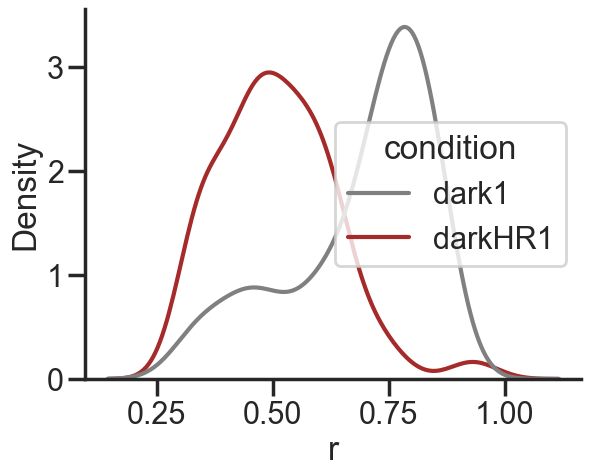

In [110]:
cond1 = 'dark1'
cond2 = 'darkHR1'
data = df_hr_tuning_master[df_hr_tuning_master.hdc_flag == True]
cond = 'condition'
y = 'r'
# vis_rec_sess = df_tun_proc[(df_tun_proc.head_fixation == 'VIS') & (df_tun_proc.dir == 0)].rec_session.unique()
# sessions_in = df_betti[(df_betti.cond == 'TS6-HF') & (df_betti.stat_off_manifold > 0.5)].rec_session.unique()

pal = ('grey', 'brown')
# pal = ('darkgreen', 'lightgreen')
_inp_plot = data[ ((data.condition == cond1) | (data.condition == cond2))
#             & (data.rec_session.isin(sessions_in))
            ].groupby([ 'animal_name', 'cids', cond])[y].max().reset_index()


sns.kdeplot(x = y, data = _inp_plot, hue = cond,  fill=False, 
            cumulative=False, common_grid=True,
           common_norm = False, legend = True, 
#             cut = 0,
            palette = pal)


# plt.xlim(0, 1)
# fname = f'kde_{y}_{cond1}_run_stat.pdf'
# plt.savefig(f'kde_{y}_{cond1}_{cond2}.pdf', transparent=True)

In [114]:
_inp_plot.groupby(cond)[y].describe()

,count,mean,std,min,25%,50%,75%,max
condition,,,,,,,,
dark1,178.0,0.690354,0.153759,0.303416,0.604029,0.740459,0.811487,0.883000
darkHR1,143.0,0.509599,0.126228,0.306197,0.421283,0.500556,0.588719,0.957612


In [115]:
a = _inp_plot[_inp_plot[cond] == cond1][y].values
b = _inp_plot[_inp_plot[cond] == cond2][y].values
print(f'test for {y}')
print(f'# of units in {cond1} {a.size}')
print(f'# of units in {cond2} {b.size}')
print(f'median {y} {cond1} {np.median(a)}')
print(f'median {y} {cond2} {np.median(b)}')

print(stats.mannwhitneyu(a, b))

test for r
# of units in dark1 178
# of units in darkHR1 143
median r dark1 0.7404588535584706
median r darkHR1 0.5005559203965796
MannwhitneyuResult(statistic=20706.0, pvalue=4.728902475799938e-22)


In [427]:
df_hrtun_run_master.head()

,hz,dir,cids,animal_name,r,p_val,rec_id,date_name,run,cond,rec_session,cuid,cond_run
0,0.142857,0.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1,dark1_stat
1,1.484848,20.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1,dark1_stat
2,1.703125,40.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1,dark1_stat
3,1.327273,60.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1,dark1_stat
4,0.691525,80.0,25.0,JA0144,0.314194,0.0,20211212_JA0144_dark1,20211212,stat,dark1,JA0144_20211212,25.0_20211212_JA0144_dark1,dark1_stat


In [193]:
df_hrtun_run['cond_run'] = df_hrtun_run['cond'] + '_' + df_hrtun_run['run']

meta NOT subset; don't know how to subset; dropped


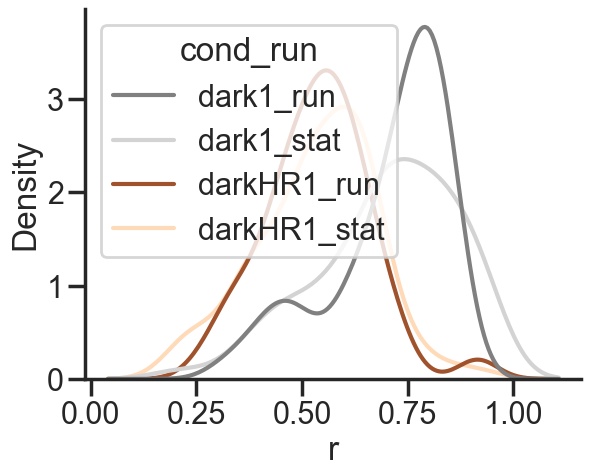

In [495]:
y = 'r'
cond1 = 'stat'
cond2 = 'run'
# coi = ['light1', 'lightHR1']; pal = ('darkorange', 'gold', 'darkgreen', 'lightgreen')
coi = ['dark1', 'darkHR1']; pal = ('gray', 'lightgray', 'sienna', 'peachpuff' )
data = df_hrtun_run[(df_hrtun_run.cond.isin(coi) )
                       ]

# vis_rec_sess = df_tun_proc[(df_tun_proc.head_fixation == 'VIS') & (df_tun_proc.dir == 0)].rec_session.unique()
# sessions_in = df_betti[(df_betti.cond == 'TS6-HF') & (df_betti.stat_off_manifold > 0.5)].rec_session.unique()


# _inp_plot = df_tun_proc[ (df_tun_proc.hdc == 1)
#             & (df_tun_proc.rec_session.isin(sessions_in))
#             & ((df_tun_proc.cond == cond1) | (df_tun_proc.cond == cond2))
#             ].groupby([ 'implant', 'cond', 'rec_session','cids' , 'cuid'])[y].max().reset_index()

_inp_plot = data.groupby([ 'cond_run', 'rec_id', 'rec_session', 'run', 'cids'])[y].max().reset_index()
_inp_plot2 = _inp_plot.pivot(index = ['cond_run', 'rec_id', 'cids'], columns = 'run', values = y).dropna().reset_index()
_inp_plot3 = pd.melt(_inp_plot2, id_vars = ['cond_run', 'rec_id', 'cids'], value_vars = ['stat', 'run'])


sns.kdeplot(x = y, data = _inp_plot, hue = 'cond_run',  fill=False, 
            cumulative=False, common_grid=True,
           common_norm = False, legend = True, 
#             cut = 0,
            palette = pal)


# plt.xlim(0, 1)
# fname = f'kde_TS6-HF_{y}_{cond1}_{cond2}.pdf'
plt.savefig(f'kde_hr_tunrun_{coi}_{y}.pdf', transparent=True)

meta NOT subset; don't know how to subset; dropped


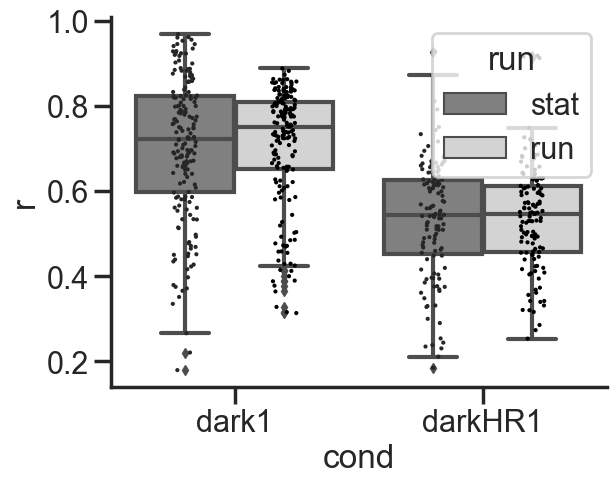

In [496]:
cond1 = 'stat'
cond2 = 'run'

# vis_rec_sess = df_tun_proc[(df_tun_proc.head_fixation == 'VIS') & (df_tun_proc.dir == 0)].rec_session.unique()
# sessions_in = df_betti[(df_betti.cond == 'TS6-HF') & (df_betti.stat_off_manifold > 0.5)].rec_session.unique()
data = df_hrtun_run

# _inp_plot = df_tun_proc[ (df_tun_proc.hdc == 1)
#             & (df_tun_proc.rec_session.isin(sessions_in))
#             & ((df_tun_proc.cond == cond1) | (df_tun_proc.cond == cond2))
#             ].groupby([ 'implant', 'cond', 'rec_session','cids' , 'cuid'])[y].max().reset_index()

_inp_plot = data[data.cond.isin(coi)].groupby([ 'cond', 'rec_id', 'run', 'cids'])[y].max().reset_index()
_inp_plot2 = _inp_plot.pivot(index = ['cond', 'rec_id', 'cids'], columns = 'run', values = y).dropna().reset_index()
_inp_plot3 = pd.melt(_inp_plot2, id_vars = ['cond', 'rec_id', 'cids'], value_vars = ['stat', 'run'], value_name=y)

sns.boxplot(data=_inp_plot3, x ='cond', y = y, hue = 'run', palette = pal)
sns.stripplot(data=_inp_plot3, x ='cond', y = y, hue = 'run', size = 3,
              dodge = True, palette='dark:black', legend = None)

# plt.xlim(0, 1)
# fname = f'kde_TS6-HF_{y}_{cond1}_{cond2}.pdf'
plt.savefig(f'boxplot_hr_tunrun_{coi}_{y}.pdf', transparent=True)

In [497]:
_inp_plot3.groupby(['cond', 'run'])[y].describe()

count      mean       std       min       25%       50%  \
cond    run                                                             
dark1   run   178.0  0.707423  0.139421  0.313530  0.652571  0.751476   
        stat  178.0  0.702191  0.166380  0.179547  0.596854  0.722386   
darkHR1 run   123.0  0.537708  0.123324  0.253495  0.457475  0.546315   
        stat  123.0  0.534647  0.140313  0.185260  0.451801  0.544784   

                   75%       max  
cond    run                       
dark1   run   0.809237  0.887854  
        stat  0.822949  0.968440  
darkHR1 run   0.611200  0.917750  
        stat  0.627009  0.927531

In [499]:
a1 = _inp_plot3[(_inp_plot3.cond == coi[0]) & (_inp_plot3.run == 'stat')][y].values
a2 = _inp_plot3[(_inp_plot3.cond == coi[0]) & (_inp_plot3.run == 'run')][y].values
b1 = _inp_plot3[(_inp_plot3.cond == coi[1]) & (_inp_plot3.run == 'stat')][y].values
b2 = _inp_plot3[(_inp_plot3.cond == coi[1]) & (_inp_plot3.run == 'run')][y].values


print(f'test for {y}')
# print(f'# of implntations {_inp_plot.implant.unique().size}')
print(f'# of sessions {coi[0]} {_inp_plot3[_inp_plot3.cond == coi[0]].rec_id.unique().size}')
print(f'# of sessions {coi[1]} {_inp_plot3[_inp_plot3.cond == coi[1]].rec_id.unique().size}')


stat1, pval1 = stats.wilcoxon(a1, a2)
print(f'{coi[0]} stat vs run {stat1} {pval1}')
stat2, pval2 = stats.wilcoxon(b1, b2)
print(f'{coi[1]} stat vs run {stat2} {pval2}')
stat3, pval3 = stats.mannwhitneyu(a1, b1)
print(f'stat  {stat3} {pval3}')
stat4, pval4 = stats.mannwhitneyu(a2, b2)
print(f'run {stat4} {pval4}')
pvals = [pval1, pval2, pval3, pval4]  
print('Benjamini/Hochberg (non-negative)')
print(multipletests(pvals, alpha=0.05, method='fdr_bh'))


test for r
# of sessions dark1 13
# of sessions darkHR1 12
dark1 stat vs run 7881.0 0.9023117376878079
darkHR1 stat vs run 3631.0 0.6459665857187903
stat  17264.0 1.7477201752564274e-17
run 18024.0 1.5236628385113152e-21
Benjamini/Hochberg (non-negative)
(array([False, False,  True,  True]), array([9.02311738e-01, 8.61288781e-01, 3.49544035e-17, 6.09465135e-21]), 0.012741455098566168, 0.0125)


meta NOT subset; don't know how to subset; dropped


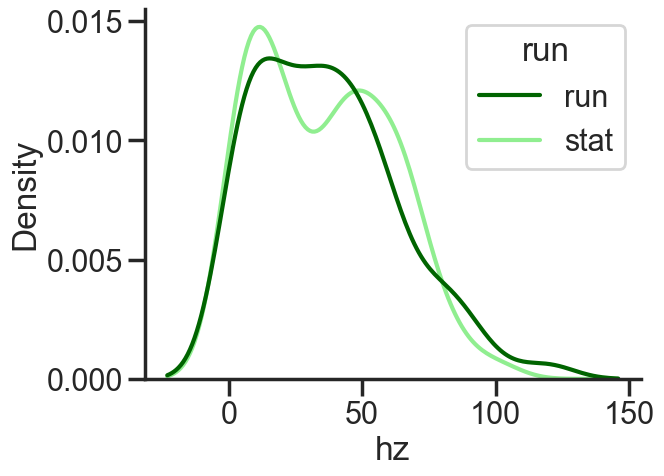

In [401]:
y = 'hz'
cond = 'lightHR1'
data = df_hrtun_run_master


# vis_rec_sess = df_tun_proc[(df_tun_proc.head_fixation == 'VIS') & (df_tun_proc.dir == 0)].rec_session.unique()
# sessions_in = df_betti[(df_betti.cond == 'TS6-HF') & (df_betti.stat_off_manifold > 0.5)].rec_session.unique()

pal = ('darkgreen', 'lightgreen')
# pal = ('darkorange', 'orange')
_inp_plot = data[ (data.cond == cond)
#             & (data.rec_session.isin(sessions_in))
#             & ((data.condition == cond1) | (data.condition == cond2))
            ].groupby([ 'animal_name', 'cond', 'cids', 'run'])[y].max().reset_index()


sns.kdeplot(x = y, data = _inp_plot, hue = 'run',  fill=False, 
            cumulative=False, common_grid=True,
           common_norm = False, legend = True, 
#             cut = 0,
            palette = pal)


# plt.xlim(0, 1)
# fname = f'kde_{y}_{cond}_run_stat.pdf'
# plt.savefig(f'kde_hr_{cond}_{y}.pdf', transparent=True)

In [395]:
_inp_plot.groupby('run')[y].describe()

,count,mean,std,min,25%,50%,75%,max
run,,,,,,,,
run,137.0,42.599172,28.290258,2.057052,20.528302,40.439242,61.00087,121.692137
stat,137.0,37.461946,25.944782,1.117647,14.251534,35.440000,52.00000,122.481818


In [396]:
a = _inp_plot[_inp_plot['run'] == 'stat'][y].values
b = _inp_plot[_inp_plot['run'] == 'run'][y].values
print(f'test for {y}')
print(f'# of units in {cond1} {a.size}')
print(f'# of units in {cond2} {b.size}')
print(f'median {y} {cond1} {np.median(a)}')
print(f'median {y} {cond2} {np.median(b)}')

print(stats.ks_2samp(a, b))

test for hz
# of units in light1 137
# of units in lightHR1 137
median hz light1 35.44
median hz lightHR1 40.439241917502784
KstestResult(statistic=0.12408759124087591, pvalue=0.24274772991719812)


In [49]:
df_hr_tuning_master.head()

,animal_name,cids,date_name,is_sua,acronym,bm,hdc_flag,session_name,site,r,p_val,tuning,x_tuning,condition,rec_id,hd_model,cuid,depth
0,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,31.002028,3.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
1,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,26.494761,23.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
2,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,29.836700,43.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
3,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,25.480159,63.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
4,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,31.546377,83.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN


In [58]:
df_hr_tuning_master['rec_session'] = df_hr_tuning_master.animal_name + '_' + df_hr_tuning_master.date_name

In [130]:
d_emb_ang = {}

20220126_JA0153_lightHR1
stat_norot omi 0.9137546468401487
stat_rot omi 0.405607476635514
run_norot omi 0.08064516129032258
run_rot omi 0.10024096385542168


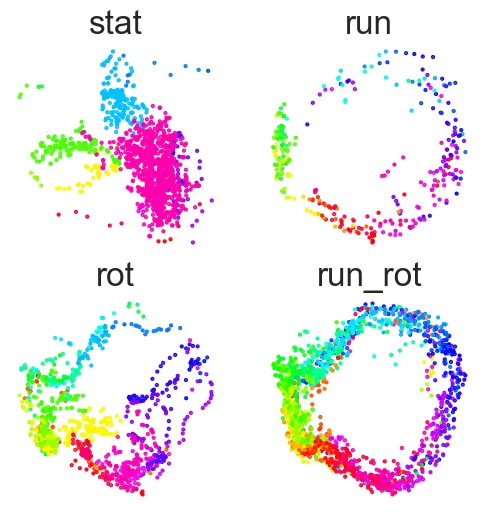

20220302_JA0162_lightHR1
stat_norot omi 0.6491315136476427
stat_rot omi 0.42093023255813955
run_norot omi 0.023529411764705882
run_rot omi 0.1


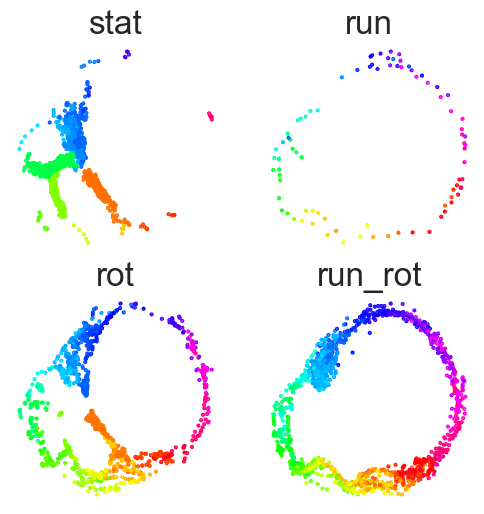

20220419_JA0164_lightHR1
stat_norot omi 0.8744186046511628
stat_rot omi 0.21666666666666667
run_norot omi 0.82265625
run_rot omi 0.1011764705882353


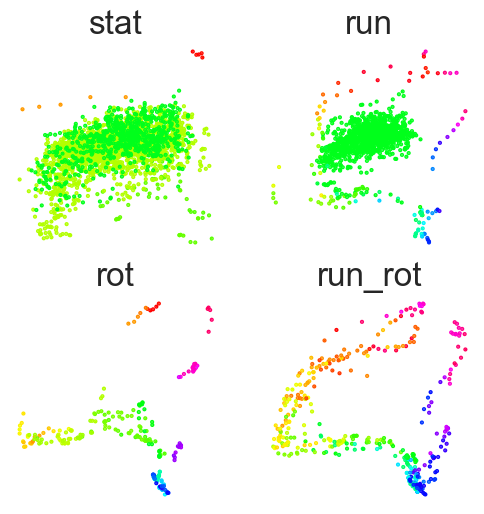

20220819_JA0178_lightHR1
stat_norot omi 0.906830122591944
stat_rot omi 0.4896
run_norot omi 0.009523809523809525
run_rot omi 0.1


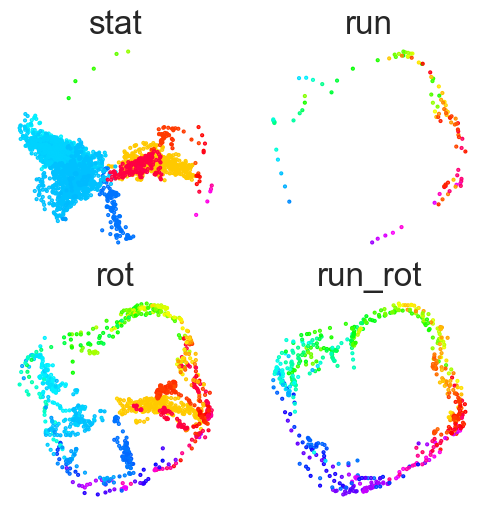

20220822_JA0178_lightHR1
stat_norot omi 0.871969696969697
stat_rot omi 0.30847457627118646
run_norot omi 0.7051851851851851
run_rot omi 0.1005586592178771


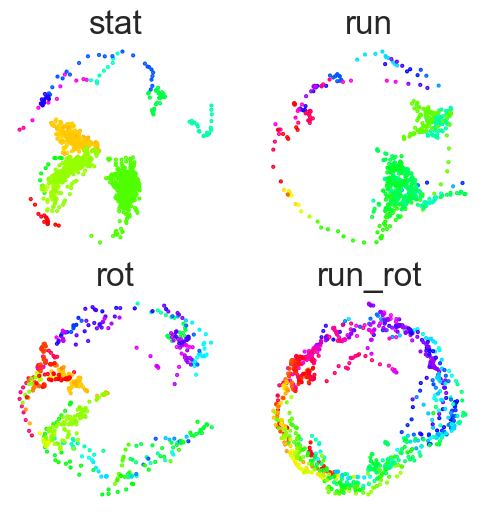

20220812_JA0181_lightHR1
stat_norot omi 0.3005970149253731
stat_rot omi 0.06792452830188679
run_norot omi 0.13333333333333333
run_rot omi 0.1


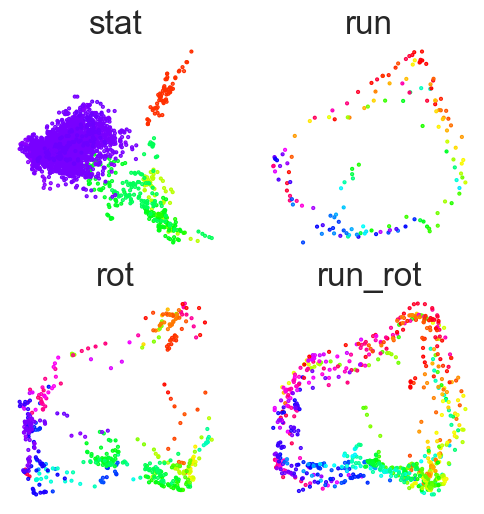

20220815_JA0181_lightHR1
stat_norot omi 0.9703703703703703
stat_rot omi 0.7238095238095238
run_norot omi 0.14
run_rot omi 0.1006896551724138


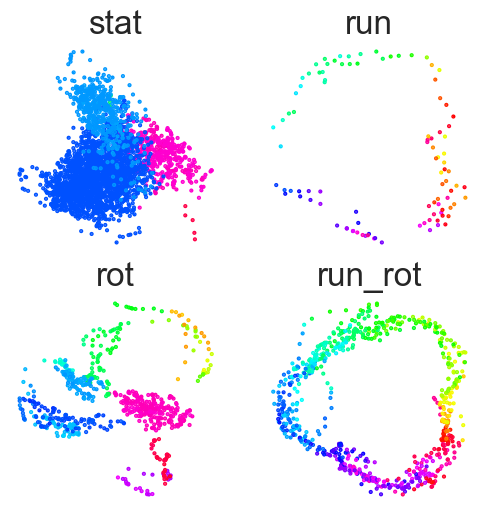

20220818_JA0181_lightHR1
stat_norot omi 0.9315716272600835
stat_rot omi 0.5468926553672316
run_norot omi 0.06
run_rot omi 0.1


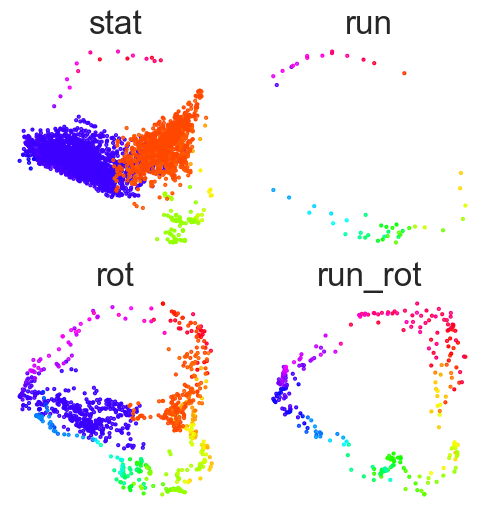

20220712_MC022_lightHR1
stat_norot omi 0.6761061946902654
stat_rot omi 0.2326797385620915
run_norot omi 0.043478260869565216
run_rot omi 0.1


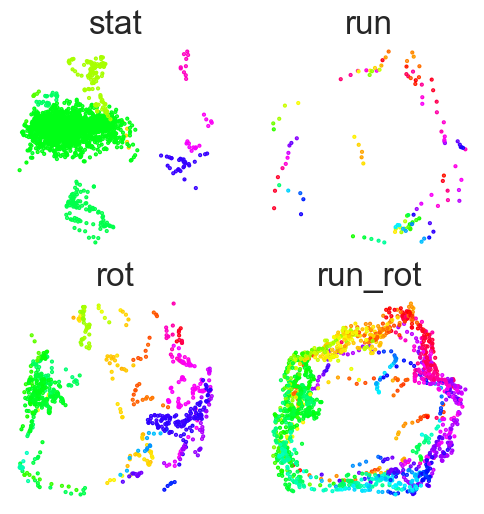

,rec_id,dec_err,omi,occ,run_cond
0,20220126_JA0153_lightHR1,32.312,0.913755,0.280208,stat_norot
0,20220126_JA0153_lightHR1,24.467,0.405607,0.222917,stat_rot
0,20220126_JA0153_lightHR1,26.776,0.080645,0.064583,run_norot
0,20220126_JA0153_lightHR1,35.079,0.100241,0.432292,run_rot
0,20220302_JA0162_lightHR1,17.038,0.649132,0.419792,stat_norot


In [42]:
col_list = ['red', 'green', 'purple']
angles = np.arange(-180, 200, 20)
h1_bar_max = 40
ls = []
lin_vel_thr = 4
ang_vel_thr = 20
ls_name = ['stat_norot', 'stat_rot', 'run_norot', 'run_rot']

for k in d_hr_emb.keys():
    if 'lightHR1' not in k:
        continue
    dts, animal_name, cond = k.split('_')[-3:]
    f,ax = plt.subplots(2, 2, figsize = (6, 6))

    rec_session = animal_name + '_' + dts
    tmp = d_hr_emb[k]
    isomap = tmp['isomap']
    measured_yaw = tmp['measured_yaw']
    isomap_yaw, dec_err, _ = decode_az_isomap(isomap[:, 0], isomap[:, 1], measured_yaw[:])
    dyaw = compute_dYaw(measured_yaw)
    # sampling 10 Hz
    ang_vel = dyaw*100
    
    stat_idx, run_idx = tmp['stat_idx'], tmp['run_idx']
    # stat_dec_err, loc_dec_err = tmp['stat_dec_err'], tmp['loc_dec_err']
    lin_speed = tmp['lin_vel']
    
    # find stat, run, rot epochs
    stat_idx, run_idx = get_stat_run_epochs(lin_speed, window_size=5, speed_thr = lin_vel_thr)
    _, rot_idx = get_stat_run_epochs(ang_vel, window_size=5, speed_thr = ang_vel_thr)

    # Finding unique elements
    stat_norot = np.setdiff1d(stat_idx, rot_idx)
    stat_rot = np.intersect1d(stat_idx, rot_idx)
    run_norot = np.setdiff1d(run_idx, rot_idx)
    run_rot = np.intersect1d(run_idx, rot_idx)
    
    stat_rot_ratio = stat_rot.size/stat_idx.size
    run_rot_ratio = run_rot.size/run_idx.size

    run_ratio = run_idx.size/lin_speed.size
    # 50 samples = 5s
    occup, _ = np.histogram(measured_yaw[stat_idx], bins = angles)
    stat_az_occ = occup[occup > 10].size/occup.size
    occup, _ = np.histogram(measured_yaw[run_idx], bins = angles)
    run_az_occ = occup[occup > 10].size/occup.size
    # compute off manifold ratios
    _, rad_manifold = compute_radius(isomap[:,0], isomap[:,1])
    offmanifold_threshold = np.percentile(rad_manifold[run_rot], 10)

    
    print(f'{k}')

    ls_beh_cond = [stat_norot, stat_rot, run_norot, run_rot]

    for idx, val in enumerate(ls_beh_cond):
        dec_err = round(np.mean(abs(((measured_yaw[val] - isomap_yaw[val]) + 180)%360 - 180)), 3)
        omi = np.sum(rad_manifold[val] < offmanifold_threshold)/rad_manifold[val].size 
        beh_occ = val.size/lin_speed.size
        print(f'{ls_name[idx]} omi {omi}')
        tmp_df = pd.DataFrame({'rec_id': k, 'dec_err': dec_err, 'omi': omi, 'occ': beh_occ, 'run_cond': ls_name[idx]}, index = [0])
        ls.append(tmp_df)
    
    # start_time = time.time()
    # d_emb_ang[k] = {}
    # for idx, val in enumerate(ls_beh_cond):
    #     print (ls_name[idx], val.size)
    #     d_emb_ang[k][ls_name[idx]] = {}
    #     try:
    #         # stat_norot
    #         d_emb_ang[k][ls_name[idx]]['dec_err'] = ls_decerr[idx]
    #         d_emb_ang[k][ls_name[idx]]['idx'] = val
    #         h0, h1, h2 = compute_betti(isomap[val, :])
    #         d_emb_ang[k][ls_name[idx]]['h0'], d_emb_ang[k][ls_name[idx]]['h1'], d_emb_ang[k][ls_name[idx]]['h2'] = h0, h1, h2
    #         to_plot, h1_bar = get_long_bettibars(h0, h1, h2)
    #         d_emb_ang[k][ls_name[idx]]['h1bar'] = h1_bar
    #     except:
    #         print('not def')

    # end_time = time.time()
    # print(end_time - start_time)
    
    ax[0][0].scatter(isomap[stat_norot,0], isomap[stat_norot,1], s = 1, c = measured_yaw[stat_norot], 
                                           vmin = -180, vmax = 180, cmap = 'hsv')
    ax[0][0].axis('off')
    ax[0][0].set_title('stat')
    plt.xticks([])

    ax[1][0].scatter(isomap[stat_rot,0], isomap[stat_rot,1], s = 1, c = measured_yaw[stat_rot], 
                                           vmin = -180, vmax = 180, cmap = 'hsv')
    ax[1][0].axis('off')
    ax[1][0].set_title('rot')
    plt.xticks([])
    
    ax[0][1].scatter(isomap[run_norot,0], isomap[run_norot,1], s = 1, c = measured_yaw[run_norot], 
                                           vmin = -180, vmax = 180, cmap = 'hsv')
    ax[0][1].axis('off')
    ax[0][1].set_title('run')
    plt.xticks([])
    
    ax[1][1].scatter(isomap[run_rot,0], isomap[run_rot,1], s = 1, c = measured_yaw[run_rot], 
                                           vmin = -180, vmax = 180, cmap = 'hsv')
    ax[1][1].axis('off')
    ax[1][1].set_title('run_rot')
    plt.xticks([])
    
    plt.show()
    # break

df_emb_ang = pd.concat(ls)
df_emb_ang.head()

In [51]:
measured_yaw.min()

np.float64(-180.0)

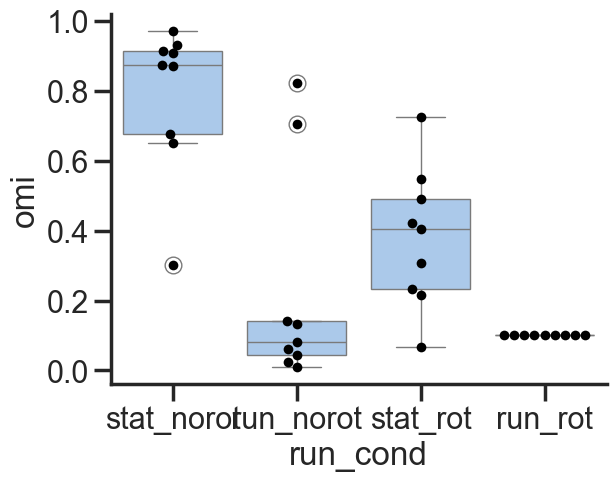

In [76]:
_inp_plot = df_emb_ang
y = 'omi'
ls_name = ['stat_norot', 'run_norot', 'stat_rot',  'run_rot']

sns.boxplot(data = _inp_plot, x = 'run_cond', y = y, order = ls_name)
sns.swarmplot(data = _inp_plot, x = 'run_cond', y = y, size = 7, color = 'k', dodge = True, legend = False)

plt.savefig(f'boxplot_hr_{y}_lin-ang_vel.pdf', transparent = True)

In [44]:
df_emb_ang.groupby('run_cond')['omi'].describe()

,count,mean,std,min,25%,50%,75%,max
run_cond,,,,,,,,
run_norot,9.0,0.224261,0.310529,0.009524,0.043478,0.080645,0.140000,0.822656
run_rot,9.0,0.100296,0.000424,0.100000,0.100000,0.100000,0.100559,0.101176
stat_norot,9.0,0.788306,0.214386,0.300597,0.676106,0.874419,0.913755,0.970370
stat_rot,9.0,0.379176,0.197257,0.067925,0.232680,0.405607,0.489600,0.723810


In [50]:
a1 = _inp_plot[_inp_plot.run_cond == 'stat_norot'][y]
a2 = _inp_plot[_inp_plot.run_cond == 'stat_rot'][y]
a3 = _inp_plot[_inp_plot.run_cond == 'run_norot'][y]
a4 = _inp_plot[_inp_plot.run_cond == 'run_rot'][y]

print(stats.kruskal(a1, a2, a3, a4))
print('stat vs run')
print(stats.mannwhitneyu(a1, a3))

print('stat vs rot')
print(stats.mannwhitneyu(a1, a2))

print('stat vs run_rot')
print(stats.mannwhitneyu(a1, a4))

KruskalResult(statistic=np.float64(20.10480286738351), pvalue=np.float64(0.00016146134776434573))
stat vs run
MannwhitneyuResult(statistic=np.float64(75.0), pvalue=np.float64(0.0026797144168214824))
stat vs rot
MannwhitneyuResult(statistic=np.float64(73.0), pvalue=np.float64(0.004718198728115028))
stat vs run_rot
MannwhitneyuResult(statistic=np.float64(81.0), pvalue=np.float64(0.0003581942891715736))


In [87]:
df_arena_emb.condition.unique()

array(['light1', 'dark'], dtype=object)

In [272]:
# df_arena_emb.loc[:, 'running'] = np.where(df_arena_emb['vel'] > 5, True, False)
# df_frun_emb.loc[:, 'running'] = np.where(df_frun_emb['velocity'] > 5, True, False)
df_hr_arena_emb.loc[:, 'running'] = np.where(df_hr_arena_emb['vel'] > 5, True, False)
# df_arena_emb['emb_angle'] =  np.arctan2(df_arena_emb.emb_x, df_arena_emb.emb_y)*180/np.pi

In [217]:
cond_ls

['dark1', 'darkHR1', 'light1', 'lightHR1']

20211212_JA0144_dark1


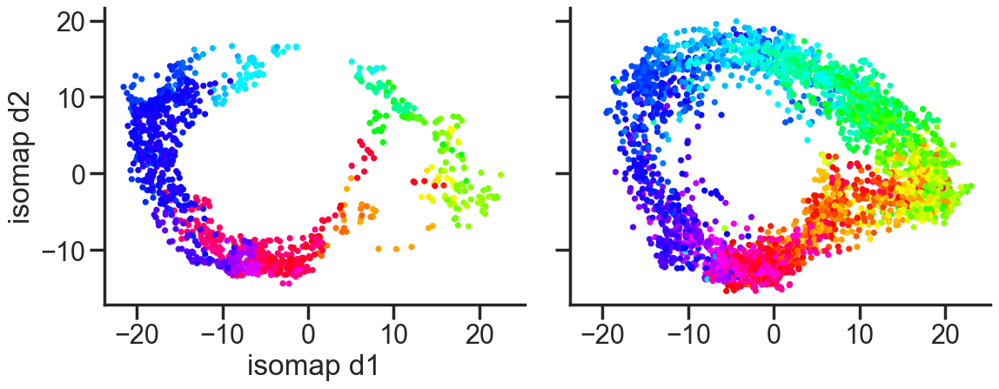

20211212_JA0144_darkHR1


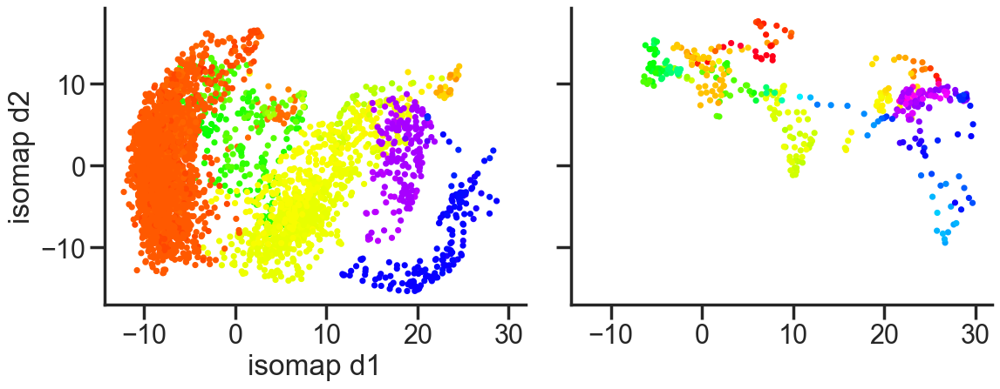

20211212_JA0144_light1


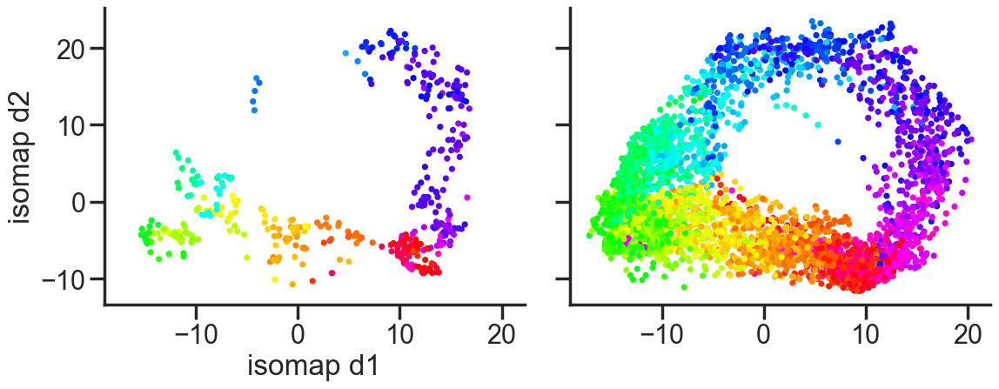

20211212_JA0144_lightHR1


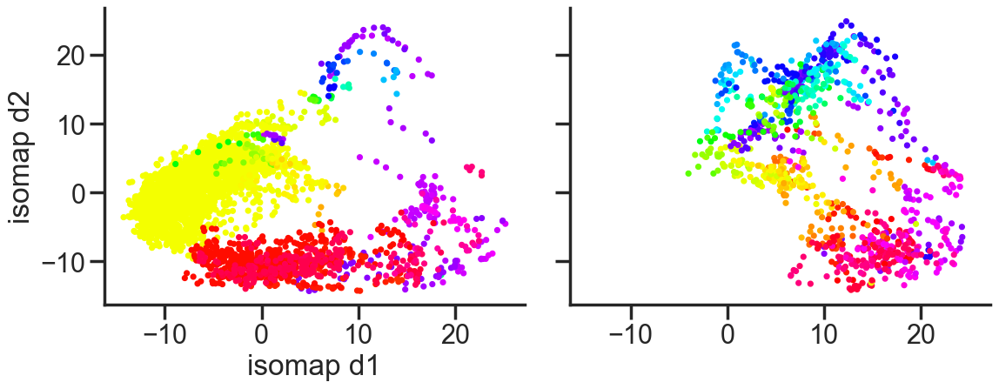

20220209_JA0153_dark1


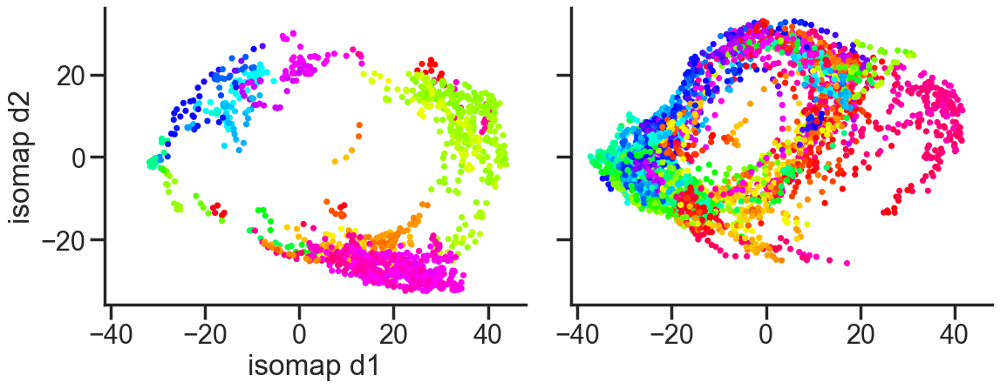

20220209_JA0153_darkHR1


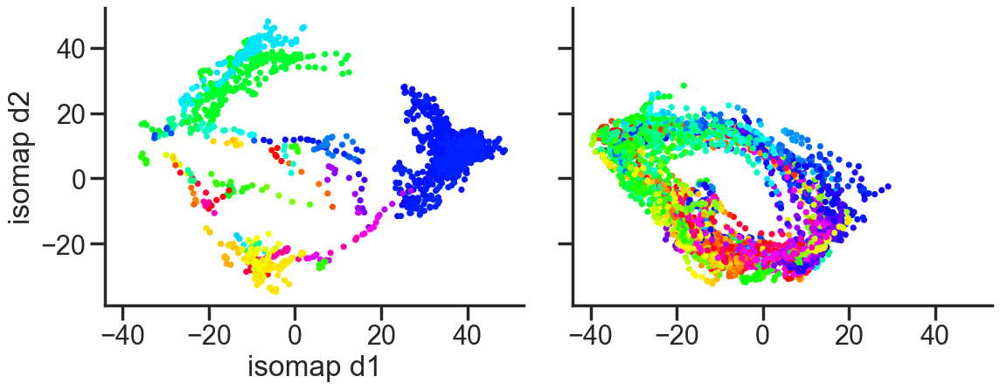

20220209_JA0153_light1


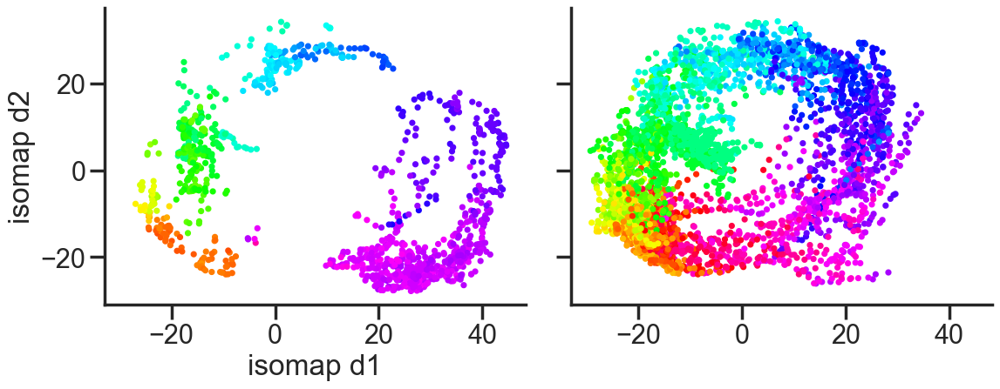

20220209_JA0153_lightHR1


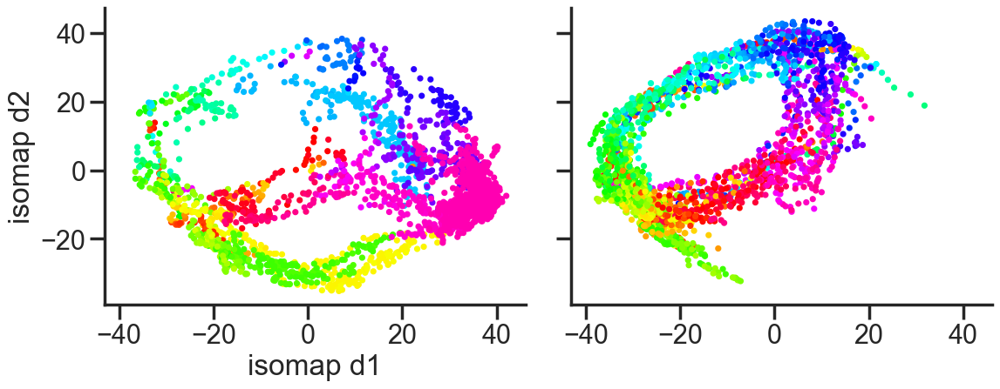

20220302_JA0162_dark1


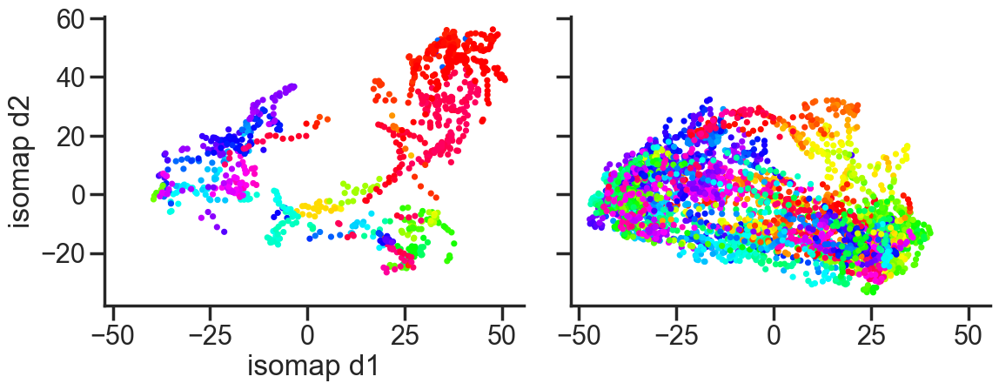

20220302_JA0162_darkHR1


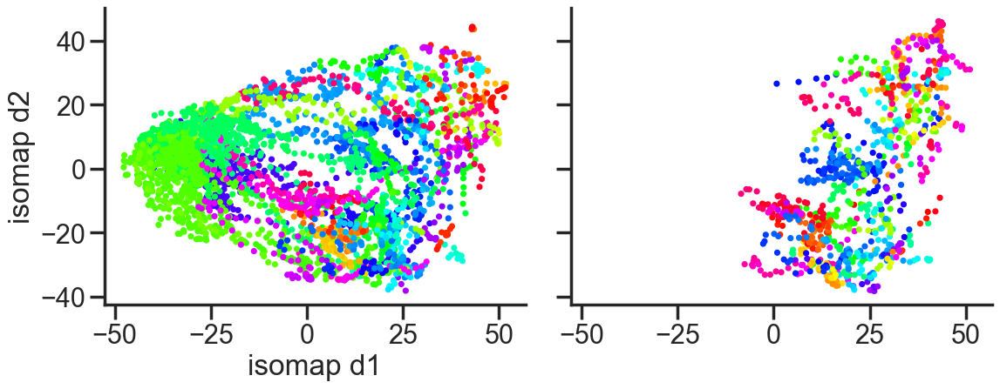

20220302_JA0162_light1


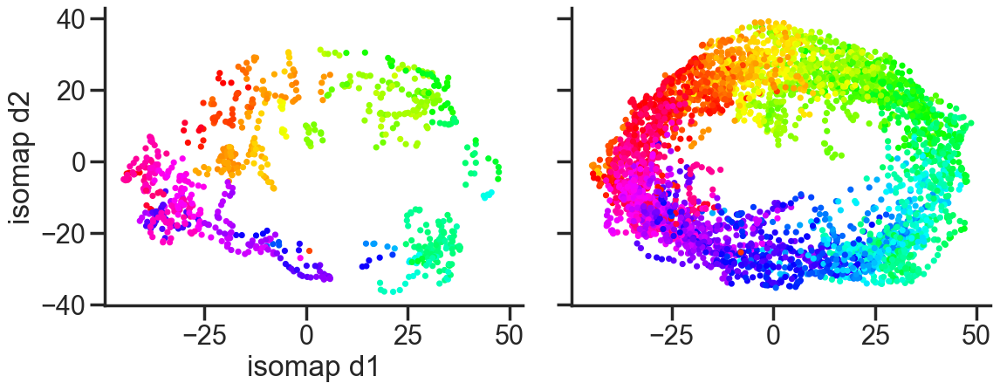

20220302_JA0162_lightHR1


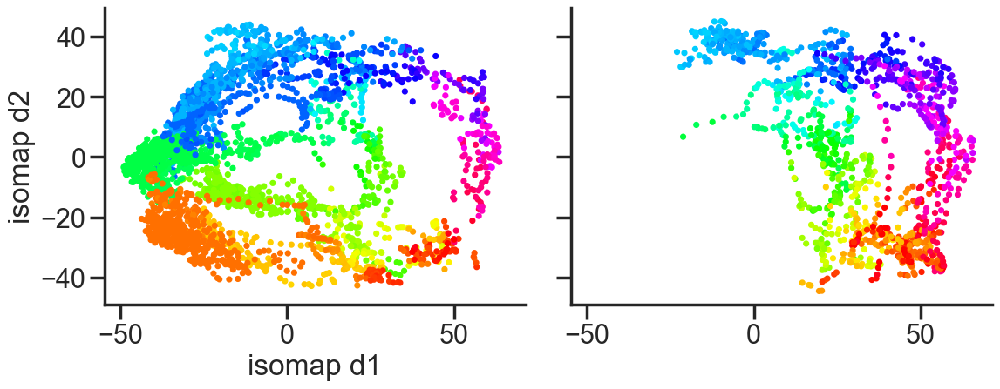

20220419_JA0164_dark1


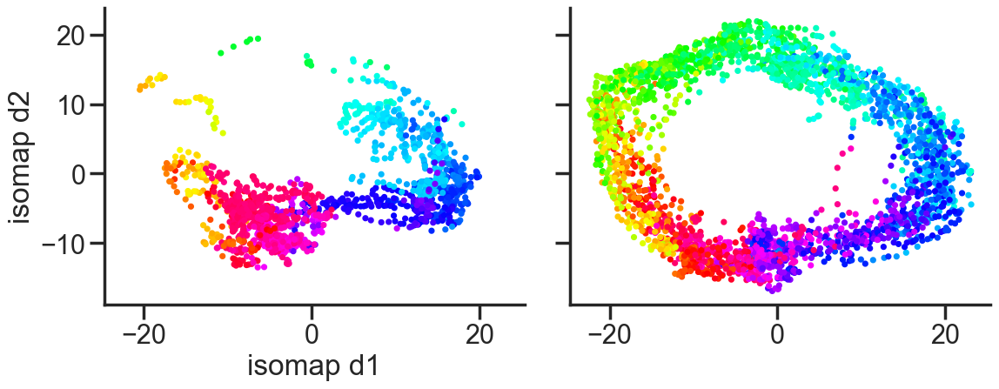

20220419_JA0164_darkHR1


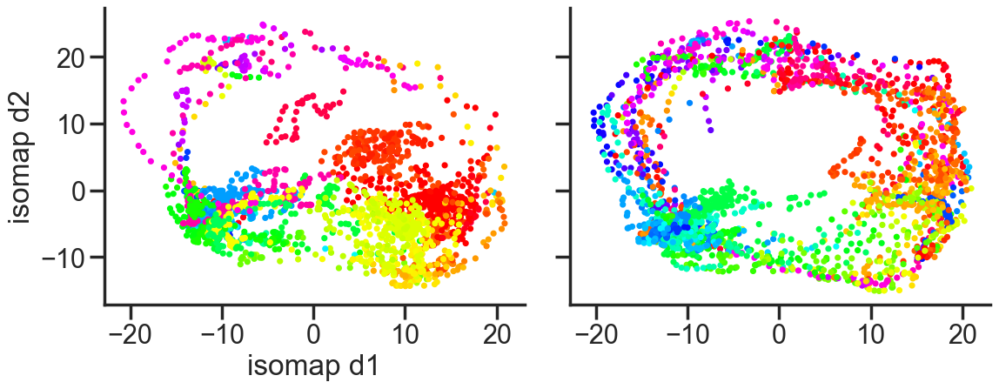

20220419_JA0164_light1


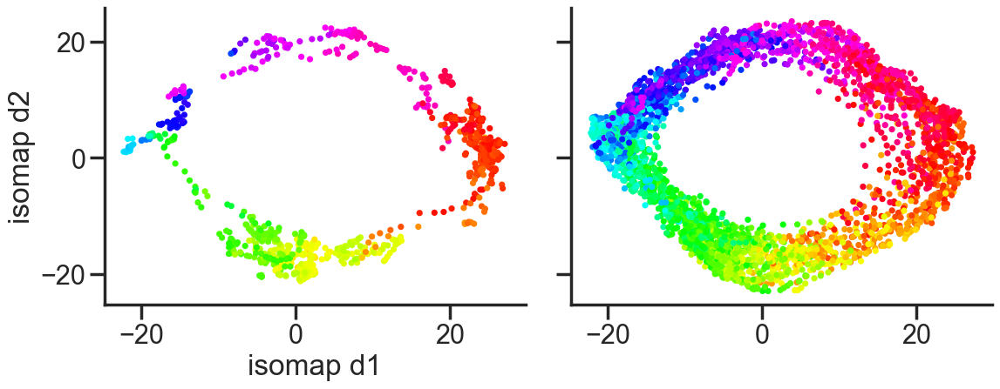

20220419_JA0164_lightHR1


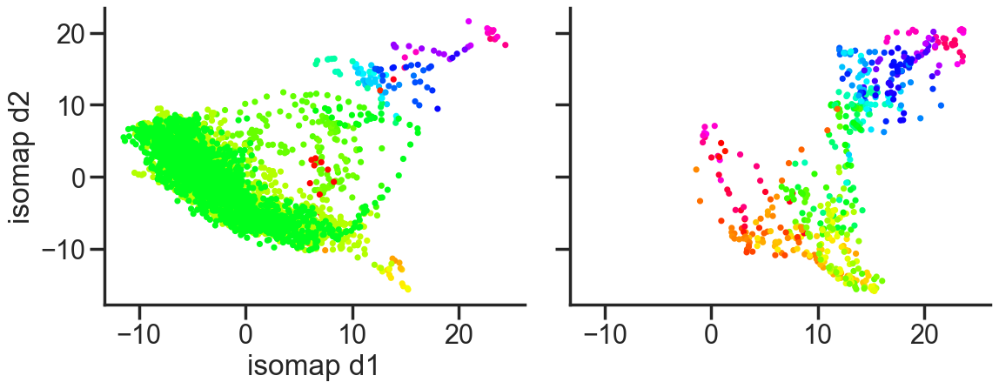

20220426_JA0164_dark1


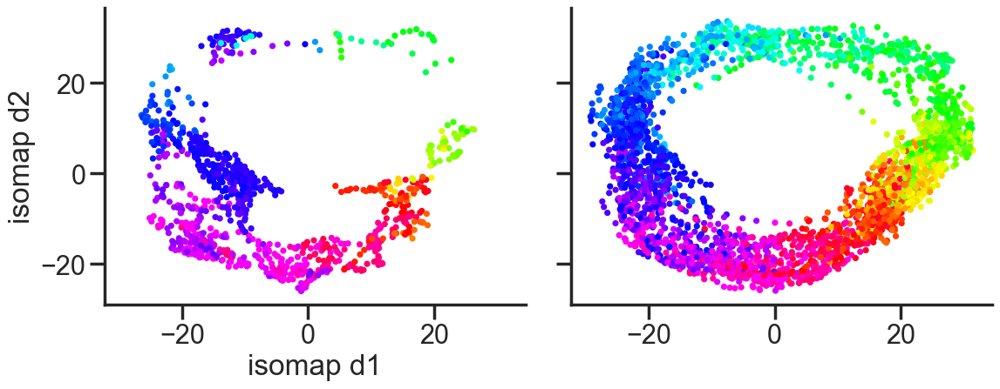

20220426_JA0164_darkHR1


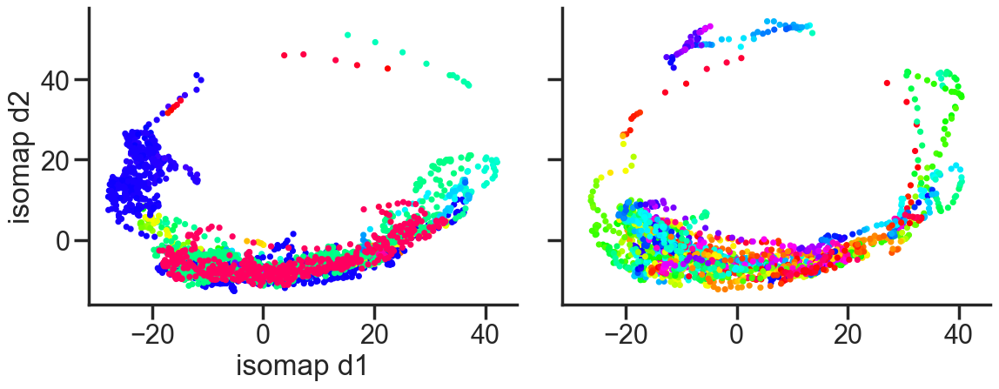

20220426_JA0164_light1


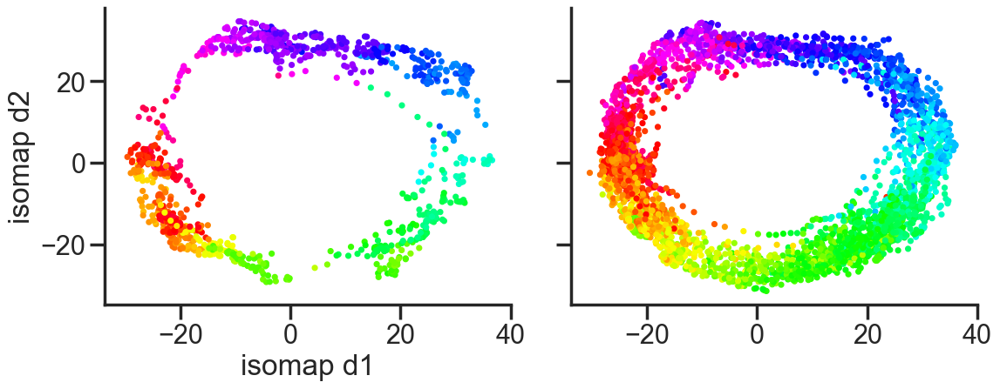

20220426_JA0164_lightHR1


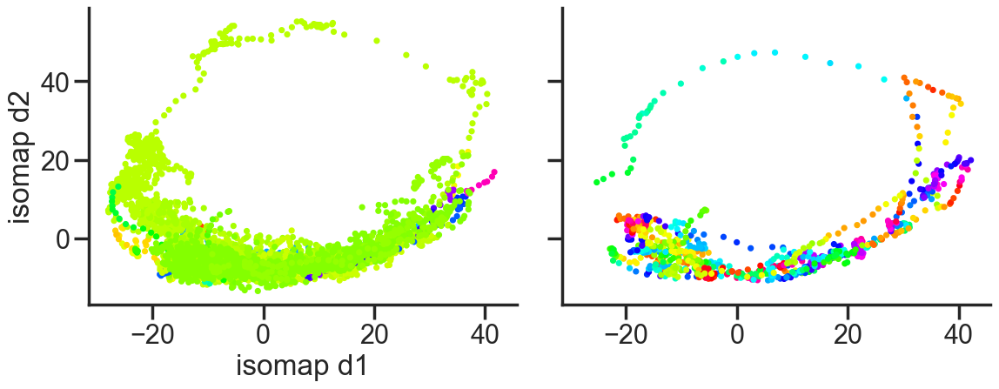

In [616]:
ls = []
data = df_hr_emball
for rec in data.rec_id.unique():

    f, ax = plt.subplots(1, 2, figsize = (12, 5), sharex  = True, sharey = True)
    
    tmp = data[(data.rec_id == rec) 
#                & (data.condition == con)
              ]

    print(f'{rec}')
    
    time_s = np.arange(0, tmp.shape[0]/50, 0.02)
    start, end = 0, 1800
    yaw = tmp['yaw'].values
    speed = tmp['vel'].values
    try:
        stat_idx, locom_idx = get_stat_run_epochs(speed, window_size=5, speed_thr = 4)
    except Exception as e:
        print (e)
        continue 
#         stat_idx = np.where(speed < 4)[0]
#         locom_idx = np.where(speed > 4)[0]
    x = tmp.emb_x.values
    y = tmp.emb_y.values
#             yaw_dec = np.arctan2(x, y)*180/np.pi

#             offset = ((yaw[:500] - yaw_dec[:500]) + 180)%360 - 180
#             yaw_dec = (yaw_dec + np.mean(offset) + 180)%360 - 180
#             offset = ((yaw[:500] - yaw_dec[:500]) + 180)%360 - 180

#             if np.mean(abs(offset)) > 60:
#                 yaw_dec = np.arctan2(y, x)*180/np.pi
#                 offset = ((yaw[:500] - yaw_dec[:500]) + 180)%360 - 180
#                 yaw_dec = (yaw_dec + np.mean(offset) + 180)%360 - 180
#                 offset = ((yaw[:500] - yaw_dec[:500]) + 180)%360 - 180
#             print(np.mean(abs(offset)), np.std(offset))
#             tmp.loc[:,'yaw_dec'] = yaw_dec
#         ls.append(tmp)
    p1 = ax[0].scatter(x[stat_idx] , y[stat_idx], c = yaw[stat_idx], s = 10, vmin = -180, vmax = 180, cmap = 'hsv')
    p = ax[1].scatter(x[locom_idx] , y[locom_idx], c = yaw[locom_idx], s = 10, vmin = -180, vmax = 180, cmap = 'hsv')
#             ax[0].plot(x, y, alpha = 0.5)
#         f.colorbar(p)
    ax[0].set_xlabel('isomap d1')
    ax[0].set_ylabel('isomap d2')
#         ax[1].plot(time_s[:], yaw[:], '.' , alpha = 0.5)
#         ax[1].plot(time_s[:], speed[:], '.' , alpha = 0.5)
#             ax[1].plot(time_s[:200], yaw_dec[:200], '.', color = 'crimson', alpha = 0.5)
#         ax[1].set_xlabel('Time (s)')
#         ax[1].set_ylabel('Az (deg)')
#         ax[0].set_xlim(-15, 15)
#         ax[0].set_ylim(-15, 15)
    plt.tight_layout()
    plt.show()
        
    
    
            # ax[2].plot(speed)
# df_arena_emb = pd.concat(ls)
    

In [1047]:
df_arena_emb.loc[:, 'isomap_err'] = abs(((df_arena_emb.yaw - df_arena_emb.yaw_dec) + 180)%360 - 180)
dyaw = np.diff(df_arena_emb.yaw_dec, 1)
dyaw[np.abs(dyaw) > 180] = 0
omega_dec = savgol_filter(dyaw, window_length=31, polyorder=2)
# data downsampled to 5 Hz
omega_dec *= 1/0.2
omega_dec = np.insert(omega_dec, 0, 0)
df_arena_emb.loc[:, 'ahv_dec'] = omega_dec

dyaw = np.diff(df_arena_emb.yaw, 1)
dyaw[np.abs(dyaw) > 180] = 0
omega = savgol_filter(dyaw, window_length=31, polyorder=2)
# data downsampled to 5 Hz
omega *= 1/0.2
omega = np.insert(omega, 0, 0)
df_arena_emb.loc[:, 'ahv'] = omega

df_arena_emb.loc[:, 'omega_dec_err'] = abs((df_arena_emb.ahv - df_arena_emb.ahv_dec))

In [1046]:
y = df_arena.omega.values
y[y< 0].mean()

-29.33108832199879

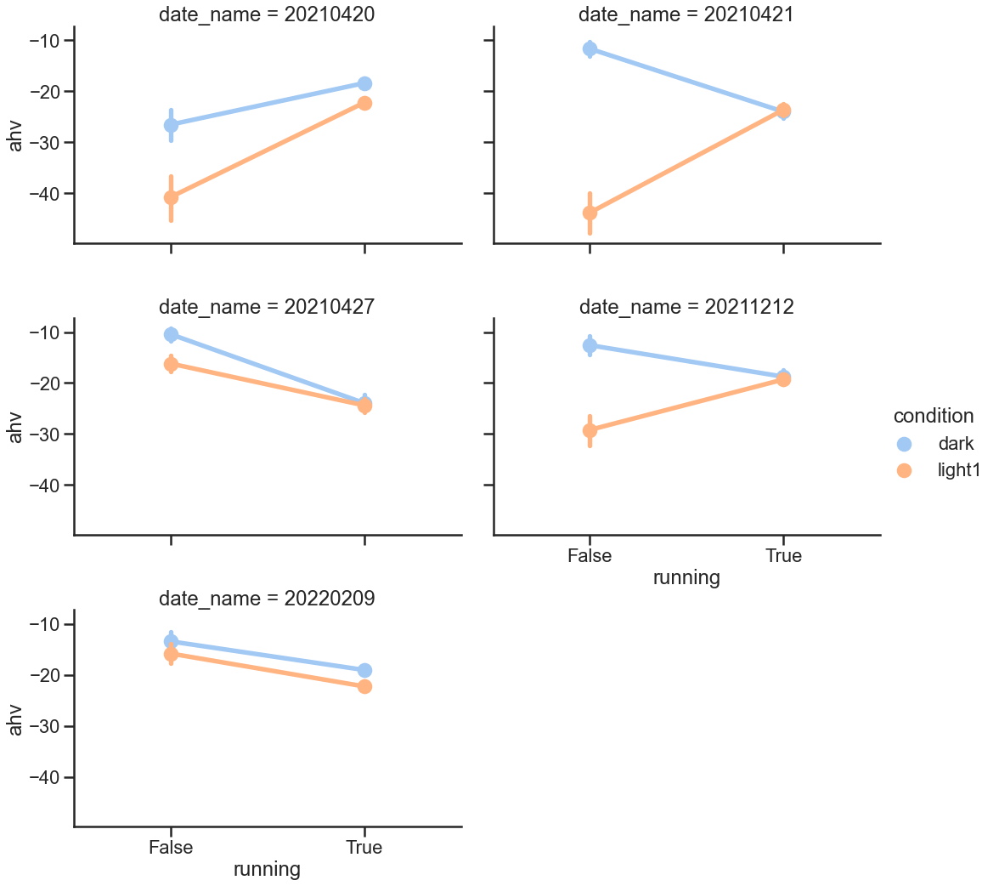

In [1055]:
g = sns.catplot(x = 'running', y = 'ahv', data = df_arena_emb[df_arena_emb.ahv < 0], 
               kind = 'point', hue = 'condition', hue_order = ['dark', 'light1'],
            col = 'date_name', col_wrap =2, 
                aspect = 1.5, height = 5)

In [277]:
path = r'y:\Users\Alex\Data Analysis\VR1 ATN data\Processed_paper\df_hr_tuning.pkl'
df_hr_tuning_1 = pd.read_pickle(path)
df_hr_tuning_1.head()

,animal_name,cids,date_name,is_sua,acronym,bm,hdc_flag,session_name,site,r,p_val,tuning,x_tuning,condition,rec_id,hd_model
0,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,31.002028,3.0,dark1,20211212_JA0164_dark1,False
1,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,26.494761,23.0,dark1,20211212_JA0164_dark1,False
2,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,29.836700,43.0,dark1,20211212_JA0164_dark1,False
3,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,25.480159,63.0,dark1,20211212_JA0164_dark1,False
4,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,31.546377,83.0,dark1,20211212_JA0164_dark1,False


In [226]:
path = r'y:\Users\Alex\Data Analysis\VR1 ATN data\Processed_paper\df_hr_emb.pkl'
df_hr_emb_1 = pd.read_pickle(path)
df_hr_emb_1.head()

,yaw,emb_x,emb_y,n_hdc,animal_name,rec_id,condition,date_name,vel,lfp,omega
0,-132.0,-3.562200,2.672058,8,JA0144,20211212_JA0144_dark1,dark1,20211212,26.020397,-68.481042,-100.000000
1,-132.0,-3.892764,3.567231,8,JA0144,20211212_JA0144_dark1,dark1,20211212,26.612860,246.329354,-123.333333
2,-149.0,-1.022538,6.088342,8,JA0144,20211212_JA0144_dark1,dark1,20211212,26.092196,-109.265273,-126.250000
3,-176.0,-0.436794,6.084237,8,JA0144,20211212_JA0144_dark1,dark1,20211212,26.521818,24.659558,-188.157895
4,169.0,0.230685,6.732634,8,JA0144,20211212_JA0144_dark1,dark1,20211212,22.325342,59.105509,-155.263158


In [278]:
df_hr_tuning_1['rec_id'] = df_hr_tuning_1['date_name'] + '_' + df_hr_tuning_1['animal_name'] + '_' + df_hr_tuning_1['condition']
df_hr_tuning_1['cuid'] = df_hr_tuning_1['cids'].astype(str) + '_' + df_hr_tuning_1['rec_id']

In [279]:
df_hr_tuning = pd.concat([df_hr_tuning_1, df_hr_tuning_2])
df_hr_tuning.head()

,animal_name,cids,date_name,is_sua,acronym,bm,hdc_flag,session_name,site,r,p_val,tuning,x_tuning,condition,rec_id,hd_model,cuid,depth
0,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,31.002028,3.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
1,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,26.494761,23.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
2,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,29.836700,43.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
3,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,25.480159,63.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN
4,JA0144,0.0,20211212,1.0,NaN,0.0,False,001,88,0.082941,0.656,31.546377,83.0,dark1,20211212_JA0144_dark1,False,0.0_20211212_JA0144_dark1,NaN


In [282]:
# df_hr_tuning.to_pickle('df_hr_tuning_master.pkl')

In [286]:
ls_pref = []
for k in d_hr_data.keys():
    tmp_df = d_hr_data[k]['tuning']
    _inp = tmp_df[(tmp_df.rec_id == k) & (tmp_df.hdc_flag == True)]
    idx = _inp.groupby([ 'rec_id', 'cuid'])['tuning'].transform(max) == _inp['tuning']
    tmp_df_pref = _inp[idx][['condition', 'rec_id', 'cids', 'x_tuning', 'tuning']]
    ls_pref.append(tmp_df_pref)
df_pref = pd.concat(ls_pref)
df_pref.head()

,condition,rec_id,cids,x_tuning,tuning
15,dark1,20211207_JA0144_dark1,25.0,303.0,2.448795
6,dark1,20211207_JA0144_dark1,51.0,123.0,6.371094
11,dark1,20211207_JA0144_dark1,62.0,223.0,46.792631
11,dark1,20211207_JA0144_dark1,66.0,223.0,15.837189
11,dark1,20211207_JA0144_dark1,67.0,223.0,2.114824


20220822_JA0178_lightHR1
20220822_JA0178_lightHR1, ep idx: 36
len 465, mean: 84.08389199676547 std: 4.45, idx: 2435 - 2685
(6, 3480) (20, 250)
pear r HDC@pref 0.9265108612926711 HDC @ non-pref -0.351001646883953

rand pref HDC 0.43291623992134837


meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped


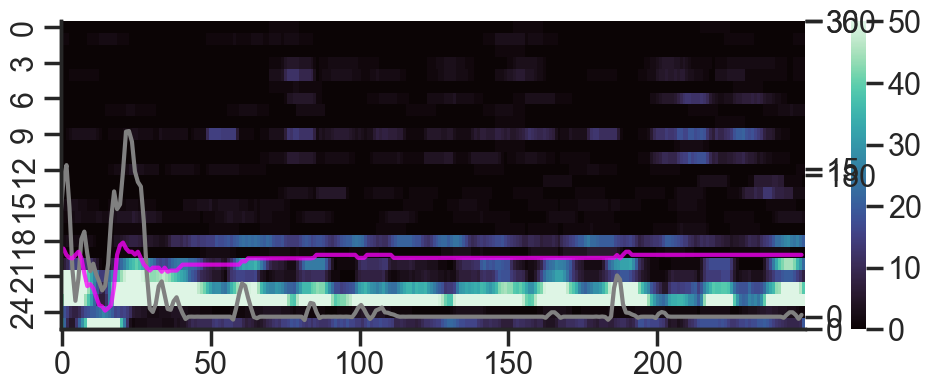

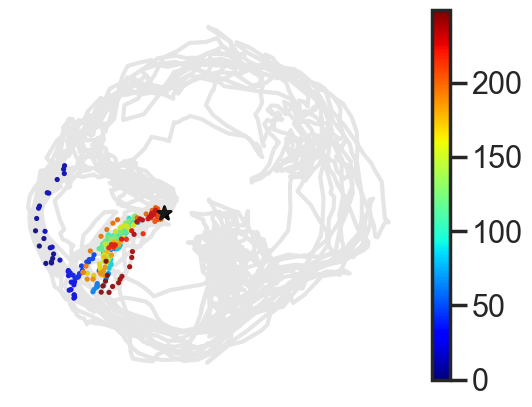

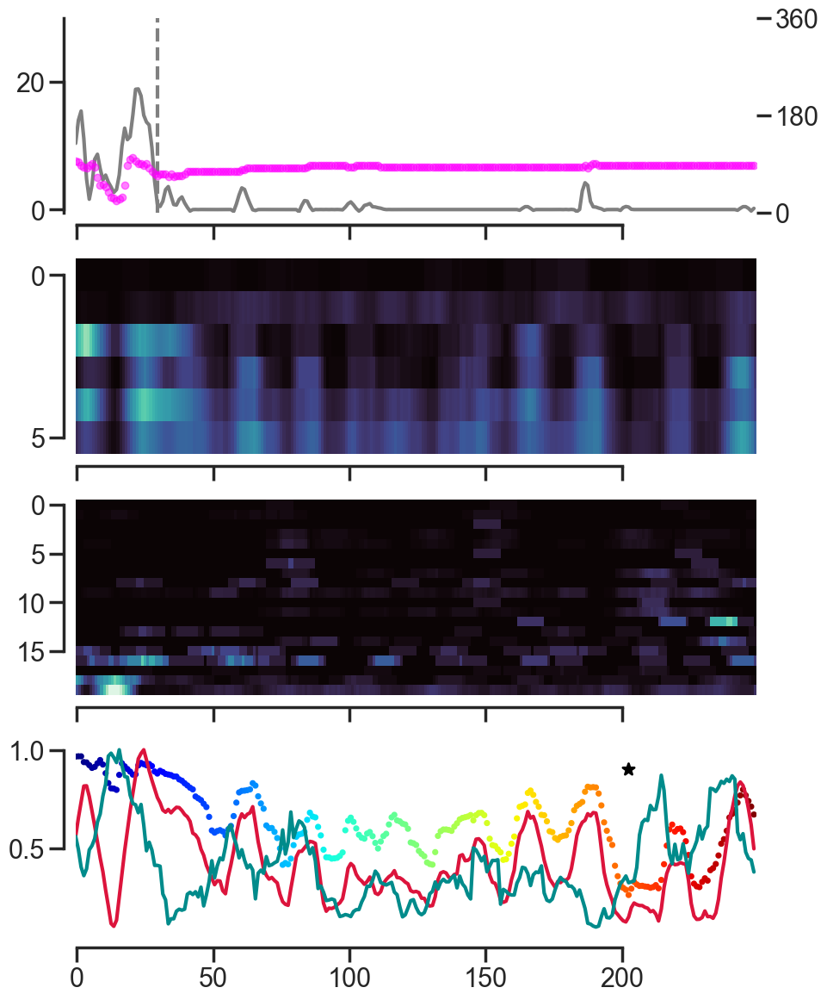

In [382]:
ls_pref, ls_nonpref, ls_rand = [], [], []
ls_df = []
ep_idx = 0
ep_offset = 30
to_plot = True
# 25s
ep_end = 250
pref_dir_thr = 45

for k in d_hr_data.keys():
    if '20220822_JA0178_lightHR1' not in k:
        continue
    print(k)
    tmp_ephys = d_hr_data[k]['ephys']
    tmp_beh = d_hr_data[k]['beh']
    dts, animal_name, cond = k.split('_')[-3:]
#     sess_hdc = tmp_ephys[tmp_ephys.hdc_flag == True].cids.unique()
    sess_hdc = df_pref[df_pref.rec_id == k].cids.unique()
    if sess_hdc.size < 10:
        continue
#     sh = d_good_shanks[implant]
#     tmp_hist = df_hist_master[(df_hist_master.mouse_id == mouse_id) 
#            & (df_hist_master.dts == dts)
#            & (df_hist_master.group != 'noise')
#           & (df_hist_master.shank.isin(sh))]
#     units_in = tmp_hist.id.unique()
#     sess_hdc = tmp_hist[tmp_hist.hdc == 1].id.values
#     print(tmp.rec_id.values[0])
    
    measured_yaw = tmp_beh['yaw'].values[::5]
    if np.min(measured_yaw) < 0:
        measured_yaw = measured_yaw + 180
    lin_speed = tmp_beh['lin_vel'].values[::5]
    
    emb_x, emb_y = d_hr_emb[k]['isomap'][:,0], d_hr_emb[k]['isomap'][:,1]
    stat_idx, run_idx = get_stat_run_epochs(lin_speed, window_size=5, speed_thr = 5)
    # get stat epochs
    stat_epoch = consecutive(stat_idx)

    # compute off manifold ratios
    _, rad_manifold = compute_radius(emb_x, emb_y)
#     rad_manifold = tmp_df['rad_manifold'].values
    rad_manifold_norm = rad_manifold/rad_manifold.max()

    # find hdc ids for this rec
    hdc_units = df_pref[df_pref.rec_id == k].cids.values
    pref_dir = df_pref[df_pref.rec_id == k].x_tuning.values
    sorted_pref_dir = np.argsort(pref_dir)
    tmp_ephys_sel = tmp_ephys[tmp_ephys.cids.isin(sess_hdc)]
    offman_ep_flag = False
    
    for ep_idx, ep in enumerate(stat_epoch):
        # at least 3s and no change in az
        if (len(ep) > 30):
            start, end = ep[0] - ep_offset, ep[:][-1]+1
            if start < 0:
                start = 0
            if ep.size > 250:
                end = start + 250
            if rad_manifold_norm[ep[:ep_end]].min() < 0.5:
                offman_ep_flag = True
            else:
                continue
            if ep_idx != 36:
                continue
                
            angles = np.deg2rad(measured_yaw[ep[:ep_end]])
            circmean = stats.circmean(angles)
            circstd = stats.circstd(angles)
            circstd = np.rad2deg(circstd)
            this_yaw = np.rad2deg(circmean)
            if circstd > 5:
                continue
            
            print(f'{k}, ep idx: {ep_idx}')
            print(f'len {len(ep)}, mean: {this_yaw} std: {round(circstd, 2)}, idx: {start} - {end}')
            
            # get hdc preferring this yaw
            pref_idx = ang_diff(pref_dir, this_yaw) <= pref_dir_thr
            non_pref_idx = ang_diff(pref_dir, this_yaw) > pref_dir_thr 
            if sum(pref_idx) < 3:
                continue
    
            _inp = tmp_ephys_sel.pivot(index = 'cids', columns = 'times', values = 'hz').values[:, ::5][:, :]
            _inp_hdc = tmp_ephys_sel[tmp_ephys_sel.cids.isin(hdc_units[pref_idx])].pivot(index = 'cids', 
                                         columns = 'times', values = 'hz').values[:, ::5][:, :]
            _inp_nonhdc = tmp_ephys_sel[tmp_ephys_sel.cids.isin(hdc_units[non_pref_idx])].pivot(index = 'cids', 
                                         columns = 'times', values = 'hz').values[:, ::5][:, :]

            
#             to calculate corrs
            _inp_norm = _inp[:, ep[:ep_end]]/_inp.max(axis = 1)[:,np.newaxis]
            _inp_hdc_norm = _inp_hdc[:, ep[:ep_end]]/_inp_hdc.max(axis = 1)[:,np.newaxis]
            _inp_nonhdc_norm = _inp_nonhdc[:, ep[:ep_end]]/_inp_nonhdc.max(axis = 1)[:,np.newaxis]
            
            _inp_nonhdc_norm[np.isnan(_inp_nonhdc_norm)] = 0
            
            offset = rad_manifold_norm[start:end].argmin()
            print(_inp_hdc.shape, _inp_nonhdc_norm.shape)
            hdc_vec = _inp_hdc_norm.sum(axis = 0)
            hdc_gain = hdc_vec/hdc_vec.max()
            nonhdc_vec = _inp_nonhdc_norm.sum(axis = 0)
            nonhdc_gain = nonhdc_vec/nonhdc_vec.max()
            
            r_hdc, pval = (stats.pearsonr(rad_manifold_norm[ep[:ep_end]], hdc_gain))
            r_nonhdc, pval = (stats.pearsonr(rad_manifold_norm[ep[:ep_end]], nonhdc_gain))
            print(f'pear r HDC@pref {r_hdc} HDC @ non-pref {r_nonhdc}')
            
            print()
            # shuffled population
            ls_rand = []
            for i in range(20):
                rand_n = np.random.randint(3, hdc_units.size//2)
                rand_units = np.random.choice(hdc_units, size = rand_n)
                _inp_rand = tmp_ephys_sel[tmp_ephys_sel.cids.isin(rand_units)].pivot(index = 'cids', 
                                                             columns = 'times', values = 'hz').values[:, ::5][:, :]
                _inp_rand_norm = _inp_rand[:, ep[:ep_end]]/_inp_rand.max(axis = 1)[:,np.newaxis]
                if np.sum(_inp_rand_norm) < 1:
                    continue
                rand_vec = _inp_rand_norm.sum(axis = 0)
                rand_gain = rand_vec/rand_vec.max()
                r_rand, pval = stats.pearsonr(rad_manifold_norm[ep[:ep_end]], rand_gain)
                ls_rand.append(r_rand)
            print(f'rand pref HDC {np.mean(ls_rand)}')
            

            if to_plot:
                # to plot
                _inp_norm = _inp[:, start:end]/_inp.max(axis = 1)[:,np.newaxis]
                _inp_hdc_norm = _inp_hdc[:, start:end]/_inp_hdc.max(axis = 1)[:,np.newaxis]
                _inp_nonhdc_norm = _inp_nonhdc[:, start:end]/_inp_nonhdc.max(axis = 1)[:,np.newaxis]
                hdc_vec = _inp_hdc_norm.sum(axis = 0)
                hdc_gain = hdc_vec/hdc_vec.max()
                nonhdc_vec = _inp_nonhdc_norm.sum(axis = 0)
                nonhdc_gain = nonhdc_vec/nonhdc_vec.max()

                f, ax = plt.subplots(1, figsize = (12, 4))
                sns.heatmap(_inp[(sorted_pref_dir[::-1]), start:end], cmap = 'mako', xticklabels=50, vmax = 50)
                ax_1 = ax.twinx()
                ax_1.plot( lin_speed[start:end],  color = 'gray', label = 'lin speed', alpha = 1)
                ax_1.set_yticks([0, 15, 30])
                ax_2 = ax.twinx()
                ax_2.plot( measured_yaw[start:end],  color = 'magenta', label = 'yaw', alpha = 0.75)
                ax_2.set_yticks([0, 180, 360])

                f, ax = plt.subplots()
                x_tmp, y_tmp = emb_x[start:end], emb_y[start:end]
                u = np.diff(x_tmp)
                v = np.diff(y_tmp)
                pos_x = x_tmp[:-1] + u/2
                pos_y = y_tmp[:-1] + v/2
                norm = np.sqrt(u**2+v**2) 
                plt.plot(emb_x, emb_y, c = 'gray', alpha = 0.2)
    #             plt.scatter(x_tmp[:], y_tmp[:], alpha = 1, s = 10,  c = x_time, cmap = 'afmhot', vmax = 400)
    #             plt.colorbar()
                plt.scatter(x_tmp[:], y_tmp[:], alpha = 1, s = 3,  c = np.arange(0, end - start)[:], 
                            cmap = 'jet')

                plt.colorbar()
    #             plt.quiver(pos_x[::10], pos_y[::10], (u/norm)[::10], (v/norm)[::10], angles="xy", 
    #                        zorder=5, pivot="mid", alpha = 0.5 )
                plt.scatter(emb_x[start + offset], emb_y[start + offset], c = 'k', s = 100, marker = "*")
                plt.axis('off')
#                 plt.show()
                plt.savefig(f'scatter_isomap-traj_{k}_{ep[0]}.pdf', transparent = True)

                f, ax = plt.subplots(4, figsize = (10, 12), sharex = 'col')
                x_time = np.arange(0, end - start)
                sorted_idx = np.argsort(pref_dir[pref_idx])
                sns.heatmap(_inp_hdc_norm[sorted_idx[::-1]], cmap = 'mako', xticklabels = 50,
                            yticklabels = 5, vmin = 0, vmax = 1, ax  = ax[1], cbar = False
    #                         cbar_kws = dict(use_gridspec=False, location = "top")
                           )
                sorted_idx = np.argsort(pref_dir[non_pref_idx])
                sns.heatmap(_inp_nonhdc_norm[sorted_idx[::-1]], cmap = 'mako', xticklabels = 50,
                            yticklabels = 5, vmin = 0, vmax = 0.5, ax  = ax[2], cbar = False)

                ax[3].scatter( x_time, rad_manifold_norm[start:end], s = 10, label = 'iso rad',  
                              c = x_time, cmap = 'jet')
                ax[3].plot( hdc_gain, label = 'hdc gain', c = 'crimson')
                ax[3].plot( nonhdc_gain, label = 'non-hdc gain', c = 'darkcyan')
                ax[3].scatter(x = offset, y = 0.9, c = 'k', s = 100, marker = "*")

                ax[0].plot( lin_speed[start:end],  color = 'k', label = 'lin speed', alpha = 0.5)
                ax[0].axvline(x = ep_offset, c = 'gray', ls = '--')
                ax[0].set_ylim(-0.5, 30)
                ax_2 = ax[0].twinx()
                ax_2.plot( measured_yaw[start:end], '.', color = 'magenta', label = 'yaw', alpha = 0.5)
                ax_2.set_yticks([0, 180, 360])

    #             f.legend(loc='outside upper right')
                f.tight_layout()
                sns.despine(offset = 10, trim = True)
#                 plt.show()
#             break
                plt.savefig(f'heatmap_hdc-gain_{k}_{ep[0]}.pdf', transparent = True)
                time.sleep(0.2)

#             df_tmp = pd.DataFrame({ 
#             'dts': dts, 'animal_name': animal_name, 'rec_session': rec_session, 'cond': cond, 'rec_id':k,'ep_idx': ep_idx,
# #             'rad_manifold_ep':rad_manifold_norm[ep], 'hdc_pop': hdc_vec[ep_offset:], 'nonhdc_pop': nonhdc_vec[ep_offset:],
#             'r_hdc': r_hdc, 'r_nonhdc': r_nonhdc, 'r_rand': r_rand, 
#                 'offman_ep_flag': offman_ep_flag, 'min_rad' :rad_manifold_norm[ep].min() 
# #                 'emb_x':emb_x[ep] , 'emb_y':emb_y[ep],  'ep': ep, 
#                               }, index = [0])
#             ls_df.append(df_tmp)
              

#     break
# df_hr_mandyn = pd.concat(ls_df)
# df_hr_mandyn.head()

In [347]:
df_hr_mandyn.groupby('animal_name').count()

,dts,rec_session,cond,rec_id,ep_idx,r_hdc,r_nonhdc,r_rand,offman_ep_flag,min_rad
animal_name,,,,,,,,,,
JA0153,6,6,6,6,6,6,6,6,6,6
JA0164,1,1,1,1,1,1,1,1,1,1
JA0178,6,6,6,6,6,6,6,6,6,6
JA0181,8,8,8,8,8,8,8,8,8,8
MC022,6,6,6,6,6,6,6,6,6,6


meta NOT subset; don't know how to subset; dropped


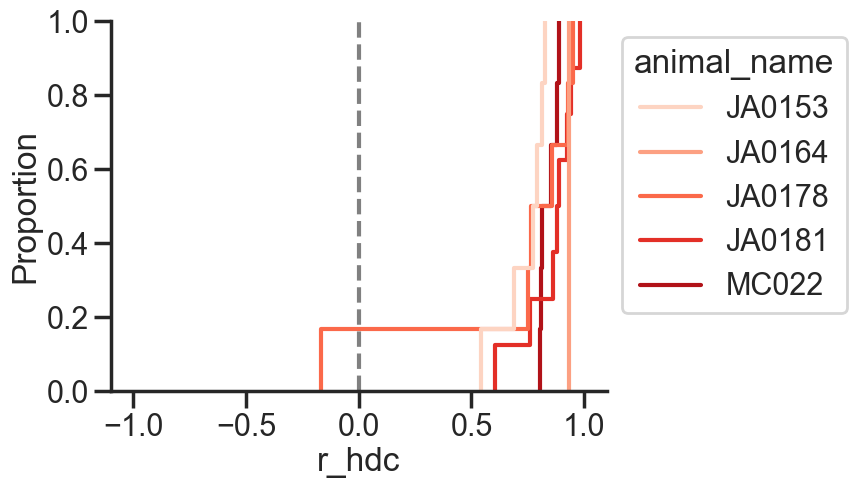

In [378]:
y = 'r_hdc'
_inp_plot = df_hr_mandyn[df_hr_mandyn.offman_ep_flag == True].groupby(['animal_name', 
                                                     'rec_id', 'ep_idx']).max().reset_index()
plt.axvline(x = 0, color = 'gray', ls = '--')

g = sns.ecdfplot(data = _inp_plot, x = y, hue = "animal_name", palette = 'Reds')
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

# y = 'r_nonhdc'
# g = sns.ecdfplot(data = _inp_plot, x = y, hue = "animal_name", palette = 'GnBu')
# sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

# y = 'r_rand'
# g = sns.ecdfplot(data = _inp_plot, x = y, hue = "animal_name", palette = 'Greys')
# sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))
plt.xlim(-1.1, 1.1)
# plt.savefig(f'ecdf_hr_isomap-dyn-by-mouse_{y}.pdf', transparent = True)

meta NOT subset; don't know how to subset; dropped


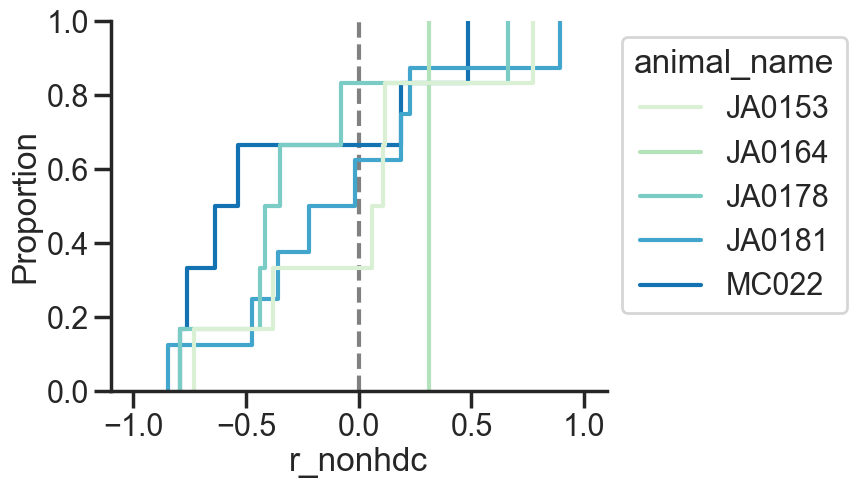

In [377]:
_inp_plot = df_hr_mandyn[df_hr_mandyn.offman_ep_flag == True].groupby(['animal_name', 
                                                     'rec_id', 'ep_idx']).max().reset_index()
plt.axvline(x = 0, color = 'gray', ls = '--')
# y = 'r_hdc'
# g = sns.ecdfplot(data = _inp_plot, x = y, hue = "animal_name", palette = 'Reds')
# sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

y = 'r_nonhdc'
g = sns.ecdfplot(data = _inp_plot, x = y, hue = "animal_name", palette = 'GnBu')
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))
plt.xlim(-1.1, 1.1)
# plt.savefig(f'ecdf_hr_isomap-dyn-by-mouse_{y}.pdf', transparent = True)

meta NOT subset; don't know how to subset; dropped


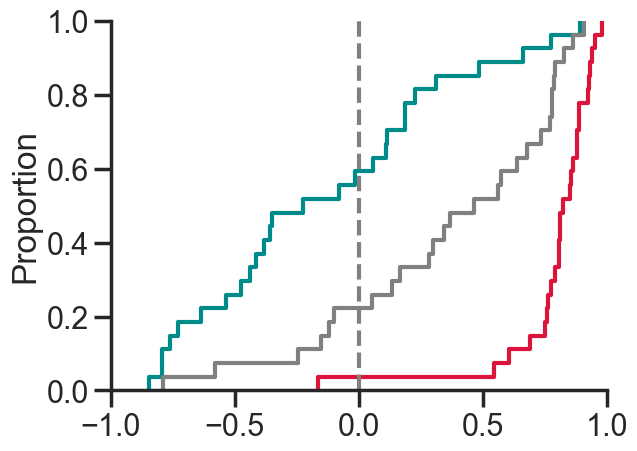

In [376]:
_inp_plot = df_hr_mandyn[df_hr_mandyn.offman_ep_flag == True].groupby(['animal_name', 
                                                                 'rec_id', 'ep_idx']).max().reset_index()

a1 = _inp_plot['r_hdc'].values
b1 = _inp_plot['r_nonhdc'].values
c1 = _inp_plot['r_rand'].values

sns.ecdfplot(a1, color = 'crimson')
sns.ecdfplot(b1, color = 'darkcyan')
sns.ecdfplot(c1, color = 'Gray')
plt.axvline(x = 0, color = 'gray', ls = '--')
plt.xlim(-1, 1)
# plt.savefig(f'ecdf_hr_isomap-dyn_all.pdf', transparent = True)

In [374]:
_inp_plot.describe()

,ep_idx,r_hdc,r_nonhdc,r_rand,min_rad
count,27.000000,27.000000,27.000000,27.000000,27.000000
mean,31.000000,0.790310,-0.141528,0.364097,0.136906
std,21.704307,0.216006,0.503797,0.461861,0.152877
min,1.000000,-0.165210,-0.846589,-0.787551,0.001571
25%,13.000000,0.769677,-0.505146,0.092395,0.016216
50%,27.000000,0.824784,-0.222813,0.462877,0.086596
75%,43.500000,0.888101,0.187982,0.773663,0.179949
max,81.000000,0.979632,0.892424,0.908565,0.470068


In [375]:
print('r hdc vs nonhdc')
print(stats.ks_2samp(a1, b1))
print('r hdc vs rand')
print(stats.ks_2samp(a1, c1))
print('r rand vs nonhdc')
print(stats.ks_2samp(b1, c1))

r hdc vs nonhdc
KstestResult(statistic=0.8518518518518519, pvalue=3.248698915167573e-10)
r hdc vs rand
KstestResult(statistic=0.5555555555555556, pvalue=0.00035235496723871337)
r rand vs nonhdc
KstestResult(statistic=0.48148148148148145, pvalue=0.00333382007458774)


In [385]:
import ghostipy as gsp

In [384]:
path = r'y:\Users\Alex\Data Analysis\VR1 ATN data\Processed_paper\df_hr_tf.pkl'
df_hr_tf = pd.read_pickle(path)
df_hr_tf.head()

FileNotFoundError: [Errno 2] No such file or directory: 'y:\\Users\\Alex\\Data Analysis\\VR1 ATN data\\Processed_paper\\df_hr_tf.pkl'

In [160]:
df_hr_master_2['rec_session'] = df_hr_master_2['animal_name'] + '_' + df_hr_master_2['date_name']
df_hr_master_2.head()

,animal_name,cids,date_name,is_sua,depth,cuid,session_name,site,rec_id,condition,hz,times,yaw,lfp,omega,vel,hdc_flag,rec_session
0,JA0178,1.0,20220819,0.0,742.0,1.0_20220819_JA0178_dark1,,239,20220819_JA0178_dark1,dark1,0.0,0.00,140.206927,0.0,17.507949,9.286662,False,JA0178_20220819
1,JA0178,1.0,20220819,0.0,742.0,1.0_20220819_JA0178_dark1,,239,20220819_JA0178_dark1,dark1,0.0,0.02,140.206927,-97.0,18.163893,10.613187,False,JA0178_20220819
2,JA0178,1.0,20220819,0.0,742.0,1.0_20220819_JA0178_dark1,,239,20220819_JA0178_dark1,dark1,0.0,0.04,140.206927,-30.0,16.766670,9.085629,False,JA0178_20220819
3,JA0178,1.0,20220819,0.0,742.0,1.0_20220819_JA0178_dark1,,239,20220819_JA0178_dark1,dark1,0.0,0.06,140.206927,99.0,15.569051,8.962052,False,JA0178_20220819
4,JA0178,1.0,20220819,0.0,742.0,1.0_20220819_JA0178_dark1,,239,20220819_JA0178_dark1,dark1,0.0,0.08,140.206927,153.0,14.531114,9.849319,False,JA0178_20220819


In [161]:
df_hr_master_2.head()

,animal_name,cids,date_name,is_sua,depth,cuid,session_name,site,rec_id,condition,hz,times,yaw,lfp,omega,vel,hdc_flag,rec_session
0,JA0178,1.0,20220819,0.0,742.0,1.0_20220819_JA0178_dark1,,239,20220819_JA0178_dark1,dark1,0.0,0.00,140.206927,0.0,17.507949,9.286662,False,JA0178_20220819
1,JA0178,1.0,20220819,0.0,742.0,1.0_20220819_JA0178_dark1,,239,20220819_JA0178_dark1,dark1,0.0,0.02,140.206927,-97.0,18.163893,10.613187,False,JA0178_20220819
2,JA0178,1.0,20220819,0.0,742.0,1.0_20220819_JA0178_dark1,,239,20220819_JA0178_dark1,dark1,0.0,0.04,140.206927,-30.0,16.766670,9.085629,False,JA0178_20220819
3,JA0178,1.0,20220819,0.0,742.0,1.0_20220819_JA0178_dark1,,239,20220819_JA0178_dark1,dark1,0.0,0.06,140.206927,99.0,15.569051,8.962052,False,JA0178_20220819
4,JA0178,1.0,20220819,0.0,742.0,1.0_20220819_JA0178_dark1,,239,20220819_JA0178_dark1,dark1,0.0,0.08,140.206927,153.0,14.531114,9.849319,False,JA0178_20220819


In [439]:
good_sess, 

['JA0144_20211212',
 'JA0153_20220209',
 'JA0162_20220302',
 'JA0164_20220419',
 'MC022_12',
 'JA0178_20220819',
 'JA0181_20220812',
 'JA0181_20220815',
 'JA0181_20220818',
 'JA153_26']

In [386]:
freq_bands = {'theta': (4, 12), 'beta': (15, 30), 
              'low_gamma': (30, 60), 'high_gamma': (60, 100)} 


In [388]:
# fs_lfp = 50
# gamma = 3 
# beta = 10 # decrease beta to improve temporal resolution
# # Zoom in on a particular window of time

# for rec in data_inp.rec_id.unique():
#     print(rec)
#     data_tmp = data_inp[(data_inp.rec_id == rec)]
#     lfp = data_inp.groupby('times')['lfp'].mean().values
#     lfp_ts = data_inp.groupby('times')['lfp'].mean().index.values
#     speed = data_inp.groupby('times')['vel'].mean().values
    
#     for i in range(2):
#         t1 = np.random.randint(lfp_ts.max() - 10)
#         t2 = t1 + 4

#         idx = (lfp_ts >= t1) & (lfp_ts <= t2)
#         LFP = lfp[idx]
#         spd = speed[idx]
#         ts = lfp_ts[idx]

#         cwtcoefs, _, freq, cwtts, _ = gsp.cwt(
#             LFP, timestamps=ts, freq_limits=[1, 25], fs=fs_lfp,
#             wavelet=gsp.MorseWavelet(gamma=gamma, beta=beta))

#         cwt_power = cwtcoefs.imag**2 + cwtcoefs.real**2

#         plt.rcParams.update({'axes.spines.right': False, 'axes.spines.top': False})
#         fig, axes = plt.subplots(3, 1, figsize=(6, 6), sharex=True, 
#                                  gridspec_kw={'hspace':0.15, 'height_ratios':[0.2,0.8,0.2]})
#         ax1, ax2, ax3 = axes

#         ax1.plot(ts, spd)
#         ax1.set_ylim(-1, 40)
#         ax1.set_ylabel("Speed\n(cm/s)", labelpad=10)
#         ax1.tick_params(axis='x', which='both', bottom=False, top=False)

#         t_ax, f_ax = np.meshgrid(ts, freq)
#         ax2.pcolormesh(t_ax, f_ax, cwt_power, shading='gouraud', 
#                        cmap=plt.cm.viridis, vmin=0, vmax=1250)

#         ax2.set_ylabel("Frequency (Hz)")
#         ax2.set_ylim(1, 25)
#         ax2.tick_params(axis='x', which='both', bottom=False, top=False)

#         ax3.plot(ts, LFP, 'grey', linewidth=0.5)
#         plt.show()
#         # plt.savefig('../figures/Figure5.pdf', bbox_inches='tight')
#     break

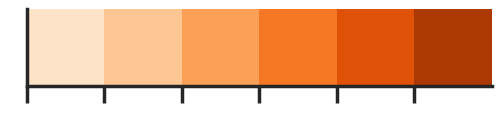

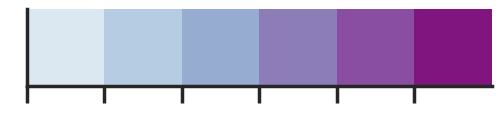

In [387]:
grey_palette = sns.color_palette("Greys")
orange_palette = sns.color_palette("Oranges")
green_palette = sns.color_palette("Greens")
red_palette = sns.color_palette("BuPu")
d_pal = {'light1': orange_palette, 'dark1':grey_palette, 'lightHR1':green_palette, 'darkHR1':red_palette}
sns.palplot(orange_palette[:][:])
sns.palplot(red_palette[:][:])

### Theta vs lin. speed

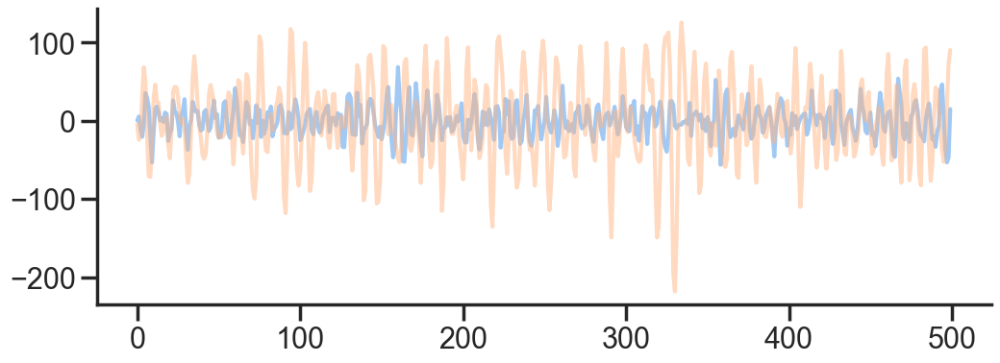

In [434]:
f, ax = plt.subplots(figsize = (12, 4))
plt.plot(med_lfp[:500])
plt.plot(data_inp[data_inp.cids == unit].lfp.values[:500], alpha = 0.5)

In [905]:
from sklearn.linear_model import LinearRegression, HuberRegressor

In [711]:
 dts, animal_name, cond

('20220829', 'MC038', 'light1')

20211207_JA0144_dark1 8
(0, 1) 1550 7.1793647187314695 1.0
(1, 2) 1325 6.25 1.0
(2, 4) 2375 6.25 1.0
(4, 8) 9650 7.1793647187314695 1.0
(8, 17) 8525 7.694652583405727 1.0
(17, 35) 575 8.838834764831844 1.0


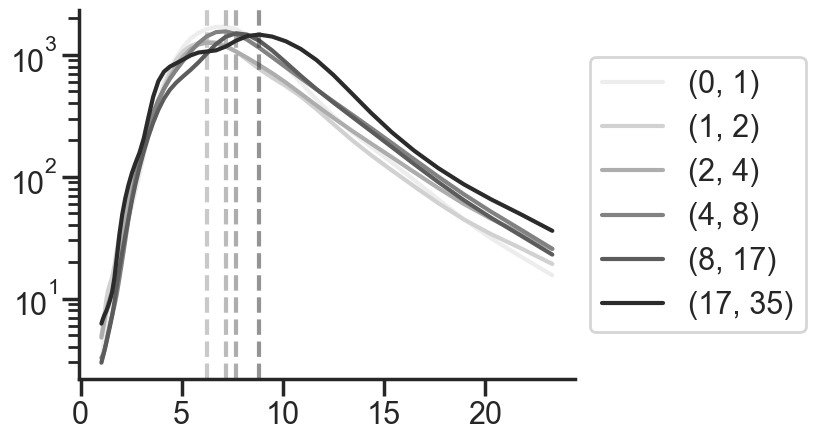

20211207_JA0144_darkHR1 6
(0, 1) 11825 7.1793647187314695 1.0
(1, 2) 725 6.698584140851832 1.0
(2, 4) 750 7.694652583405727 1.0
(4, 8) 1200 7.1793647187314695 1.0
(8, 17) 825 7.1793647187314695 1.0


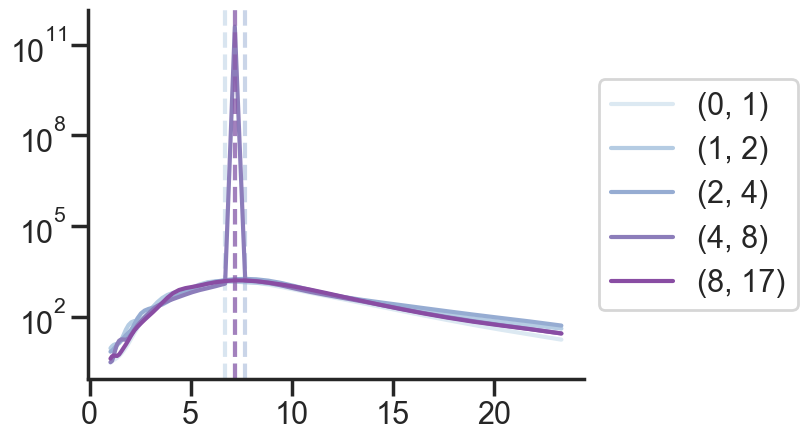

20211207_JA0144_light1 8
(2, 4) 1650 6.698584140851832 1.0
(4, 8) 8400 7.1793647187314695 1.0
(8, 17) 12225 8.246924442330588 1.0
(17, 35) 1175 8.246924442330588 1.0


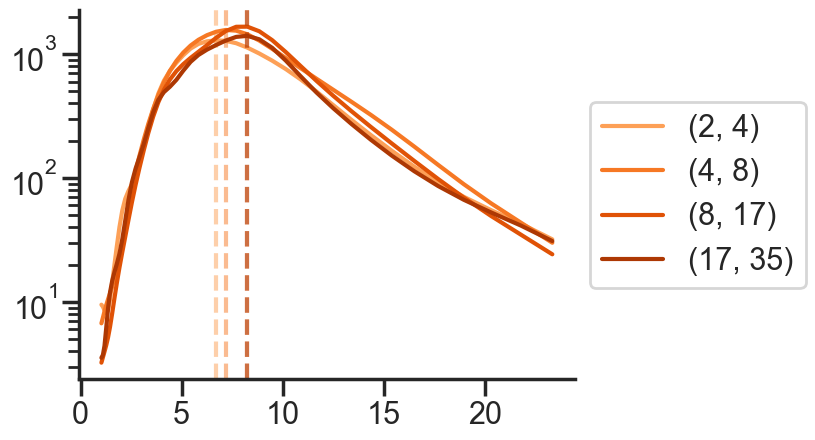

20211207_JA0144_lightHR1 6
(0, 1) 3950 7.694652583405727 1.0
(1, 2) 675 8.246924442330588 1.0
(2, 4) 1325 7.694652583405727 1.0
(4, 8) 2375 8.246924442330588 1.0


C:\Users\lab\AppData\Local\Temp\ipykernel_18196\2647220368.py:51: RuntimeWarning: overflow encountered in square
  cwt_power = cwtcoefs.imag**2 + cwtcoefs.real**2


(8, 17) 2700 7.1793647187314695 nan


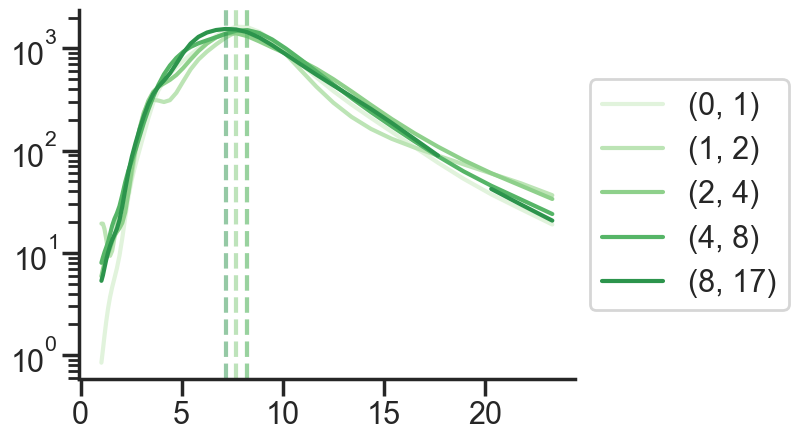

20220126_JA0153_dark1 10
(1, 2) 2825 5.831456197105046 1.0
(2, 4) 3975 6.698584140851832 0.7682243203382811
(4, 8) 5525 11.662912394210093 0.6840907937119317
(8, 17) 9975 11.662912394210093 0.621757040692615
(17, 35) 1375 8.246924442330588 0.6292666389944019


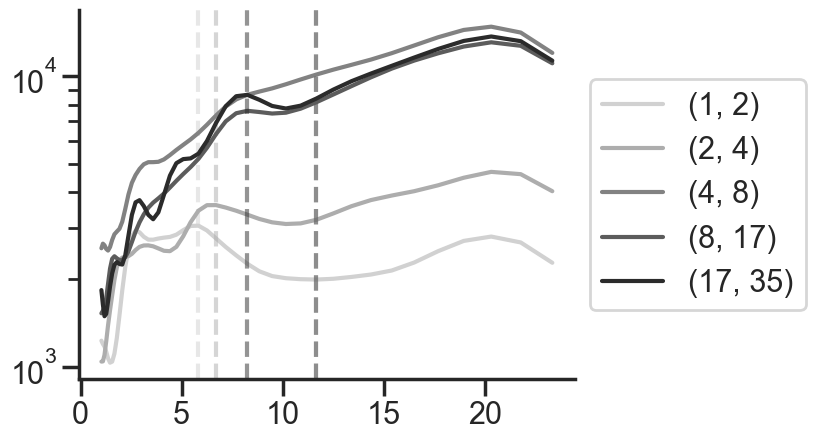

20220126_JA0153_darkHR1 13
(0, 1) 3700 5.440941020600776 0.7334804847491183
(1, 2) 675 6.25 1.0
(2, 4) 1000 6.698584140851832 1.0
(4, 8) 3900 6.698584140851832 0.9952106751832941
(8, 17) 7400 6.698584140851832 0.8743403380757591
(17, 35) 3800 7.1793647187314695 1.0


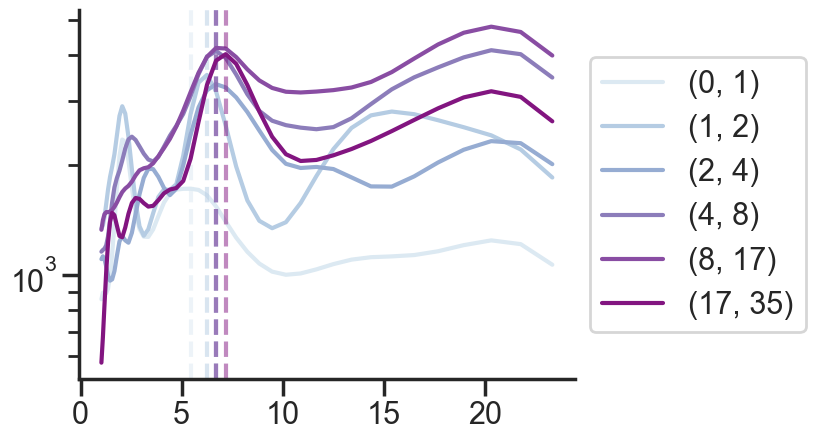

20220126_JA0153_light1 13
(1, 2) 1975 6.25 0.8324441057505425
(2, 4) 3775 7.1793647187314695 0.7055515690920799
(4, 8) 6400 11.662912394210093 0.6369509787679236
(8, 17) 10350 11.662912394210093 0.6612181897982948
(17, 35) 1450 8.838834764831844 0.5662197169271614


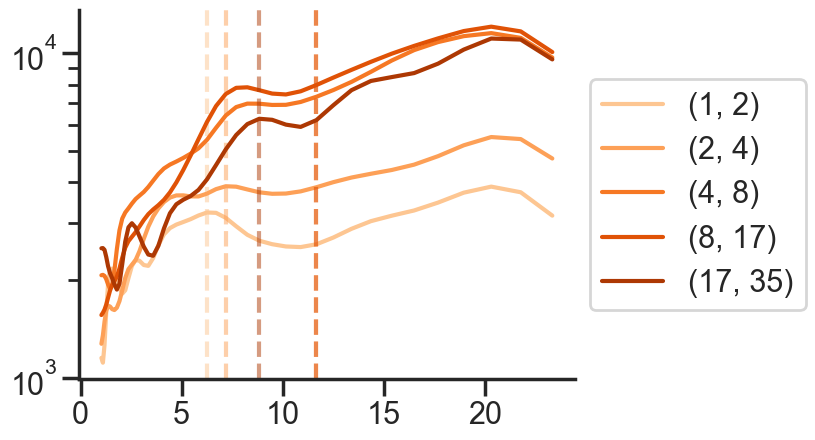

20220126_JA0153_lightHR1 19
(0, 1) 4250 6.25 1.0
(1, 2) 1150 6.25 1.0
(2, 4) 2525 7.1793647187314695 1.0
(4, 8) 4750 7.1793647187314695 1.0
(8, 17) 5750 7.1793647187314695 1.0
(17, 35) 1225 7.1793647187314695 1.0


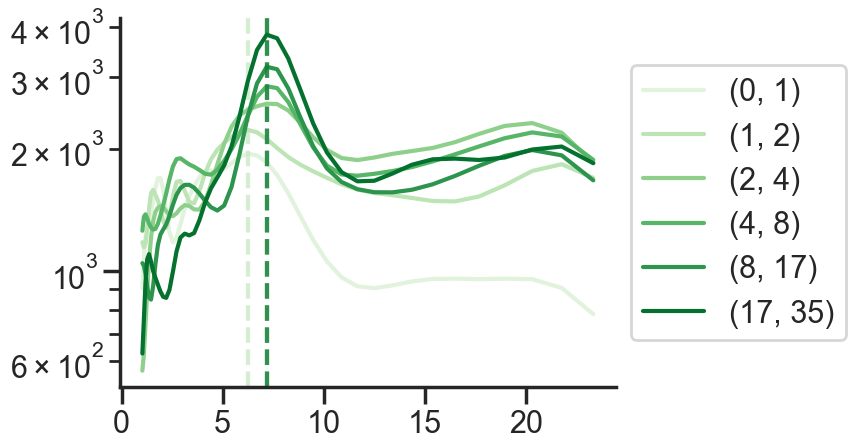

20220302_JA0162_dark1 4
(0, 1) 1500 5.440941020600776 1.0
(1, 2) 750 5.831456197105046 1.0
(2, 4) 2450 5.831456197105046 1.0
(4, 8) 10775 6.698584140851832 1.0
(8, 17) 7875 7.1793647187314695 1.0
(17, 35) 600 7.694652583405727 1.0


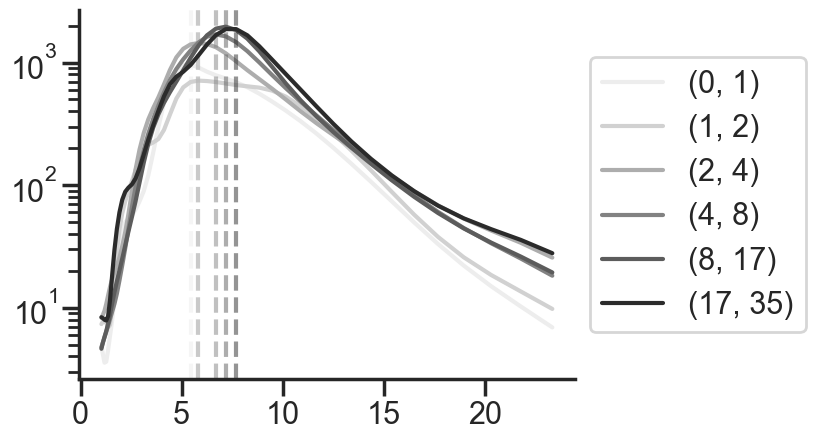

20220302_JA0162_darkHR1 1
20220302_JA0162_light1 8
(1, 2) 750 5.076577477226473 1.0
(2, 4) 2700 6.25 1.0
(4, 8) 10900 6.698584140851832 1.0
(8, 17) 8950 7.694652583405727 1.0
(17, 35) 650 6.698584140851832 1.0


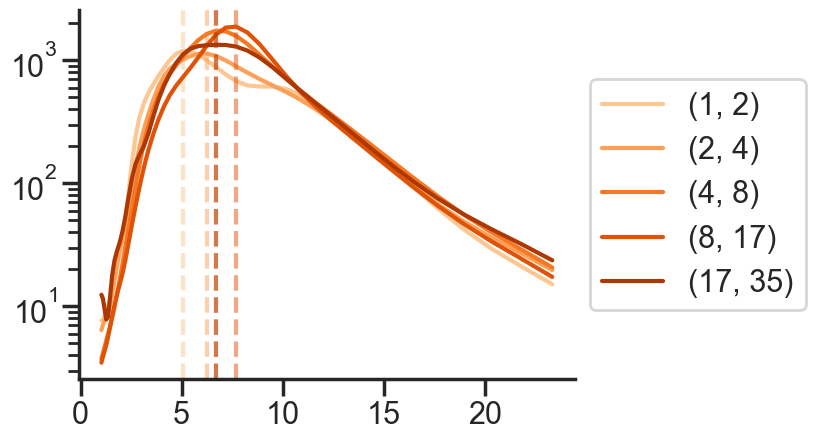

20220302_JA0162_lightHR1 9
(0, 1) 5875 7.1793647187314695 1.0
(1, 2) 1075 7.1793647187314695 1.0
(2, 4) 3075 6.698584140851832 1.0
(4, 8) 5500 7.1793647187314695 1.0
(8, 17) 1750 7.1793647187314695 1.0


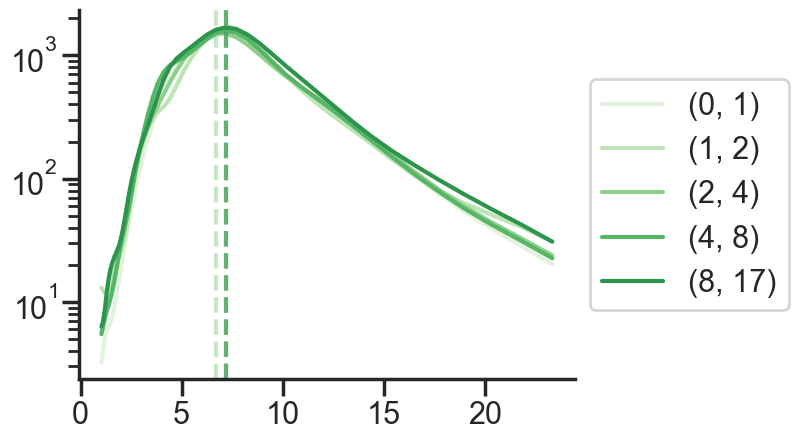

20220419_JA0164_dark1 7
(0, 1) 575 5.440941020600776 1.0
(1, 2) 2375 6.25 1.0
(2, 4) 5025 5.831456197105046 1.0
(4, 8) 5650 7.1793647187314695 1.0
(8, 17) 9500 7.694652583405727 1.0
(17, 35) 875 8.246924442330588 1.0


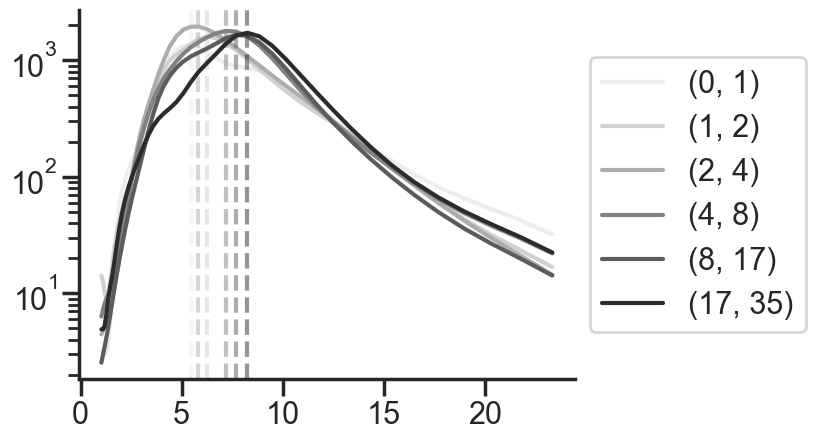

20220419_JA0164_darkHR1 6
(0, 1) 3250 7.694652583405727 1.0
(1, 2) 1850 6.698584140851832 1.0
(2, 4) 3450 7.1793647187314695 1.0
(4, 8) 7800 6.25 1.0
(8, 17) 6100 7.694652583405727 1.0
(17, 35) 600 6.25 1.0


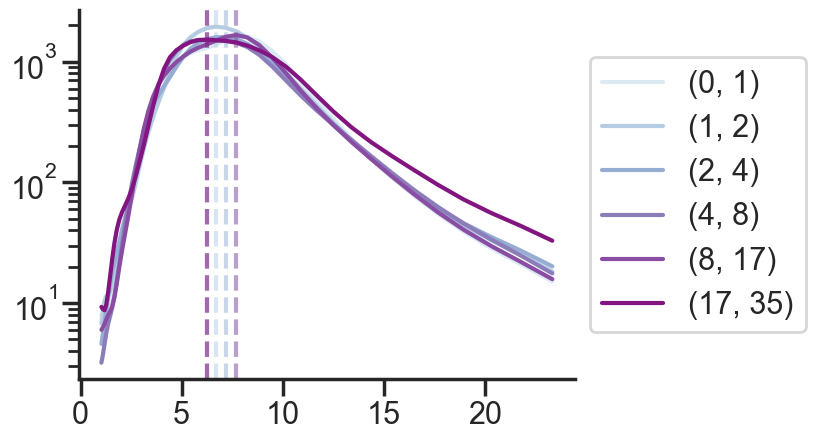

20220419_JA0164_light1 8
(1, 2) 550 5.831456197105046 1.0
(2, 4) 3875 6.25 1.0
(4, 8) 8150 6.698584140851832 1.0
(8, 17) 10650 7.694652583405727 1.0
(17, 35) 675 8.246924442330588 1.0


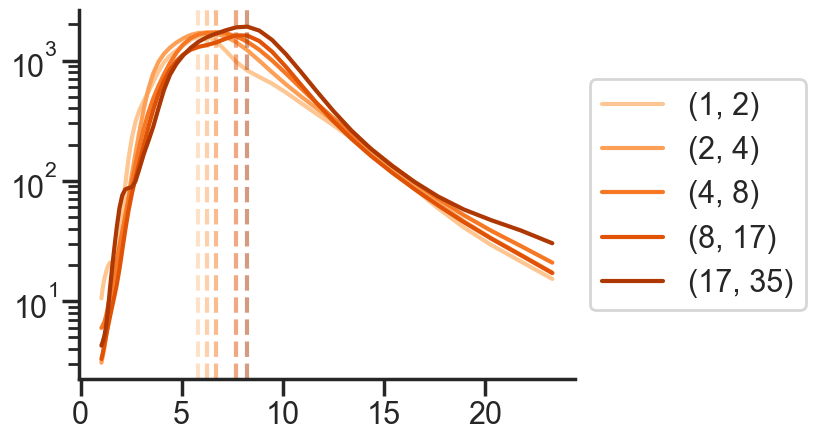

20220419_JA0164_lightHR1 10
(0, 1) 500 5.831456197105046 1.0
(1, 2) 2600 7.1793647187314695 1.0
(2, 4) 11775 7.1793647187314695 1.0
(4, 8) 7050 7.694652583405727 1.0
(8, 17) 1525 7.694652583405727 1.0


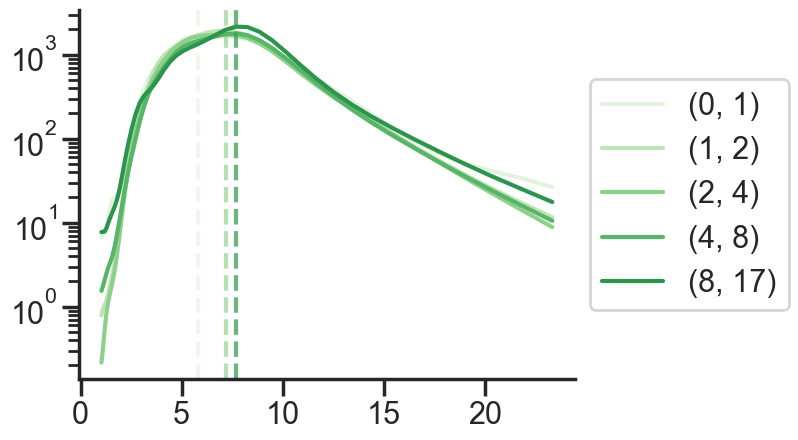

20220819_JA0178_dark1 29
(1, 2) 700 5.831456197105046 1.0
(2, 4) 2150 6.698584140851832 1.0
(4, 8) 8225 7.1793647187314695 1.0
(8, 17) 11425 7.694652583405727 0.6236531363851573
(17, 35) 1350 7.694652583405727 0.6194232905166643


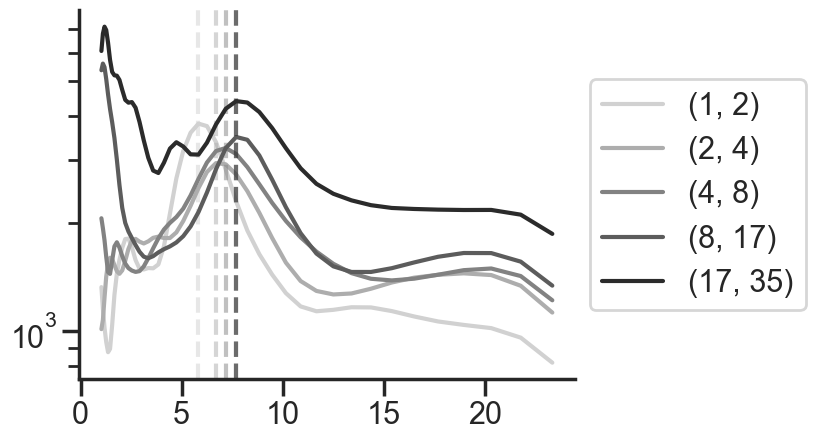

20220819_JA0178_darkHR1 0
20220819_JA0178_light1 29
(2, 4) 2400 5.831456197105046 1.0
(4, 8) 9275 7.1793647187314695 1.0
(8, 17) 10550 8.246924442330588 1.0
(17, 35) 1300 7.694652583405727 0.8644118743256325


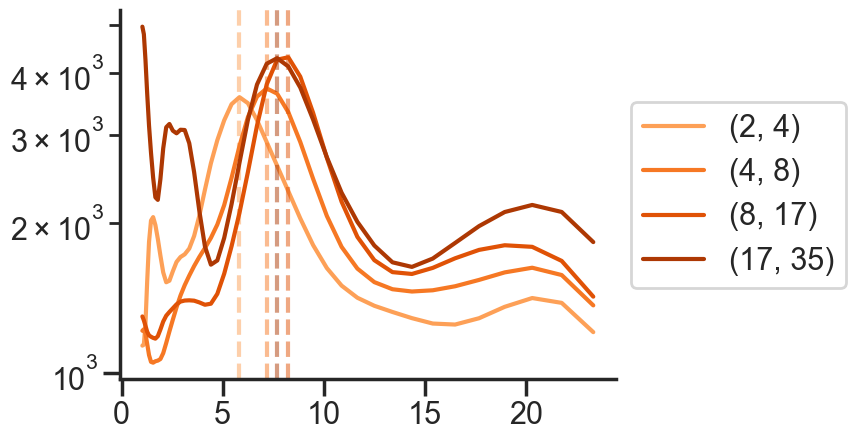

20220819_JA0178_lightHR1 30
(0, 1) 8675 5.831456197105046 1.0
(1, 2) 625 6.25 1.0
(2, 4) 2025 7.1793647187314695 1.0
(4, 8) 2750 7.1793647187314695 1.0
(8, 17) 750 7.1793647187314695 1.0


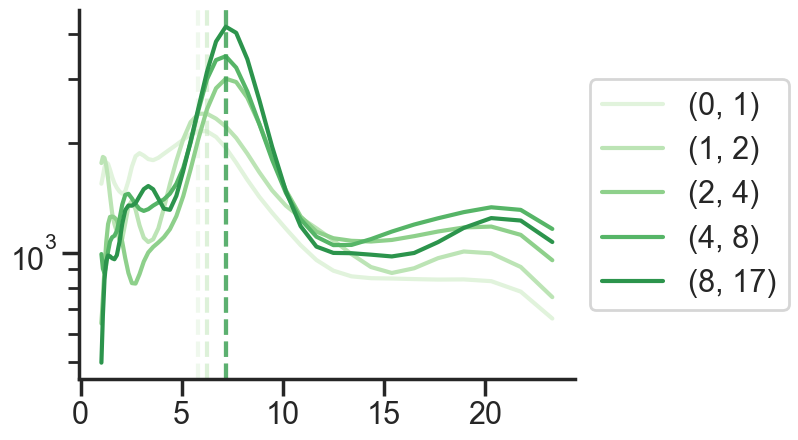

20220822_JA0178_dark1 24
(1, 2) 1250 6.698584140851832 0.8391016449498478
(2, 4) 5675 6.698584140851832 1.0
(4, 8) 7775 7.694652583405727 1.0
(8, 17) 8275 8.246924442330588 1.0
(17, 35) 775 4.419417382415922 0.18421682401743078


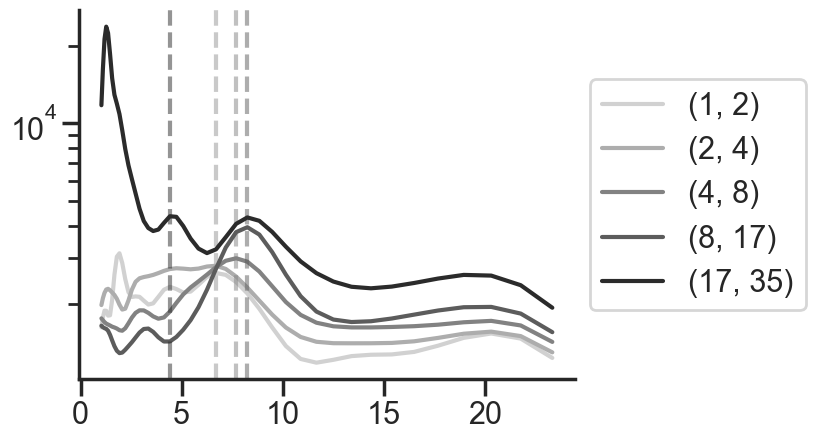

20220822_JA0178_darkHR1 24
(0, 1) 4250 6.25 0.9371146763241321
(1, 2) 1450 6.698584140851832 1.0
(2, 4) 2700 6.25 1.0
(4, 8) 5700 7.1793647187314695 1.0
(8, 17) 6275 7.1793647187314695 1.0


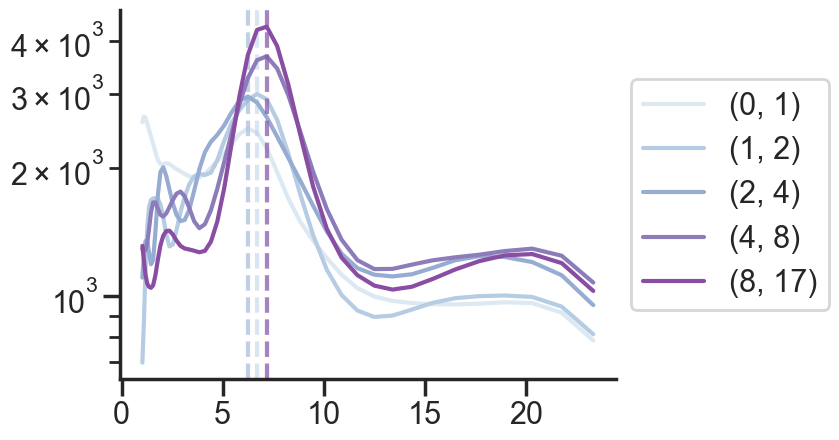

20220822_JA0178_light1 24
(1, 2) 800 6.698584140851832 1.0
(2, 4) 5400 5.831456197105046 0.7820849718096331
(4, 8) 6575 6.698584140851832 0.2100099048782551
(8, 17) 9525 4.123462221165294 0.1314669445374259
(17, 35) 1475 8.246924442330588 0.2307933262753447


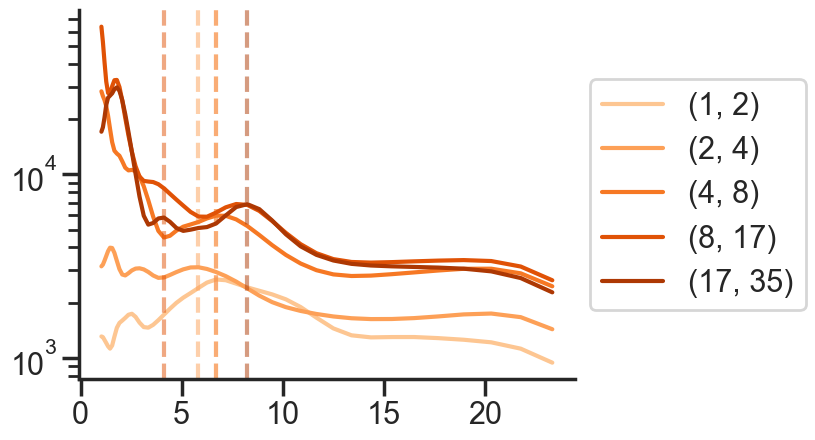

20220822_JA0178_lightHR1 26
(0, 1) 3000 6.25 1.0
(1, 2) 2525 6.25 1.0
(2, 4) 1975 7.1793647187314695 1.0
(4, 8) 3850 6.698584140851832 1.0
(8, 17) 3875 7.1793647187314695 1.0


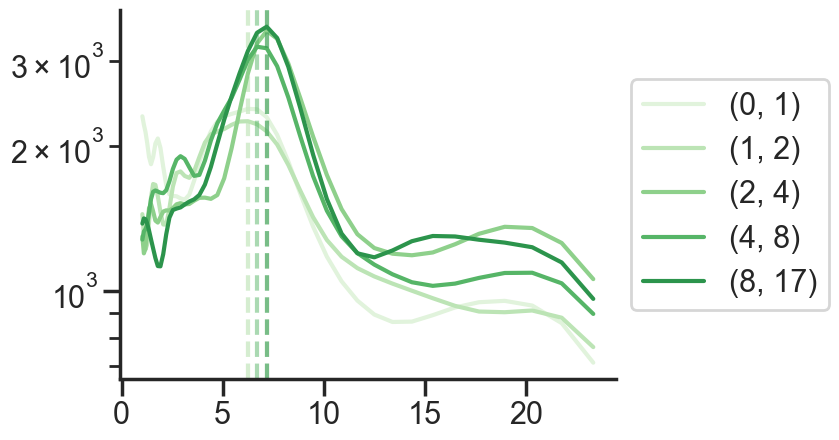

20220824_JA0178_dark1 5
(0, 1) 1000 10.153154954452944 0.9091578285220302
(1, 2) 925 5.440941020600776 1.0
(2, 4) 3400 7.1793647187314695 1.0
(4, 8) 10400 6.698584140851832 1.0
(8, 17) 7800 7.694652583405727 0.30124809743764097


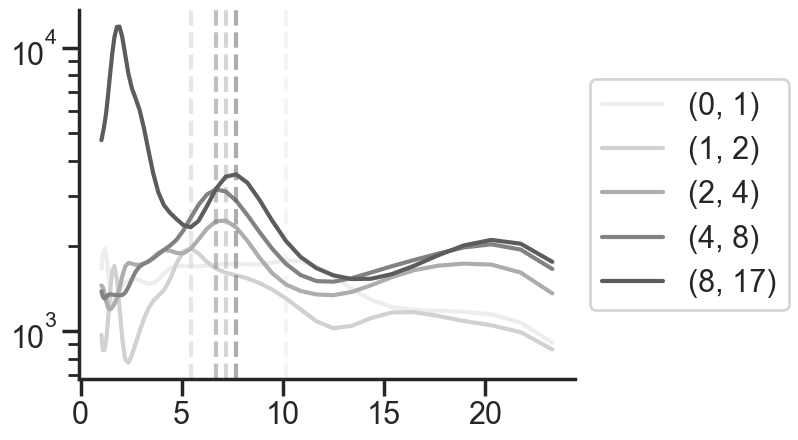

20220824_JA0178_darkHR1 2
20220824_JA0178_light1 5
(1, 2) 750 4.123462221165294 1.0
(2, 4) 5425 6.698584140851832 1.0
(4, 8) 13250 7.1793647187314695 1.0
(8, 17) 4550 8.246924442330588 1.0


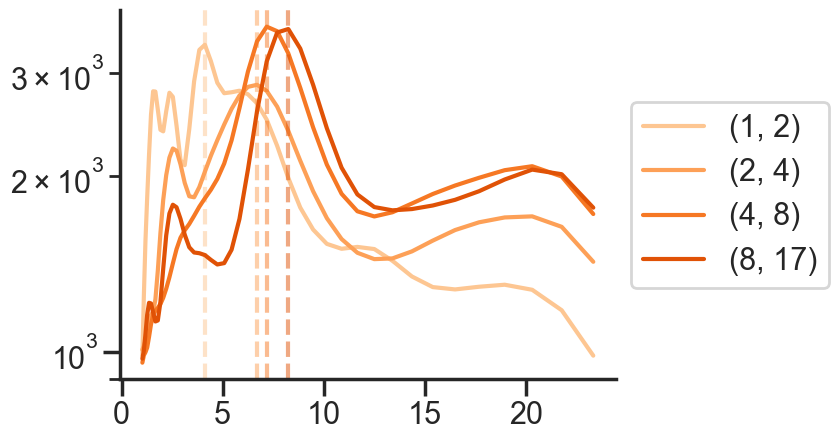

20220824_JA0178_lightHR1 7
(0, 1) 7875 5.831456197105046 1.0
(1, 2) 700 7.1793647187314695 1.0
(2, 4) 775 7.694652583405727 1.0
(4, 8) 1875 7.1793647187314695 1.0
(8, 17) 625 7.694652583405727 1.0


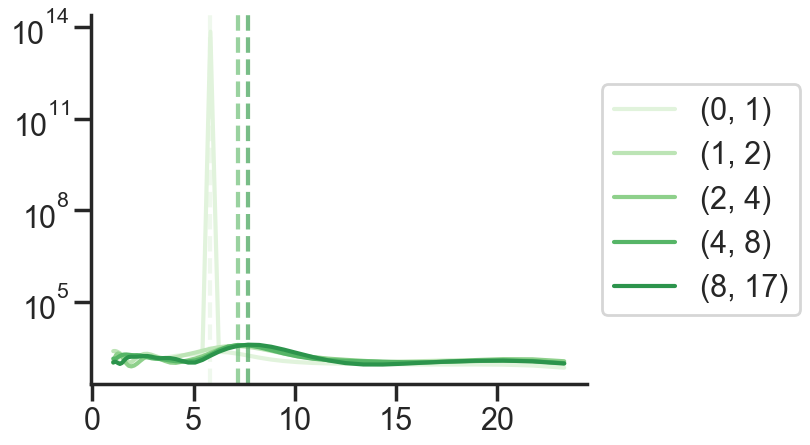

20220906_JA0178_dark1 11
(1, 2) 750 4.419417382415922 0.9914208618268239
(2, 4) 1825 5.440941020600776 1.0
(4, 8) 6725 7.1793647187314695 1.0
(8, 17) 13575 8.246924442330588 1.0
(17, 35) 950 8.246924442330588 1.0


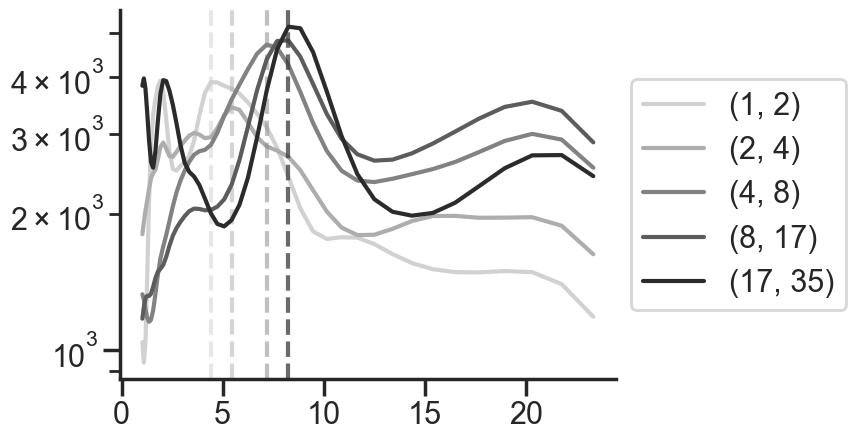

20220906_JA0178_darkHR1 3
(0, 1) 9225 5.831456197105046 1.0
(1, 2) 1500 6.698584140851832 1.0
(2, 4) 2575 6.698584140851832 1.0
(4, 8) 5650 7.1793647187314695 1.0
(8, 17) 900 6.698584140851832 1.0


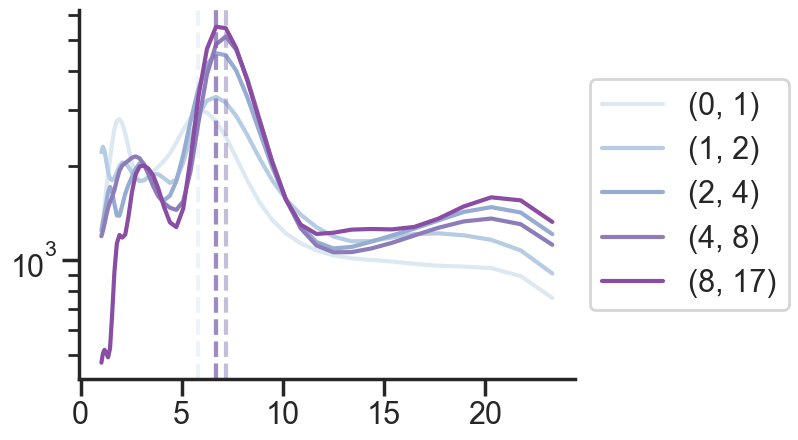

20220906_JA0178_light1 10
(2, 4) 2150 4.736614270344994 1.0
(4, 8) 7275 7.694652583405727 1.0
(8, 17) 13825 8.246924442330588 1.0
(17, 35) 700 8.246924442330588 1.0


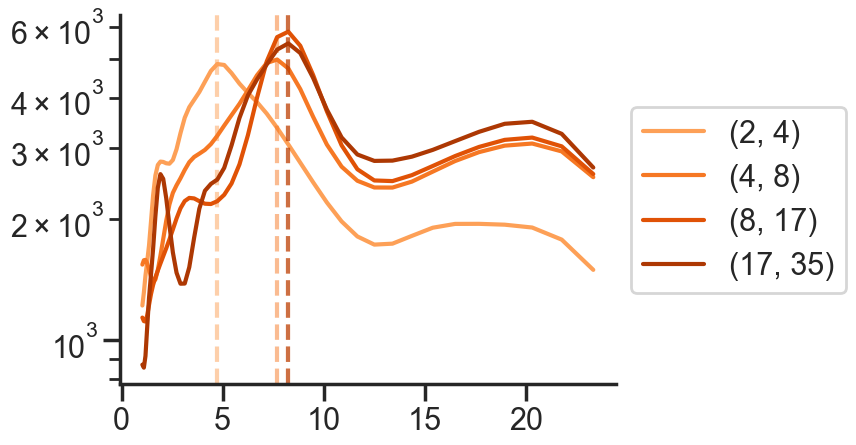

20220906_JA0178_lightHR1 1
20220812_JA0181_dark1 11
(1, 2) 1000 7.694652583405727 1.0
(2, 4) 2325 6.698584140851832 1.0
(4, 8) 5450 7.694652583405727 1.0
(8, 17) 12700 8.246924442330588 1.0
(17, 35) 2125 8.246924442330588 1.0


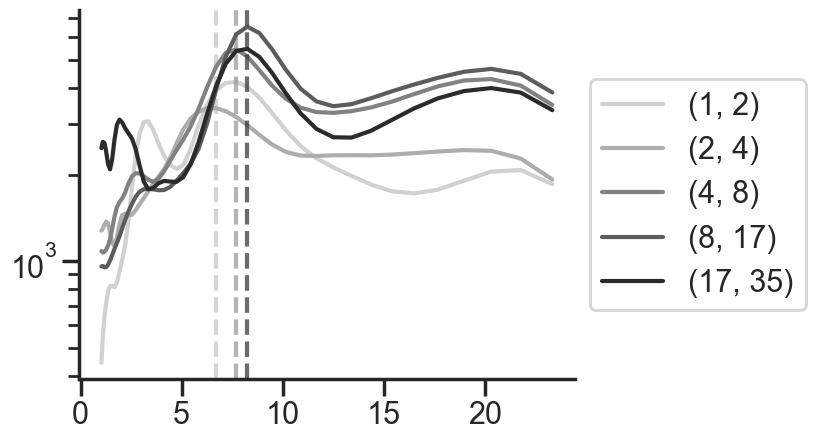

20220812_JA0181_darkHR1 13
(0, 1) 6625 6.698584140851832 1.0
(1, 2) 1150 7.1793647187314695 1.0
(2, 4) 2475 7.1793647187314695 1.0
(4, 8) 3950 7.1793647187314695 1.0
(8, 17) 1625 7.1793647187314695 1.0


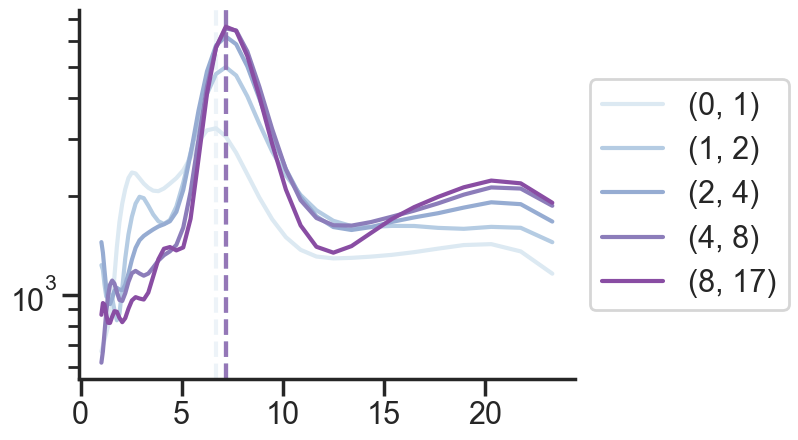

20220812_JA0181_light1 13
(1, 2) 1825 6.25 1.0
(2, 4) 2650 6.698584140851832 1.0
(4, 8) 5675 7.694652583405727 1.0
(8, 17) 11425 8.246924442330588 1.0
(17, 35) 2275 8.246924442330588 1.0


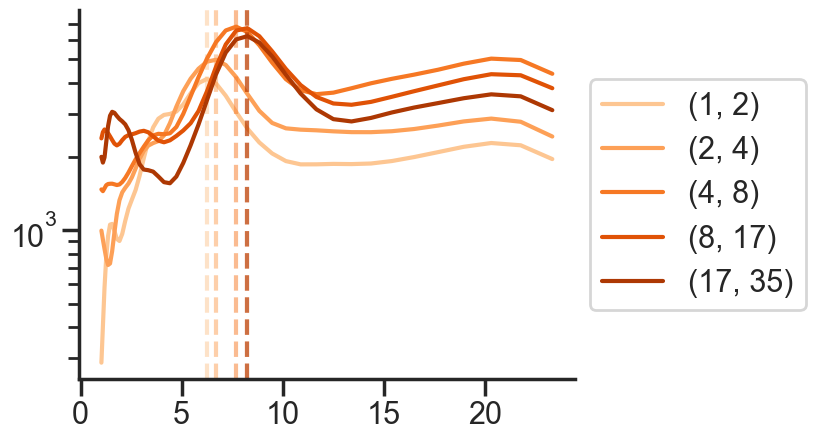

20220812_JA0181_lightHR1 12
(0, 1) 3650 6.25 1.0
(1, 2) 625 7.1793647187314695 1.0
(2, 4) 1325 7.694652583405727 1.0
(4, 8) 1950 7.694652583405727 1.0
(8, 17) 2500 7.694652583405727 1.0


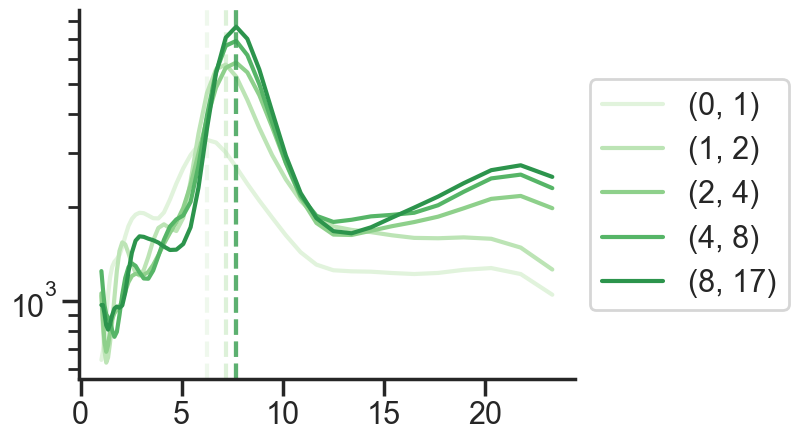

20220815_JA0181_dark1 15
(2, 4) 1400 6.698584140851832 1.0
(4, 8) 3425 7.694652583405727 1.0
(8, 17) 12425 8.246924442330588 1.0
(17, 35) 6050 8.246924442330588 1.0


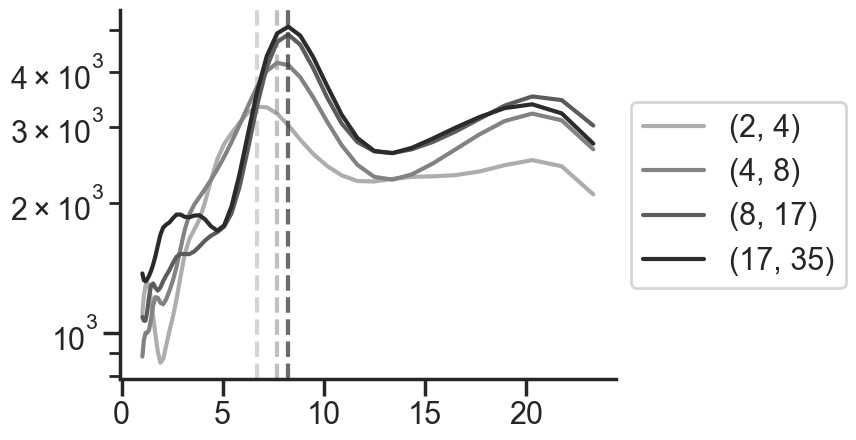

20220815_JA0181_darkHR1 13
(0, 1) 6425 6.698584140851832 0.8581860283095343
(1, 2) 1250 7.1793647187314695 1.0
(2, 4) 2250 7.694652583405727 1.0
(4, 8) 4850 7.694652583405727 1.0
(8, 17) 2225 7.694652583405727 1.0


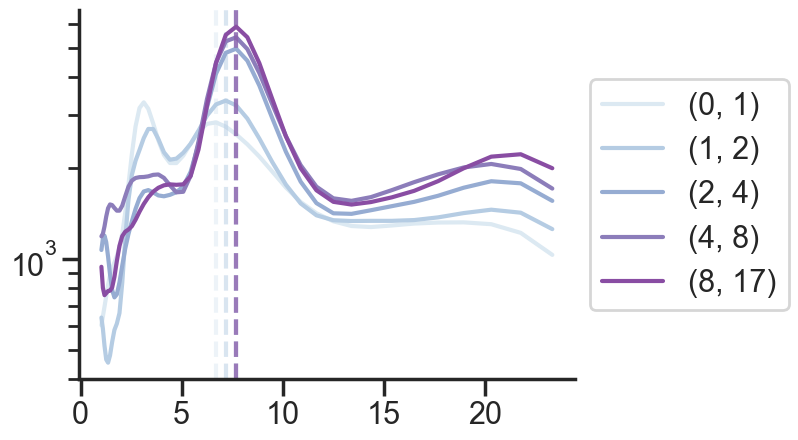

20220815_JA0181_light1 15
(2, 4) 1475 6.698584140851832 1.0
(4, 8) 3475 7.694652583405727 1.0
(8, 17) 12150 8.246924442330588 1.0
(17, 35) 6325 8.246924442330588 1.0


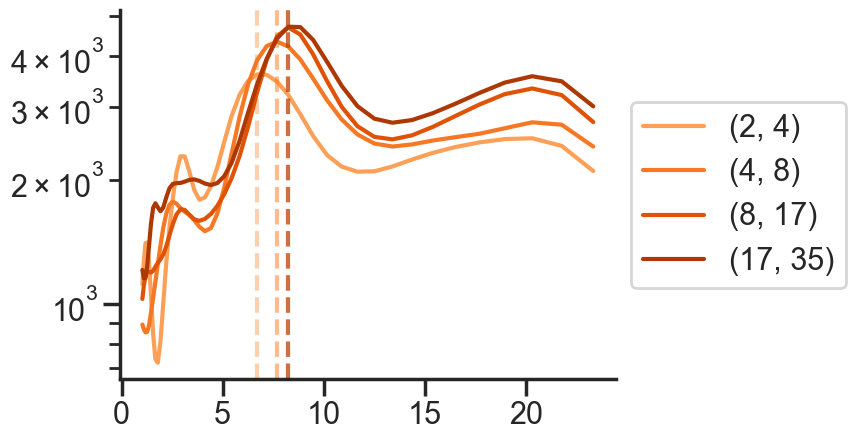

20220815_JA0181_lightHR1 16
(0, 1) 4250 6.698584140851832 1.0
(1, 2) 725 6.698584140851832 1.0
(2, 4) 775 7.694652583405727 1.0
(4, 8) 2050 7.694652583405727 1.0
(8, 17) 2075 7.694652583405727 1.0


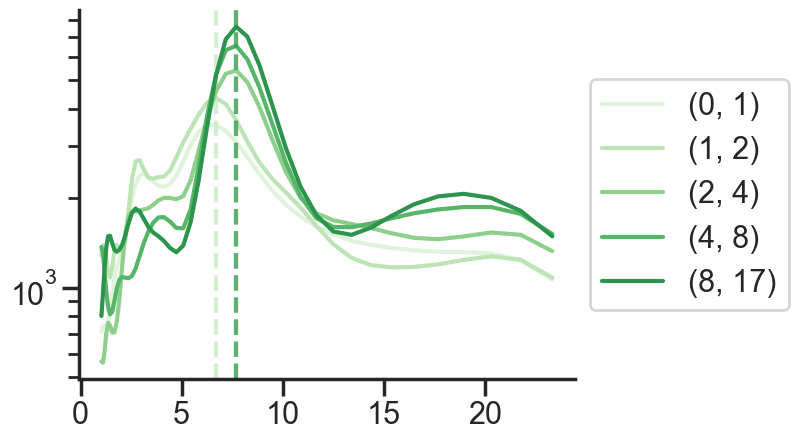

20220818_JA0181_dark1 14
(2, 4) 1125 5.076577477226473 1.0
(4, 8) 6075 7.694652583405727 1.0
(8, 17) 13575 8.246924442330588 1.0
(17, 35) 2775 8.838834764831844 1.0


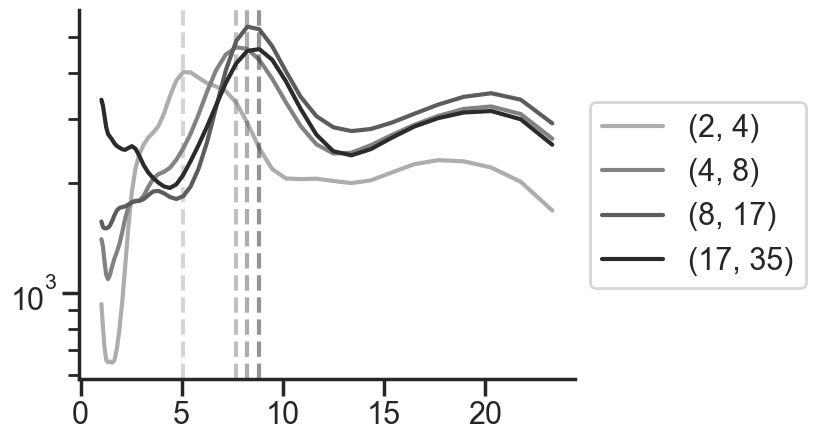

20220818_JA0181_darkHR1 0
20220818_JA0181_light1 14
(2, 4) 1775 6.698584140851832 1.0
(4, 8) 6650 7.694652583405727 1.0
(8, 17) 13825 8.838834764831844 1.0
(17, 35) 1325 8.838834764831844 1.0


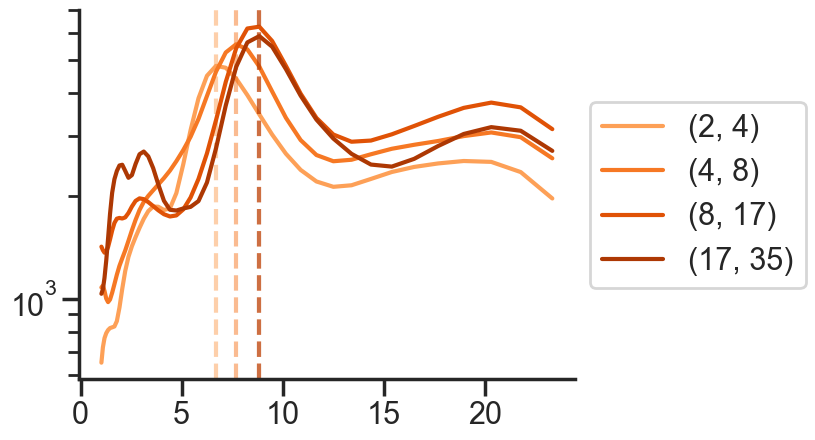

20220818_JA0181_lightHR1 14
(0, 1) 8875 7.1793647187314695 1.0
(1, 2) 725 7.1793647187314695 1.0
(2, 4) 1275 7.694652583405727 1.0
(4, 8) 1200 7.694652583405727 1.0


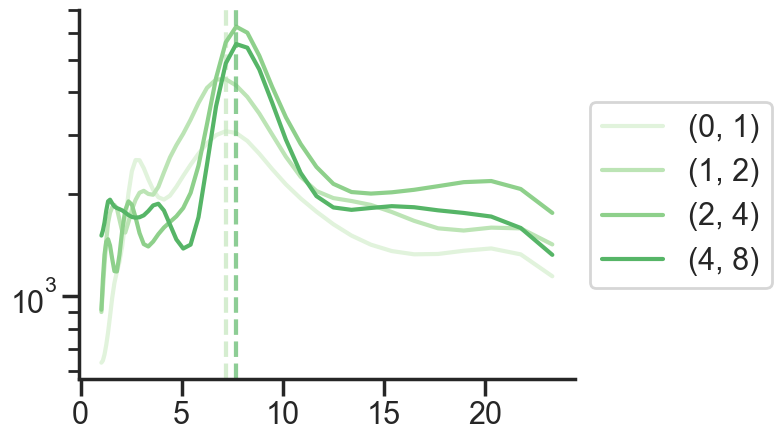

20220712_MC022_dark1 39
(2, 4) 825 8.246924442330588 1.0
(4, 8) 4300 8.246924442330588 1.0
(8, 17) 14975 8.246924442330588 1.0
(17, 35) 3475 8.838834764831844 1.0


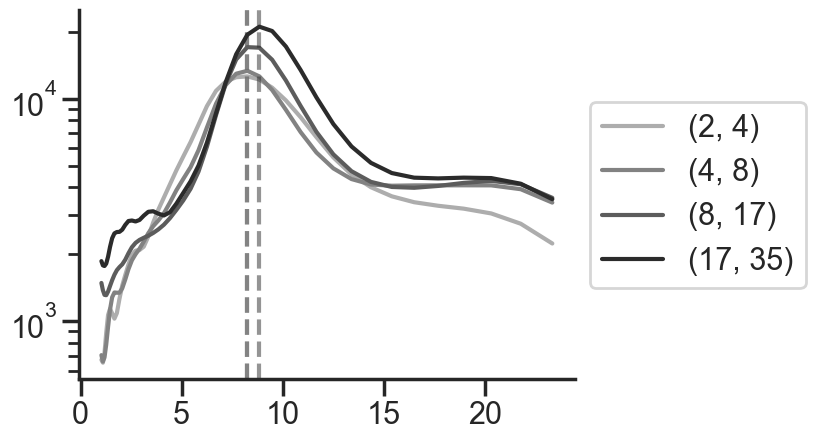

20220712_MC022_darkHR1 36
(0, 1) 5475 7.1793647187314695 1.0
(1, 2) 2075 7.1793647187314695 1.0
(2, 4) 1300 7.1793647187314695 1.0
(4, 8) 3650 7.1793647187314695 1.0
(8, 17) 3850 7.1793647187314695 1.0


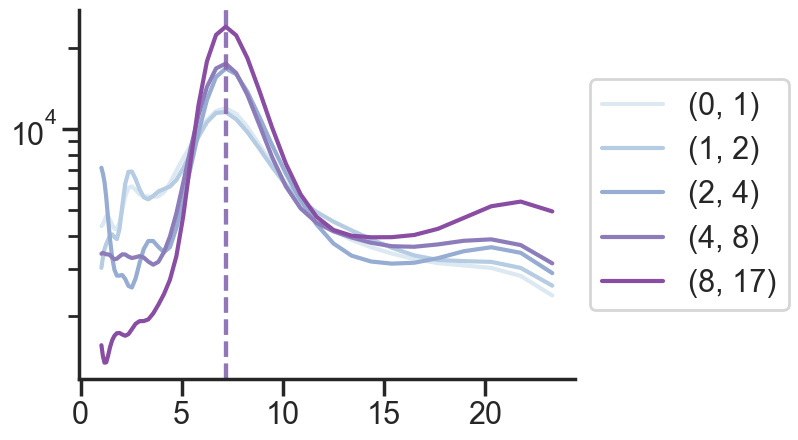

20220712_MC022_light1 39
(2, 4) 1100 6.25 1.0
(4, 8) 3600 8.246924442330588 1.0
(8, 17) 14050 8.838834764831844 1.0
(17, 35) 4850 8.838834764831844 1.0


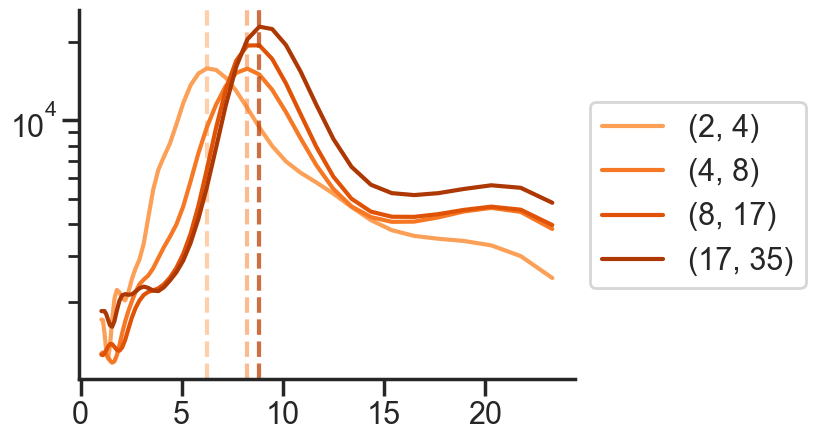

20220712_MC022_lightHR1 41
(0, 1) 2975 6.698584140851832 1.0
(1, 2) 650 6.698584140851832 1.0
(2, 4) 2300 7.1793647187314695 1.0
(4, 8) 4550 7.1793647187314695 1.0
(8, 17) 4000 7.694652583405727 1.0


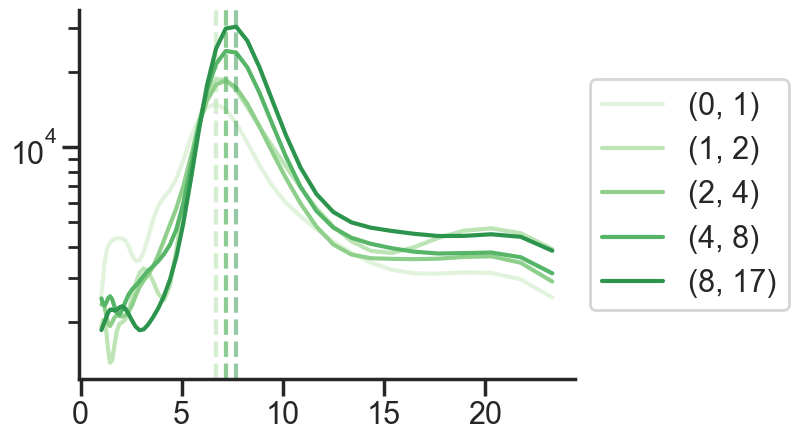

20220722_MC022_dark1 1
20220722_MC022_darkHR1 2
20220722_MC022_light1 1
20220722_MC022_lightHR1 1
20220829_MC038_dark1 0
20220829_MC038_darkHR1 4
(0, 1) 12925 6.698584140851832 1.0
(1, 2) 2050 6.698584140851832 1.0
(2, 4) 1900 7.1793647187314695 1.0
(4, 8) 3025 7.1793647187314695 1.0
(8, 17) 1600 7.1793647187314695 1.0


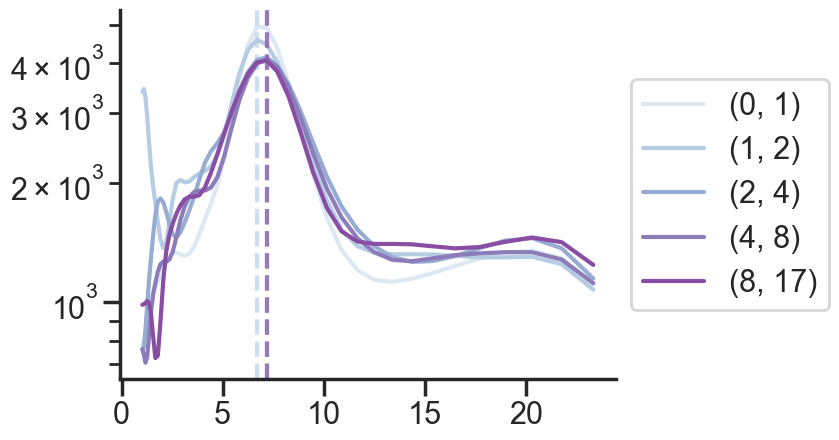

20220829_MC038_light1 0
20220829_MC038_lightHR1 5
(0, 1) 16750 7.1793647187314695 1.0
(1, 2) 2850 7.1793647187314695 1.0
(2, 4) 1250 7.1793647187314695 1.0
(4, 8) 2500 7.694652583405727 1.0


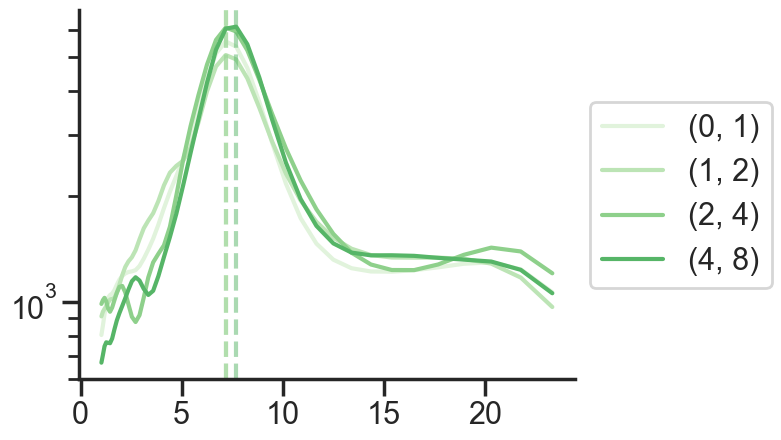

,rec_id,freq,cwt,rec_session,speed_bin,dts,theta_amp_ratio,animal_name,cond,peak_freq
0,20211207_JA0144_dark1,25.000000,10.248156,JA0144_20211207,"(0, 1)",20211207,1.0,JA0144,dark1,7.179365
1,20211207_JA0144_dark1,23.325825,15.563750,JA0144_20211207,"(0, 1)",20211207,1.0,JA0144,dark1,7.179365
2,20211207_JA0144_dark1,21.763764,22.168566,JA0144_20211207,"(0, 1)",20211207,1.0,JA0144,dark1,7.179365
3,20211207_JA0144_dark1,20.306310,31.183753,JA0144_20211207,"(0, 1)",20211207,1.0,JA0144,dark1,7.179365
4,20211207_JA0144_dark1,18.946457,44.810948,JA0144_20211207,"(0, 1)",20211207,1.0,JA0144,dark1,7.179365


In [389]:
ls_tf = []
fs_lfp = 50
gamma = 3 
beta = 10 # decrease beta to improve temporal resolution
# 0.5s window
window_size = 25
speed_bins = [(0, 1), (1, 2), (2, 4), (4, 8), (8, 17), (17, 35)]
ang_speed_bins = [(-50, -25), (-25, -12), (-12, -1), (1, 12), (12, 25), (25, 50)]

for k in d_hr_data.keys():
    
    dts, animal_name, cond = k.split('_')[-3:]
    rec_session = animal_name + '_' + dts
    data = d_hr_data[k]
    data_ephys = d_hr_data[k]['ephys']
    data_beh = d_hr_data[k]['beh']
    hdc_ephys = data_ephys[data_ephys.hdc_flag == True]
    hdc_units = hdc_ephys.cids.unique()
    
    print(k, hdc_units.size)
    if (hdc_units.size < 3):
        continue
    
    lfp = hdc_ephys.groupby('times')['lfp'].mean().values
    lfp_ts = hdc_ephys.groupby('times')['lfp'].mean().index.values
    speed = data_beh['lin_vel'].values
    # CAR LFP subract median of all channels to remove volume conducted lfp
#     med_lfp = df_hr_master_2[df_hr_master_2.rec_id == rec].groupby('times')['lfp'].median().values
#     lfp = lfp - med_lfp
    
    lin_speed = speed[:speed.size//window_size*window_size]
    lin_speed_sm = savgol_filter(lin_speed, window_length= window_size, polyorder=2)
    ang_vel = data_beh['omega'].values
    ang_vel = ang_vel[:ang_vel.size//window_size*window_size]

    chunk_mean = np.mean(lin_speed.reshape(-1, window_size), 1)
#     chunk_mean = np.mean(ang_vel.reshape(-1, window_size), 1)

    for idx, b in enumerate(speed_bins):
        lfp_chunk_ls = []
        bin_chunk = np.where((chunk_mean > b[0]) & (chunk_mean < b[1]))[0]
        # at least 10s
        if len(bin_chunk) < 20:
            continue
        for bc in bin_chunk:
            lfp_chunk_ls.append(lfp[bc*window_size : bc*window_size + window_size])
        lfp_roi = np.concatenate(lfp_chunk_ls)
        
        cwtcoefs, _, freq, cwtts, _ = gsp.cwt( lfp_roi, timestamps=lfp_ts, freq_limits=[1, 25], fs=fs_lfp,
            wavelet=gsp.MorseWavelet(gamma=gamma, beta=beta))
        cwt_power = cwtcoefs.imag**2 + cwtcoefs.real**2
        freq_idx = np.where(freq<25)[0]
        cwt_mean_pow = cwt_power.mean(axis = 1)
#         if np.isnan(cwt_mean_pow).sum() > 20:
#             continue
        
        theta_freq = np.where((freq>4) & (freq < 12))[0]
        peak_freq_idx = cwt_mean_pow[theta_freq].argmax()
        peak_freq = freq[theta_freq[0] + peak_freq_idx]
        amp_ratio = cwt_mean_pow[theta_freq].max()/cwt_mean_pow.max()
        print(b, lfp_roi.size, peak_freq, amp_ratio)
        
        plt.semilogy(freq[freq_idx], cwt_mean_pow[freq_idx], label = b, color = d_pal[cond][idx])
        plt.axvline(x = peak_freq, color = d_pal[cond][idx], ls = '--', alpha = 0.5)
#         f, Pxx_den = ssig.welch(lfp_roi, fs_lfp, nperseg = 6*fs_lfp, nfft = 2**14, noverlap = 3*fs_lfp ) # 4 seconds window
     
        ls_tf.append(pd.DataFrame({'rec_id': k, 'freq': freq, 'cwt': cwt_mean_pow, 'rec_session':rec_session,
                                   'speed_bin': [b]*freq.size, 'dts':dts, 'theta_amp_ratio': amp_ratio,
                                   'animal_name': animal_name, 'cond': cond, 'peak_freq': peak_freq }))
        
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    plt.show()
#     break
df_hr_tf = pd.concat(ls_tf)
df_hr_tf.head()

In [390]:
Mean = df_hr_tf.groupby(['rec_id', 'speed_bin']).cwt.transform('mean')    
Std = df_hr_tf.groupby(['rec_id', 'speed_bin']).cwt.transform('std')  
df_hr_tf['cwt_zscore'] = (df_hr_tf.cwt.values - Mean) / Std

In [394]:
lfp.shape

(24000,)

In [391]:
df_hr_tf.head()

,rec_id,freq,cwt,rec_session,speed_bin,dts,theta_amp_ratio,animal_name,cond,peak_freq,cwt_zscore
0,20211207_JA0144_dark1,25.000000,10.248156,JA0144_20211207,"(0, 1)",20211207,1.0,JA0144,dark1,7.179365,-0.767953
1,20211207_JA0144_dark1,23.325825,15.563750,JA0144_20211207,"(0, 1)",20211207,1.0,JA0144,dark1,7.179365,-0.758712
2,20211207_JA0144_dark1,21.763764,22.168566,JA0144_20211207,"(0, 1)",20211207,1.0,JA0144,dark1,7.179365,-0.747230
3,20211207_JA0144_dark1,20.306310,31.183753,JA0144_20211207,"(0, 1)",20211207,1.0,JA0144,dark1,7.179365,-0.731558
4,20211207_JA0144_dark1,18.946457,44.810948,JA0144_20211207,"(0, 1)",20211207,1.0,JA0144,dark1,7.179365,-0.707868


In [215]:
# df_hr_tf.to_pickle('df_hr_tf.pkl')

In [392]:
df_hr_tf.cond.unique()

array(['dark1', 'darkHR1', 'light1', 'lightHR1'], dtype=object)

JA0144


C:\Users\lab\AppData\Local\Temp\ipykernel_18196\546969595.py:14: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  sns.lineplot(data=_inp_plot, x="freq", y=y, hue="speed_bin",


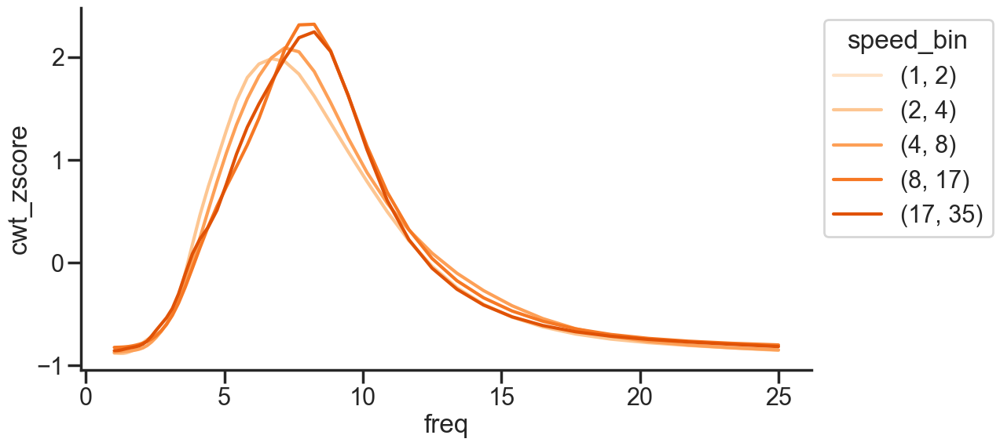

JA0153


C:\Users\lab\AppData\Local\Temp\ipykernel_18196\546969595.py:14: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  sns.lineplot(data=_inp_plot, x="freq", y=y, hue="speed_bin",


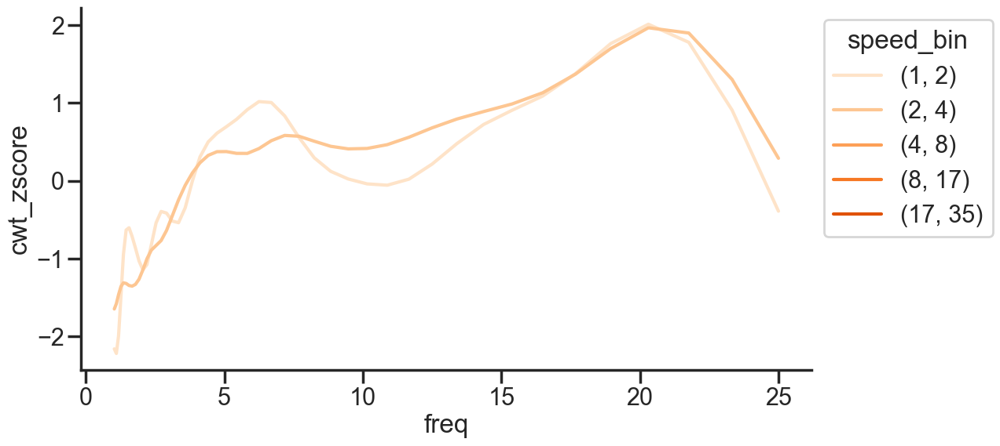

JA0162


C:\Users\lab\AppData\Local\Temp\ipykernel_18196\546969595.py:14: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  sns.lineplot(data=_inp_plot, x="freq", y=y, hue="speed_bin",


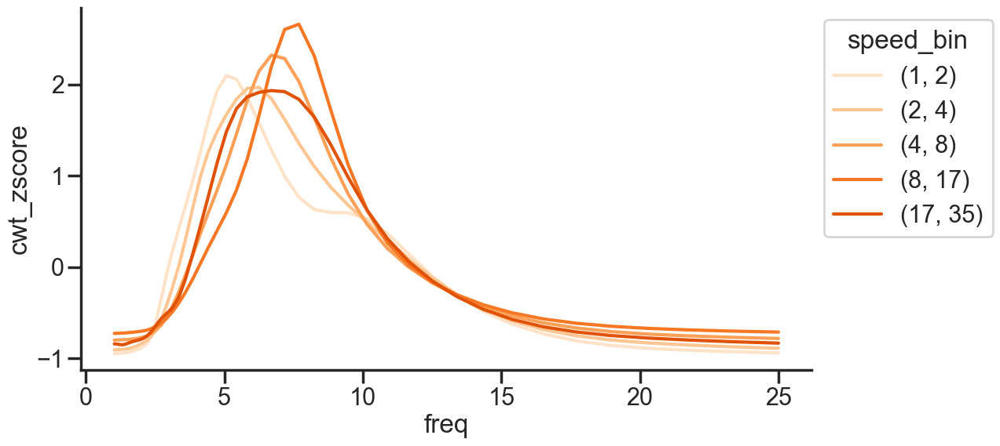

JA0164


C:\Users\lab\AppData\Local\Temp\ipykernel_18196\546969595.py:14: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  sns.lineplot(data=_inp_plot, x="freq", y=y, hue="speed_bin",


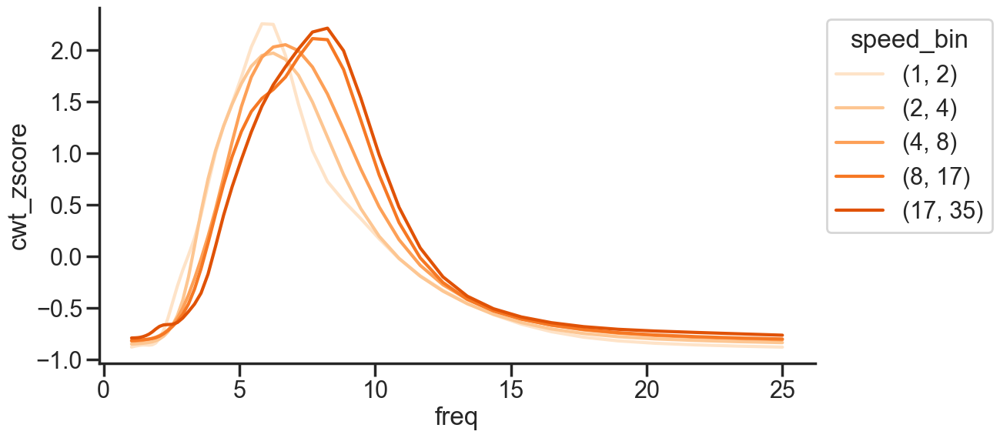

JA0178


C:\Users\lab\AppData\Local\Temp\ipykernel_18196\546969595.py:14: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  sns.lineplot(data=_inp_plot, x="freq", y=y, hue="speed_bin",


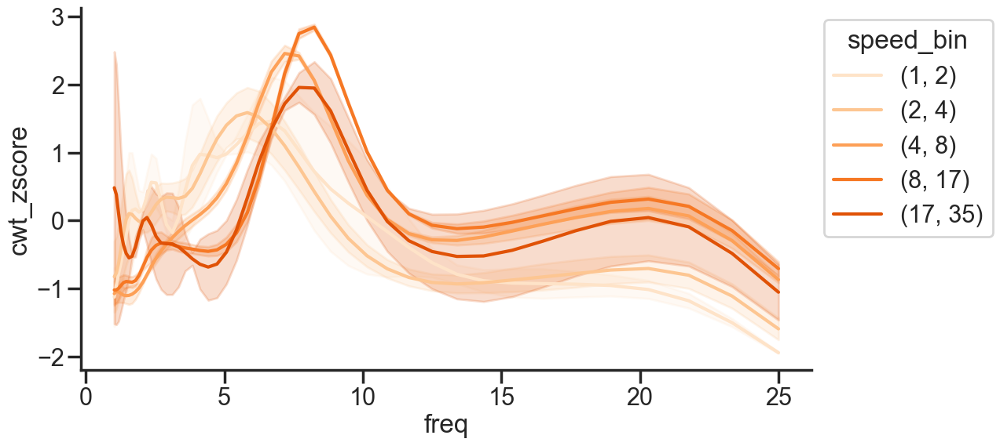

JA0181


C:\Users\lab\AppData\Local\Temp\ipykernel_18196\546969595.py:14: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  sns.lineplot(data=_inp_plot, x="freq", y=y, hue="speed_bin",


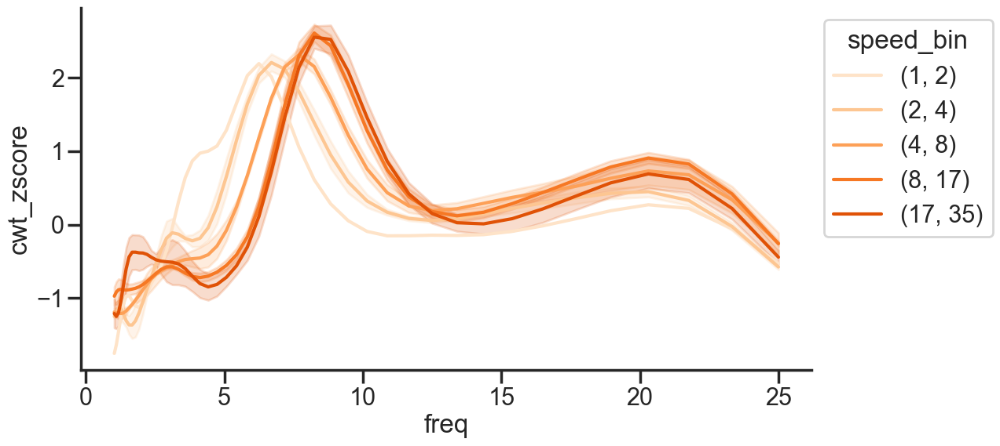

MC022


C:\Users\lab\AppData\Local\Temp\ipykernel_18196\546969595.py:14: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  sns.lineplot(data=_inp_plot, x="freq", y=y, hue="speed_bin",


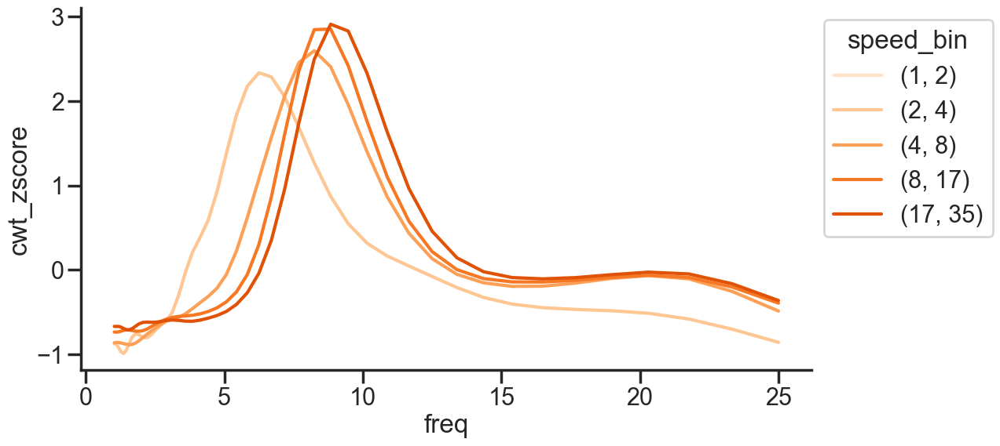

In [393]:
cond = 'light1'
data = df_hr_tf
y = 'cwt_zscore'
_inp_data = data[(data.theta_amp_ratio > 0.7) 
                  & (data.cond == cond) 
                  & (data.speed_bin != (0, 1))]

for m in _inp_data.animal_name.unique():
    print (m)
    f, ax = plt.subplots(figsize=(12, 6))
#     ax.set( yscale="log")

    _inp_plot = _inp_data[(_inp_data.animal_name == m)].dropna()
    sns.lineplot(data=_inp_plot, x="freq", y=y, hue="speed_bin", 
                 hue_order = [(1, 2), (2, 4), (4, 8), (8, 17), (17, 35)], 
                 errorbar=('se', 1), palette = d_pal[cond], ax = ax)
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    plt.show()
# plt.savefig(f'MC022_thetapow_speed_{cond}.pdf', transparent=True)

C:\Users\lab\AppData\Local\Temp\ipykernel_11956\1282412145.py:13: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  sns.lineplot(data=_inp_plot, x="freq", y=y, hue="speed_bin",


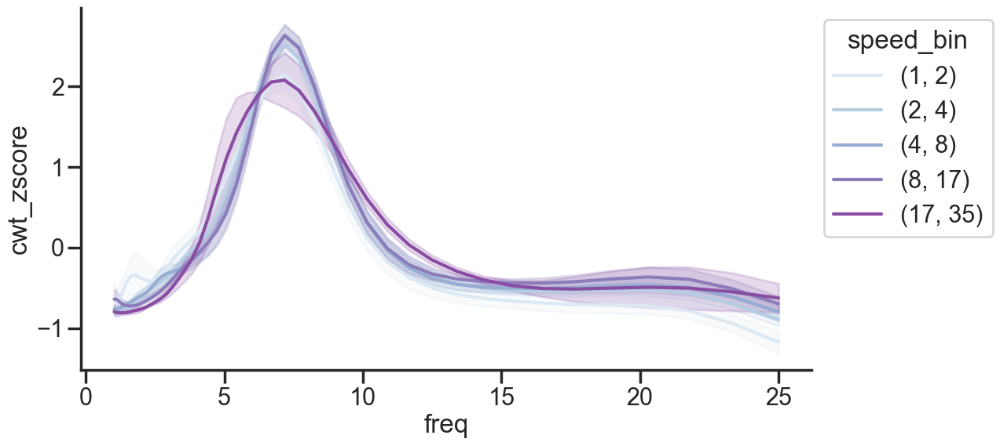

In [36]:
data = df_hr_tf
cond = 'darkHR1'
y = 'cwt_zscore'

_inp_data = data[(data.theta_amp_ratio > 0.7) 
                  & (data.cond == cond) 
                  & (data.speed_bin != (0, 1))]

f, ax = plt.subplots(figsize=(12, 6))
# ax.set( yscale="log")

_inp_plot = _inp_data
sns.lineplot(data=_inp_plot, x="freq", y=y, hue="speed_bin", 
             hue_order = [(1, 2), (2, 4), (4, 8), (8, 17), (17, 35)], 
             errorbar=('se', 1), palette = d_pal[cond], ax = ax)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

# plt.savefig(f'line_hr_tf_{cond}_{y}.pdf', transparent=True)

(array([0, 1, 2, 3]),
 [Text(0, 0, '(1, 2)'),
  Text(1, 0, '(2, 4)'),
  Text(2, 0, '(4, 8)'),
  Text(3, 0, '(8, 17)')])

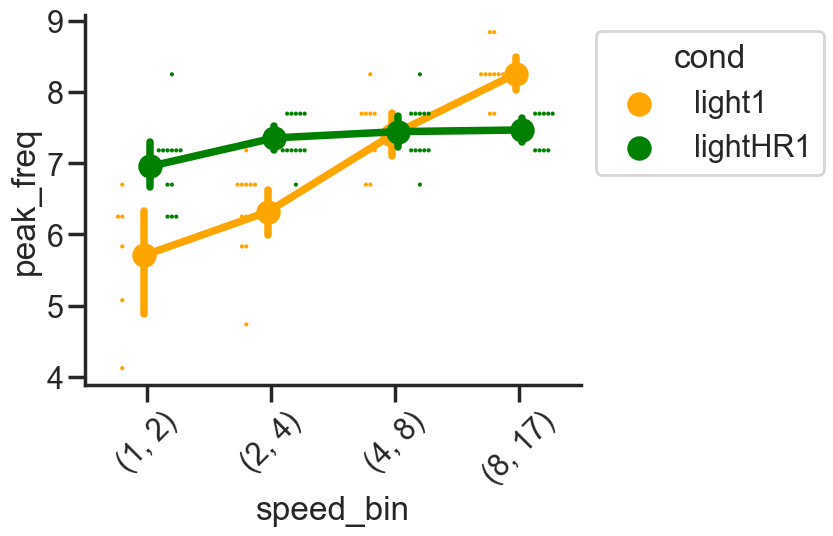

In [462]:
y = 'peak_freq'
coi = ['light1', 'lightHR1']; pal = ['orange', 'green']
# coi = ['dark1', 'darkHR1']; pal = ['grey', 'brown']

data = df_hr_tf[(df_hr_tf.cond.isin(coi))]
cond_ls = data.cond.unique()

_inp_plot = data[(data.cond.isin(cond_ls)) 
                  & (data.theta_amp_ratio > 0.7) 
                  & (data.speed_bin != (0, 1))
                  & (data.freq > 4) 
                  & (data.freq < 12) ].groupby(['cond','rec_session', 'rec_id', 'speed_bin'])[y].max().reset_index()

_inp_plot['speed_bin'] = _inp_plot['speed_bin'].astype('str')
plot = sns.swarmplot(data = _inp_plot, x = 'speed_bin', y = y, hue = 'cond', 
                     order = ['(1, 2)', '(2, 4)', '(4, 8)', '(8, 17)', ],
                     legend = False, dodge = True, size = 3, 
                     palette = pal)

sns.pointplot(data = _inp_plot, x = 'speed_bin', y = y, hue = 'cond', 
              palette = pal,
              order = ['(1, 2)', '(2, 4)', '(4, 8)', '(8, 17)', ],
              dodge = True)

sns.move_legend(plot, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation = 45)
# plt.savefig(f'point_hr_speed_{y}_{coi}.pdf', transparent=True)

In [463]:
_inp_plot.groupby(['speed_bin', 'cond']).describe()

peak_freq                                          \
                       count      mean       std       min       25%   
speed_bin cond                                                         
(1, 2)    light1         6.0  5.705013  0.947990  4.123462  5.265297   
          lightHR1      12.0  6.955857  0.571574  6.250000  6.586438   
(17, 35)  light1         9.0  8.145059  0.643204  6.698584  8.246924   
          lightHR1       1.0  7.179365       NaN  7.179365  7.179365   
(2, 4)    light1        12.0  6.318484  0.636344  4.736614  6.145364   
          lightHR1      12.0  7.354003  0.329293  6.698584  7.179365   
(4, 8)    light1        10.0  7.396080  0.493785  6.698584  7.179365   
          lightHR1      12.0  7.442966  0.411716  6.698584  7.179365   
(8, 17)   light1        10.0  8.254852  0.381531  7.694653  8.246924   
          lightHR1       9.0  7.465636  0.271581  7.179365  7.179365   

                                                  
                         50%       75%       max  
speed_bin cond                                    
(1, 2)    light1    6.040728  6.250000  6.698584  
          lightHR1  7.179365  7.179365  8.246924  
(17, 35)  light1    8.246924  8.246924  8.838835  
          lightHR1  7.179365  7.179365  7.179365  
(2, 4)    light1    6.474292  6.698584  7.179365  
          lightHR1  7.179365  7.694653  7.694653  
(4, 8)    light1    7.437009  7.694653  8.246924  
          lightHR1  7.437009  7.694653  8.246924  
(8, 17)   light1    8.246924  8.246924  8.838835  
          lightHR1  7.694653  7.694653  7.694653

In [465]:
for cond in cond_ls:
    print(cond)
    a1 = _inp_plot[(_inp_plot.speed_bin == '(1, 2)') & (_inp_plot.cond == cond)][y]
    a2 = _inp_plot[(_inp_plot.speed_bin == '(2, 4)') & (_inp_plot.cond == cond)][y]
    a3 = _inp_plot[(_inp_plot.speed_bin == '(4, 8)') & (_inp_plot.cond == cond)][y]
    a4 = _inp_plot[(_inp_plot.speed_bin == '(8, 17)') & (_inp_plot.cond == cond)][y]

    print(stats.kruskal(a1, a2, a3, a4))

light1
KruskalResult(statistic=29.546683092544914, pvalue=1.7188174015825663e-06)
lightHR1
KruskalResult(statistic=9.140426074754403, pvalue=0.027480950272657897)


In [458]:
pvals = []
for sb in speed_bins[1:-1]:
    print(sb)
    a1 = _inp_plot[(_inp_plot.speed_bin == str(sb)) & (_inp_plot.cond == coi[0])][y]
    b1 = _inp_plot[(_inp_plot.speed_bin == str(sb)) & (_inp_plot.cond == coi[1])][y]
    st, pval = stats.mannwhitneyu(a1, b1)
    pvals.append(pval)
    print(st, pval)
print('Benjamini/Hochberg (non-negative)')
print(multipletests(pvals, alpha=0.05, method='fdr_bh'))

(1, 2)
16.0 0.034069195144143936
(2, 4)
16.0 0.007698627281707499
(4, 8)
26.0 0.08056875653563067
(8, 17)
32.0 0.47992869214595724
Benjamini/Hochberg (non-negative)
(array([False,  True, False, False]), array([0.06813839, 0.03079451, 0.10742501, 0.47992869]), 0.012741455098566168, 0.0125)
